In [1]:
import numpy as np
import pandas as pd

def get_absorbance_data(wavelength, folder_name):
    # 波長関連のパラメータ設定
    nw = 1000
    yw = np.linspace(5000, 15000, nw)
    
    # グリッド設定
    np_x = 11
    np_y = 11
    sbin = 46
    
    # グリッド開始位置
    x0 = np.arange(0, 640, sbin)[:11]
    y0 = np.arange(0, 512, sbin)[:11]
    
    # 指定波長に最も近い波長のインデックスを取得
    wavelength_idx = np.argmin(np.abs(yw - wavelength))
    
    # データパス設定
    path_sam = base_path + folder_name + '/'
    
    # データ読み込みと吸光度計算
    Zs_tg = np.load(path_sam + 'tg.npy')
    Zs_ref = np.load(path_ref + 'ref.npy')
    Absorb = np.log10(Zs_ref/Zs_tg)
    
    New_spec = np.zeros((nw, np_y, np_x))
    
    # 各グリッドの吸光度計算
    for i in range(np_y):
        for j in range(np_x):
            pix_x, pix_y = x0[j], y0[i]
            for k in range(nw):
                New_spec[k,i,j] = np.average(Absorb[k,pix_y:pix_y+sbin,pix_x:pix_x+sbin])
    
    # 特定波長での吸光度値を取得
    absorbance_values = New_spec[wavelength_idx, :, :]
    
    # DataFrameの作成と保存
    df_absorbance = pd.DataFrame(absorbance_values)
    df_absorbance.columns = [f'j{j+1}' for j in range(np_x)]
    df_absorbance.index = [f'i{i+1}' for i in range(np_y)]
    
    # 結果の保存
    csv_filename = f'absorbance_values_{wavelength}nm_{folder_name}.csv'
    full_path = path_sam + csv_filename
    df_absorbance.to_csv(full_path)
    
    print(f"波長 {yw[wavelength_idx]}nm での各グリッドの吸光度値を保存しました：")
    print(f"保存先: {full_path}")
    print(df_absorbance)
    
    return df_absorbance

# 新しい時間点とフォルダ名の対応設定
time_mapping = {
    0: '1014',
    10: '1024',
    20: '1034',
    30: '1044',
    40: '1054',
    50: '1104',
    60: '1114',
    70: '1124',
    80: '1134',
    90: '1144',
    100: '1154',
    110: '1204',
    120: '1214',
    150: '1244',
    180: '1314',
    210: '1344',
    240: '1414',
    270: '1444',
    300: '1514',
    330: '1544',
    360: '1614',
    390: '1644',
    420: '1714',
    450: '1744',
    480: '1814',
    510: '1837'
}

# 全ての時間点を含む配列
all_times = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 510]

# 分子種ごとの設定を更新
molecules = {
    'NO(5.34μm)': {'wavelength': 5340, 'times': all_times},
    'N2O(5.33μm)': {'wavelength': 5330, 'times': all_times},
    'cis-(NO)2(5.37μm)': {'wavelength': 5370, 'times': all_times},
    'N2O3(5.45μm)': {'wavelength': 5450, 'times': all_times},
    'cis-(NO)2(5.67μm)': {'wavelength': 5670, 'times': all_times},
    'N2O4(5.82μm)': {'wavelength': 5820, 'times': all_times},
    'NO2(6.23μm)＆N2O3(6.23μm)': {'wavelength': 6230, 'times': all_times},
    'N2O3(6.31μm)': {'wavelength': 6310, 'times': all_times},
    'NO3(6.90μm)': {'wavelength': 6900, 'times': all_times},
    'N2O(7.27μm)': {'wavelength': 7270, 'times': all_times},
    'N2O(7.75μm)': {'wavelength': 7750, 'times': all_times},
    'N2O(8.60μm)': {'wavelength': 8600, 'times': all_times},
    'O3(9.59μm)': {'wavelength': 9590, 'times': all_times},
    'O3(10.30μm)': {'wavelength': 10300, 'times': all_times},
    'NO3(10.48μm)': {'wavelength': 10480, 'times': all_times},
    'NO3(12.40μm)': {'wavelength': 12400, 'times': all_times},
    'N2O3(12.73μm)': {'wavelength': 12730, 'times': all_times},
    'N2O3(12.90μm)': {'wavelength': 12900, 'times': all_times},
    'NO2(13.28μm)': {'wavelength': 13280, 'times': all_times},
    'N2O4(13.28μm)': {'wavelength': 13280, 'times': all_times},
    'N2O5(13.58μm)': {'wavelength': 13580, 'times': all_times},
    'O3(14.18μm)': {'wavelength': 14180, 'times': all_times},
    'N2O3(7.66μm)＆NO2(7.66μm)': {'wavelength': 7660, 'times': all_times},
}

# データファイルパスの設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
path_ref = base_path + 'ref/'

# 各分子種について処理を実行
for molecule, info in molecules.items():
    print(f"\n処理中の分子種: {molecule}")
    wavelength = info['wavelength']
    for time in info['times']:
        folder = time_mapping[time]
        df = get_absorbance_data(wavelength, folder)



処理中の分子種: NO(5.34μm)
波長 5340.34034034034nm での各グリッドの吸光度値を保存しました：
保存先: C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/1014/absorbance_values_5340nm_1014.csv
           j1        j2        j3        j4        j5        j6        j7  \
i1  -0.013755  0.004370 -0.014668 -0.023362 -0.008334 -0.000773  0.010280   
i2  -0.001347  0.014713 -0.011933  0.002013  0.004655 -0.002460  0.036131   
i3  -0.012400  0.009479 -0.004434 -0.000973 -0.015248 -0.003857 -0.133402   
i4   0.007329  0.012658 -0.000772 -0.003934 -0.005547 -0.149251 -0.310115   
i5   0.002424  0.000806  0.008024  0.005042 -0.027258 -0.161956 -0.149111   
i6   0.011169 -0.003206  0.004695  0.009065 -0.034427 -0.093864  0.021091   
i7   0.002590 -0.008316  0.003647  0.016855  0.006837  0.029084  0.159174   
i8   0.005212  0.004188 -0.005700  0.021407  0.012039  0.097102  0.255275   
i9   0.013430 -0.002577 -0.000489 -0.003381 -0.001143  0.056124  0.189803   
i10  0.001423  0.002541 -0.003004 -0.001019  0.016692  0.025419  0.

In [2]:
import numpy as np
import pandas as pd

def get_absorbance_data(wavelength, folder_name):
    # 波長関連のパラメータ設定
    nw = 1000
    yw = np.linspace(5000, 15000, nw)
    
    # グリッド設定
    np_x = 11
    np_y = 11
    sbin = 46
    
    # グリッド開始位置
    x0 = np.arange(0, 640, sbin)[:11]
    y0 = np.arange(0, 512, sbin)[:11]
    
    # 指定波長に最も近い波長のインデックスを取得
    wavelength_idx = np.argmin(np.abs(yw - wavelength))
    
    # データパス設定
    path_sam = base_path + folder_name + '/'
    
    # データ読み込みと吸光度計算
    Zs_tg = np.load(path_sam + 'tg.npy')
    Zs_ref = np.load(path_ref + 'ref.npy')
    Absorb = np.log10(Zs_ref/Zs_tg)
    
    New_spec = np.zeros((nw, np_y, np_x))
    
    # 各グリッドの吸光度計算
    for i in range(np_y):
        for j in range(np_x):
            pix_x, pix_y = x0[j], y0[i]
            for k in range(nw):
                New_spec[k,i,j] = np.average(Absorb[k,pix_y:pix_y+sbin,pix_x:pix_x+sbin])
    
    # 特定波長での吸光度値を取得
    absorbance_values = New_spec[wavelength_idx, :, :]
    
    # DataFrameの作成と保存
    df_absorbance = pd.DataFrame(absorbance_values)
    df_absorbance.columns = [f'j{j+1}' for j in range(np_x)]
    df_absorbance.index = [f'i{i+1}' for i in range(np_y)]
    
    # 結果の保存
    csv_filename = f'absorbance_values_{wavelength}nm_{folder_name}.csv'
    full_path = path_sam + csv_filename
    df_absorbance.to_csv(full_path)
    
    print(f"波長 {yw[wavelength_idx]}nm での各グリッドの吸光度値を保存しました：")
    print(f"保存先: {full_path}")
    print(df_absorbance)
    
    return df_absorbance

# 温度とフォルダ名の対応設定
temperature_mapping = {
    110.19: '1413',
    115.0: '1423',
    120.0: '1432',
    121.6: '1440',
    115.0: '1445',
    109.98: '1449',
    107.17: '1453',
    104.0: '1513'
}

# 全ての温度点を含む配列
all_temperatures = [110.19, 115.0, 120.0, 121.6, 115.0, 109.98, 107.17, 104.0]

# N2Oの波長設定
wavelengths = {
    'torsion': 7270,  # 7.27μm
    'v1': 7750,       # 7.75μm
    '2v2': 8600,      # 8.60μm
    'band1': 12000,   # 12μm
    'band2': 14000    # 14μm
}

# データファイルパスの設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/annealing/zipdata/'
path_ref = base_path + 'ref/'

# 各波長について処理を実行
for mode, wavelength in wavelengths.items():
    print(f"\n処理中の振動モード: {mode}")
    for temp in all_temperatures:
        folder = temperature_mapping[temp]
        df = get_absorbance_data(wavelength, folder)



処理中の振動モード: torsion


波長 7272.272272272272nm での各グリッドの吸光度値を保存しました：
保存先: C:/Users/daiki/sokendai/N2O/experiment data/annealing/zipdata/1413/absorbance_values_7270nm_1413.csv
           j1        j2        j3        j4        j5        j6        j7  \
i1  -0.004221  0.001865  0.001759 -0.002654  0.010787 -0.003232  0.002806   
i2  -0.019358 -0.002548  0.001621 -0.007169  0.011440  0.014301  0.029656   
i3   0.016258  0.011086 -0.001467  0.011500  0.064651  0.068511  0.055524   
i4   0.002797 -0.022422  0.010532  0.016020  0.051993  0.069132  0.067729   
i5   0.007425 -0.002488  0.002267  0.041766  0.059604  0.053968  0.043731   
i6   0.001626 -0.005367  0.005797  0.057384  0.051639  0.053905  0.046531   
i7  -0.011379 -0.003304 -0.005102  0.045818  0.047730  0.048326  0.050399   
i8  -0.002078 -0.021460 -0.004499  0.016616  0.026397  0.053676  0.062907   
i9  -0.002730 -0.003516  0.001280  0.004718  0.007907  0.060820  0.072344   
i10 -0.006252 -0.008091  0.008738 -0.009617 -0.006882  0.026653  0.084602   
i11

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.optimize import minimize

# 波長関連のパラメータ設定
nw = 1000  # 波長ポイント数
yw = np.linspace(5000, 15000, nw)  # 5000-15000nmの範囲で1000点

# グリッド設定
np_x = 11  # x方向グリッド数
np_y = 11  # y方向グリッド数
sbin = 46  # ビンサイズ

# グリッド開始位置の配列生成
x0 = np.arange(0, 640, sbin)[:11]  # x方向の開始位置
y0 = np.arange(0, 512, sbin)[:11]  # y方向の開始位置

# データファイルパスの設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'

# 分子種ごとの設定（波長、時間点、フォルダ名）
molecules = {
    'NO(5.34μm)': {
        'wavelength': 5340,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O4(5.33μm)': {
        'wavelength': 5330,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'cis-(NO)2(5.37μm)': {
        'wavelength': 5370,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
        'N2O3(5.45μm)': {
        'wavelength': 5450,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'cis-(NO)2(5.67μm)': {
        'wavelength': 5670,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O4(5.82μm)': {
        'wavelength': 5820,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'NO2＆N2O3(6.23μm)': {
        'wavelength': 6230,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O3(6.31μm)': {
        'wavelength': 6310,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'NO3(6.90μm)': {
        'wavelength': 6900,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O(7.27μm)': {
        'wavelength': 7270,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O(7.75μm)': {
        'wavelength': 7750,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O3＆NO2(7.66μm)': {
        'wavelength': 7660,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O(8.60μm)': {
        'wavelength': 8600,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'O3(9.59μm)': {
        'wavelength': 9590,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'O3(10.30μm)': {
        'wavelength': 10300,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'NO3(10.48μm)': {
        'wavelength': 10480,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'NO3(12.40μm)': {
        'wavelength': 12400,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O(12.73μm)': {
        'wavelength': 12730,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O3(12.90μm)': {
        'wavelength': 12900,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'NO2(13.28μm)': {
        'wavelength': 13280,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O4(13.28μm)': {
        'wavelength': 13280,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O5(13.58μm)': {
        'wavelength': 13580,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'O3(14.30μm)': {
        'wavelength': 14180,
        'time_points': ['1014', '1024', '1034', '1044', '1054', '1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    }
}



# 円形測定領域の設定
center_x = 5  # 中心のx座標 (0-based index)
center_y = 5  # 中心のy座標
radius = 5    # 測定領域の半径（グリッド単位）

# 各分子種に対して処理を実行
for molecule_name, settings in molecules.items():
    print(f"Processing {molecule_name}...")
    
    # 分子種ごとのデータフレーム格納用辞書
    dataframes = {}
    
    # 各時間点でのデータ処理
    for tp in settings['time_points']:
        # CSVファイルからデータを読み込む
        csv_path = f"{base_path}{tp}/absorbance_values_{settings['wavelength']}nm_{tp}.csv"
        df_absorbance = pd.read_csv(csv_path, index_col=0)
        dataframes[tp] = df_absorbance
    
    # プロット作成
    fig, axes = plt.subplots(11, 11, figsize=(20, 20))
    fig.suptitle(f'{molecule_name} Time vs Column Density', fontsize=24, y=0.95)
    plt.subplots_adjust(wspace=0, hspace=0)
    
    # Beer-Lambertの法則に関する定数設定
    EPSILON = 9.747e-16
    PATH_LENGTH = 1.1e-7
    MAX_ABSORBANCE = 1.6
    MIN_ABSORBANCE = -0.5
    # 1e22で割って表示するように修正（0-1.0のスケール用）
    MAX_COLUMN_DENSITY = MAX_ABSORBANCE / (EPSILON * PATH_LENGTH) / 1e22
    MIN_COLUMN_DENSITY = MIN_ABSORBANCE / (EPSILON * PATH_LENGTH) / 1e22

    # 補間データ格納用の配列
    interpolated_curves = np.zeros((11, 11, 1000))  # 補間曲線用
    
    # 高精度補間用の時間点
    time_fine = np.linspace(min(settings['time']), max(settings['time']), 1000)

    # プロット部分
    for i in range(11):
        for j in range(11):
            ax = axes[i, j]
            
            # 現在のグリッド位置と中心との距離を計算
            distance = np.sqrt((i - center_y)**2 + (j - center_x)**2)
            
            # 円形領域外の場合、グレー背景を設定してスキップ
            if distance > radius:
                ax.set_facecolor('lightgray')
                ax.grid(True, color='white')
                ax.set_xlim([min(settings['time']), max(settings['time'])])
                ax.set_ylim([MIN_COLUMN_DENSITY, MAX_COLUMN_DENSITY])
                
                # 軸ラベルの設定
                if i != 10:
                    ax.set_xticklabels([])
                if j != 0:
                    ax.set_yticklabels([])
                if i == 0:
                    ax.set_title(f'j{j+1}')
                if j == 0:
                    ax.text(-0.5, 0.5, f'i{i+1}', rotation=0,
                           transform=ax.transAxes, va='center')
                continue
            
            # 円形領域内のデータ処理
            absorbance_values = [dataframes[tp].iloc[i, j] for tp in settings['time_points']]
            # 吸光度から柱密度への変換（1e22で割る）
            column_density_values = [abs / (EPSILON * PATH_LENGTH) / 1e22 for abs in absorbance_values]
            
            # 線形補間の実行
            interp_func = interp1d(settings['time'], column_density_values, kind='linear')
            interpolated_values = interp_func(time_fine)
            interpolated_curves[i, j] = interpolated_values
            
            # データと補間曲線のプロット
            ax.plot(settings['time'], column_density_values, 'bo', label='Data')
            ax.plot(time_fine, interpolated_values, 'r-', label='Linear Interpolation')
            
            if i == 0 and j == 0:
                ax.legend(fontsize=8)
            
            ax.grid(True, color='white')
            ax.set_xlim([min(settings['time']), max(settings['time'])])
            ax.set_ylim([MIN_COLUMN_DENSITY, MAX_COLUMN_DENSITY])

            # Y軸の目盛りを0, 0.5, 1.0に設定
            ax.set_yticks([0, 0.5, 1.0])
            ax.set_yticklabels(['0.0', '0.5', '1.0'])

            if i != 10:
                ax.set_xticklabels([])
            if j != 0:
                ax.set_yticklabels([])
            
            if i == 0:
                ax.set_title(f'j{j+1}')
            if j == 0:
                ax.text(-0.5, 0.5, f'i{i+1}', rotation=0,
                       transform=ax.transAxes, va='center')

    # 全体のラベル設定
    fig.text(0.5, 0.08, 'Time (min)', ha='center', fontsize=20)
    fig.text(0.06, 0.5, 'Column Density (molecules/cm²) ×10$^{22}$', va='center', rotation='vertical', fontsize=20)
    
    # 補間データの保存
    np.save(f'{molecule_name}_interpolated_curves.npy', interpolated_curves)
       
    # プロットの保存
    plt.savefig(f'{molecule_name}_time_series_with_interpolation.png', bbox_inches='tight', dpi=300)
    plt.close()
        
    print(f"Completed {molecule_name} analysis with linear interpolation")


Processing NO(5.34μm)...
Completed NO(5.34μm) analysis with linear interpolation
Processing N2O4(5.33μm)...
Completed N2O4(5.33μm) analysis with linear interpolation
Processing cis-(NO)2(5.37μm)...
Completed cis-(NO)2(5.37μm) analysis with linear interpolation
Processing N2O3(5.45μm)...
Completed N2O3(5.45μm) analysis with linear interpolation
Processing cis-(NO)2(5.67μm)...
Completed cis-(NO)2(5.67μm) analysis with linear interpolation
Processing N2O4(5.82μm)...
Completed N2O4(5.82μm) analysis with linear interpolation
Processing NO2＆N2O3(6.23μm)...


C:\Users\daiki\AppData\Local\Temp\ipykernel_18012\2254289369.py:323: UserWarning: Glyph 65286 (\N{FULLWIDTH AMPERSAND}) missing from font(s) DejaVu Sans.
  plt.savefig(f'{molecule_name}_time_series_with_interpolation.png', bbox_inches='tight', dpi=300)


Completed NO2＆N2O3(6.23μm) analysis with linear interpolation
Processing N2O3(6.31μm)...
Completed N2O3(6.31μm) analysis with linear interpolation
Processing NO3(6.90μm)...
Completed NO3(6.90μm) analysis with linear interpolation
Processing N2O(7.27μm)...
Completed N2O(7.27μm) analysis with linear interpolation
Processing N2O(7.75μm)...
Completed N2O(7.75μm) analysis with linear interpolation
Processing N2O3＆NO2(7.66μm)...


C:\Users\daiki\AppData\Local\Temp\ipykernel_18012\2254289369.py:323: UserWarning: Glyph 65286 (\N{FULLWIDTH AMPERSAND}) missing from font(s) DejaVu Sans.
  plt.savefig(f'{molecule_name}_time_series_with_interpolation.png', bbox_inches='tight', dpi=300)


Completed N2O3＆NO2(7.66μm) analysis with linear interpolation
Processing N2O(8.60μm)...
Completed N2O(8.60μm) analysis with linear interpolation
Processing O3(9.59μm)...
Completed O3(9.59μm) analysis with linear interpolation
Processing O3(10.30μm)...
Completed O3(10.30μm) analysis with linear interpolation
Processing NO3(10.48μm)...
Completed NO3(10.48μm) analysis with linear interpolation
Processing NO3(12.40μm)...
Completed NO3(12.40μm) analysis with linear interpolation
Processing N2O(12.73μm)...
Completed N2O(12.73μm) analysis with linear interpolation
Processing N2O3(12.90μm)...
Completed N2O3(12.90μm) analysis with linear interpolation
Processing NO2(13.28μm)...
Completed NO2(13.28μm) analysis with linear interpolation
Processing N2O4(13.28μm)...
Completed N2O4(13.28μm) analysis with linear interpolation
Processing N2O5(13.58μm)...
Completed N2O5(13.58μm) analysis with linear interpolation
Processing O3(14.30μm)...
Completed O3(14.30μm) analysis with linear interpolation


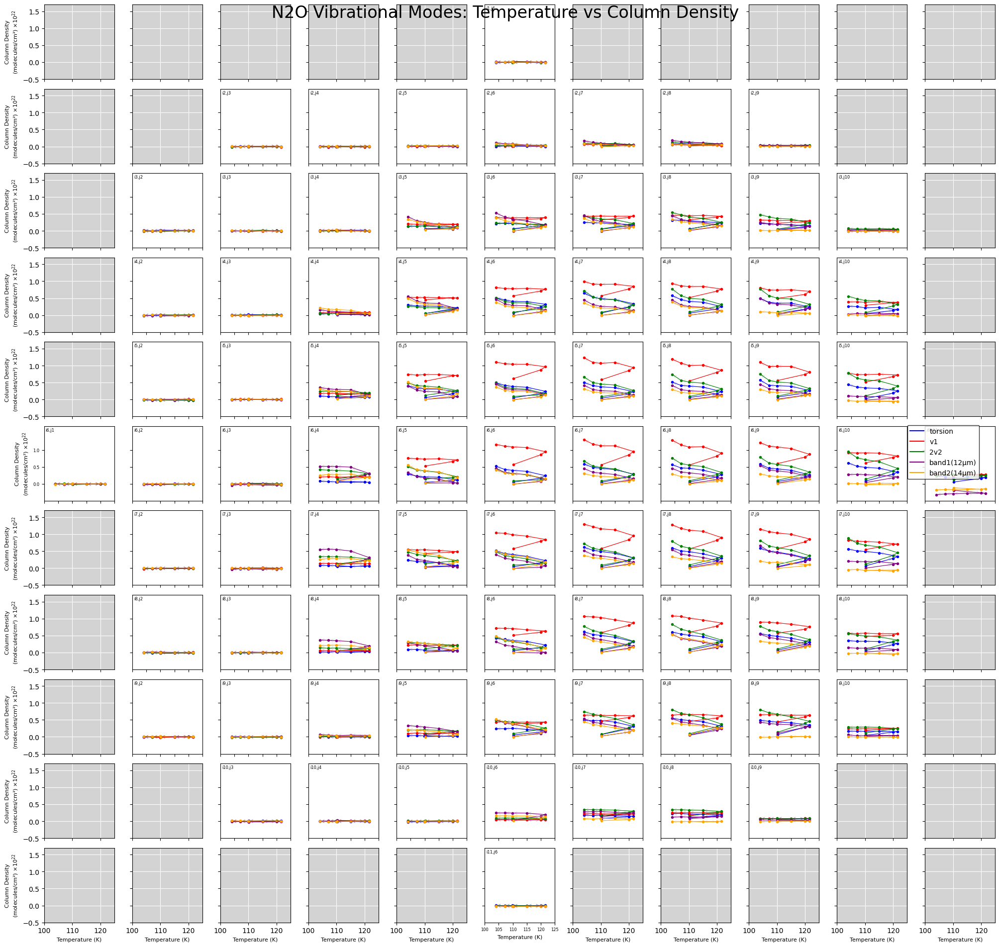

N2O振動モードの温度依存性の可視化が完了しました


In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# 温度変化の順序を保持するリスト
temperature_sequence = [110.19, 115.0, 120.0, 121.6, 115.0, 109.98, 107.17, 104.0]
folder_sequence = ['1413', '1423', '1432', '1440', '1445', '1449', '1453', '1513']

# N2Oの振動モードと波長の設定
modes = {
    'torsion': {'wavelength': 7270, 'color': 'blue'},
    'v1': {'wavelength': 7750, 'color': 'red'},
    '2v2': {'wavelength': 8600, 'color': 'green'},
    'band1(12μm)': {'wavelength': 12000, 'color': 'purple'},
    'band2(14μm)': {'wavelength': 14000, 'color': 'orange'}
}

# グリッドとパス設定
np_x = 11
np_y = 11
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/annealing/zipdata/'
EPSILON = 9.747e-16
PATH_LENGTH = 1.1e-7

# 円形領域の設定
center_x = 5
center_y = 5
radius = 5

# プロット作成
fig, axes = plt.subplots(11, 11, figsize=(20, 20))
fig.suptitle('N2O Vibrational Modes: Temperature vs Column Density', fontsize=24, y=0.95)
plt.subplots_adjust(wspace=0.05, hspace=0.05)

# 各グリッド位置でのプロット処理
for i in range(np_y):
    for j in range(np_x):
        ax = axes[i, j]
        
        # 中心からの距離計算
        distance = np.sqrt((i - center_y)**2 + (j - center_x)**2)
        
        # 円形領域外の処理
        if distance > radius:
            ax.set_facecolor('lightgray')
            ax.grid(True, color='white')
            ax.set_xlim([100, 125])
            ax.set_ylim([-0.5, 1.7])
            
            # 軸ラベル設定
            if i == 10:
                ax.set_xlabel('Temperature (K)', fontsize=8)
            else:
                ax.set_xticklabels([])
            if j == 0:
                ax.set_ylabel('Column Density\n(molecules/cm²) ×10$^{22}$', fontsize=8)
            else:
                ax.set_yticklabels([])
            continue
        
        # 円形領域内のデータ処理
        for mode_name, mode_info in modes.items():
            column_densities = []
            valid_temperatures = []
            
            # 各温度点でのデータ収集
            for temp, folder in zip(temperature_sequence, folder_sequence):
                try:
                    csv_path = f"{base_path}{folder}/absorbance_values_{mode_info['wavelength']}nm_{folder}.csv"
                    df = pd.read_csv(csv_path, index_col=0)
                    absorbance = df.iloc[i, j]
                    column_density = absorbance / (EPSILON * PATH_LENGTH) / 1e22
                    
                    valid_temperatures.append(temp)
                    column_densities.append(column_density)
                except:
                    continue
            
            # データプロットと矢印表示
            if len(valid_temperatures) > 1:
                ax.plot(valid_temperatures, column_densities, 'o-', 
                       color=mode_info['color'], markersize=3, linewidth=0.8)
                
                for idx in range(len(valid_temperatures)-1):
                    ax.annotate('', 
                              xy=(valid_temperatures[idx+1], column_densities[idx+1]),
                              xytext=(valid_temperatures[idx], column_densities[idx]),
                              arrowprops=dict(arrowstyle='->',
                                            color=mode_info['color'],
                                            alpha=0.3,
                                            linewidth=0.5))
        
        # グラフ設定
        ax.grid(True, color='white')
        ax.set_xlim([100, 125])
        ax.set_ylim([-0.5, 1.7])
        ax.set_yticks([0, 0.5, 1.0])
        ax.set_yticklabels(['0.0', '0.5', '1.0'])
        
        # ラベルとグリッド番号の設定
        if i == 10:
            ax.set_xlabel('Temperature (K)', fontsize=8)
        else:
            ax.set_xticklabels([])
        if j == 0:
            ax.set_ylabel('Column Density\n(molecules/cm²) ×10$^{22}$', fontsize=8)
        else:
            ax.set_yticklabels([])
            
        ax.text(0.02, 0.98, f'i{i+1},j{j+1}', 
                transform=ax.transAxes, 
                fontsize=6, 
                verticalalignment='top')
        
        ax.tick_params(axis='both', which='major', labelsize=6)

# 凡例の作成
legend_elements = [Line2D([0], [0], color=mode_info['color'], label=mode_name)
                  for mode_name, mode_info in modes.items()]
fig.legend(handles=legend_elements, 
          loc='center right',
          bbox_to_anchor=(0.98, 0.5), 
          fontsize=10,
          frameon=True,
          edgecolor='black')

# レイアウト調整と保存
plt.tight_layout()
fig.subplots_adjust(top=0.95)
plt.savefig('n2o_temperature_modes_circular.png', 
            bbox_inches='tight', 
            dpi=300,
            facecolor='white',
            edgecolor='none')

# 表示とクリーンアップ
plt.show()
plt.close()

print("N2O振動モードの温度依存性の可視化が完了しました")



<>:26: SyntaxWarning: invalid escape sequence '\m'
<>:27: SyntaxWarning: invalid escape sequence '\m'
<>:26: SyntaxWarning: invalid escape sequence '\m'
<>:27: SyntaxWarning: invalid escape sequence '\m'
C:\Users\daiki\AppData\Local\Temp\ipykernel_1272\315686759.py:26: SyntaxWarning: invalid escape sequence '\m'
  'band1(12 $\mu$m)': {'wavelength': 12000, 'color': 'purple', 'time_points': temperature_sequence},
C:\Users\daiki\AppData\Local\Temp\ipykernel_1272\315686759.py:27: SyntaxWarning: invalid escape sequence '\m'
  'band2(14 $\mu$m)': {'wavelength': 14000, 'color': 'orange', 'time_points': temperature_sequence}


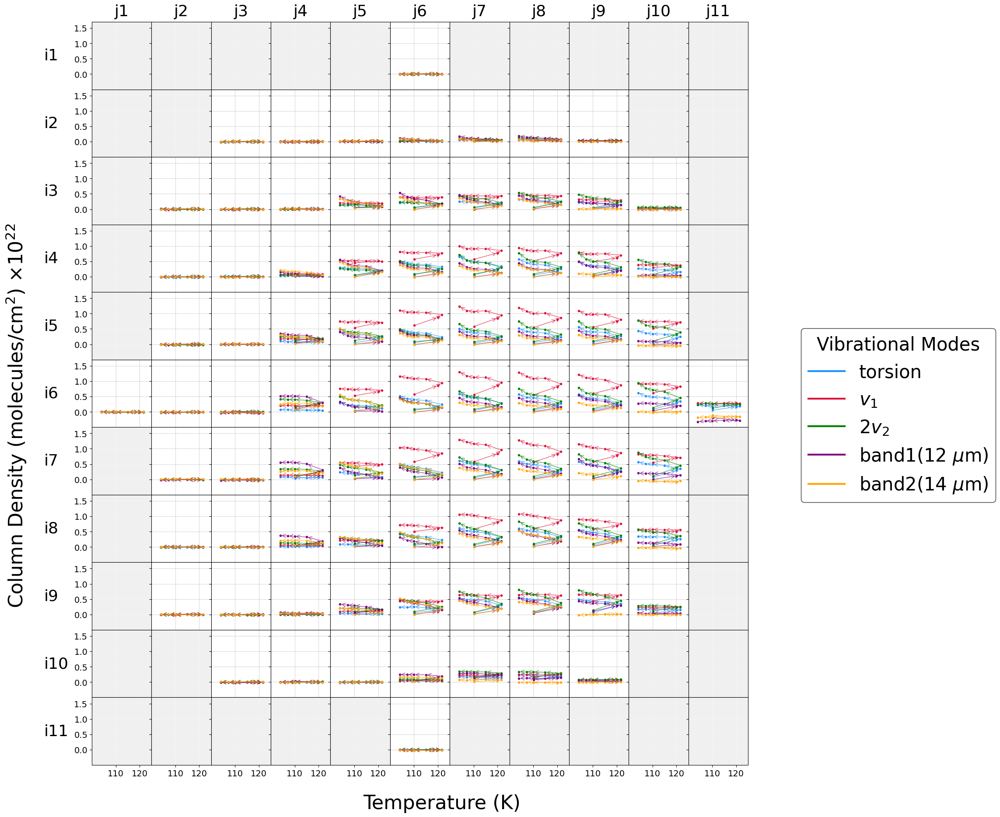

N2O振動モードの温度依存性の可視化が完了しました


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from scipy.interpolate import interp1d
from matplotlib import rcParams

# フォントサイズの設定を大きくする
rcParams['font.size'] = 14
rcParams['axes.labelsize'] = 16
rcParams['axes.titlesize'] = 16
rcParams['xtick.labelsize'] = 14
rcParams['ytick.labelsize'] = 14
rcParams['legend.fontsize'] = 14
rcParams['figure.titlesize'] = 18

# 温度変化の順序を保持するリスト
temperature_sequence = [110.19, 115.0, 120.0, 121.6, 115.0, 109.98, 107.17, 104.0]
folder_sequence = ['1413', '1423', '1432', '1440', '1445', '1449', '1453', '1513']

# N2Oの振動モードと波長の設定 - 下付き文字を使用するためにLaTeX形式で記述
modes = {
    'torsion (7.27 $\mu$m)': {'wavelength': 7270, 'color': 'dodgerblue', 'time_points': temperature_sequence},
    '$v_1$ (7.75 $\mu$m)': {'wavelength': 7750, 'color': 'crimson', 'time_points': temperature_sequence},
    '$2v_2$ (8.60 $\mu$m)': {'wavelength': 8600, 'color': 'green', 'time_points': temperature_sequence},
    'band1(12 $\mu$m)': {'wavelength': 12000, 'color': 'purple', 'time_points': temperature_sequence},
    'band2(14 $\mu$m)': {'wavelength': 14000, 'color': 'orange', 'time_points': temperature_sequence}
}

# グリッドとパス設定
np_x, np_y = 11, 11
center_x = center_y = 5
radius = 5
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/annealing/zipdata/'
EPSILON = 9.747e-16
PATH_LENGTH = 1.1e-7

# プロット作成
fig, axes = plt.subplots(11, 11, figsize=(20, 20))
plt.subplots_adjust(wspace=0, hspace=0, left=0.1, right=0.85, top=0.95, bottom=0.1)

# データ処理と可視化
for i in range(np_y):
    for j in range(np_x):
        ax = axes[i, j]
        distance = np.sqrt((i - center_y)**2 + (j - center_x)**2)
        
        # 解析範囲外の処理
        if distance > radius:
            ax.set_facecolor('#f0f0f0')  # 薄いグレー
        else:
            ax.set_facecolor('white')
            
            # 解析範囲内のデータ処理
            for mode_name, mode_info in modes.items():
                column_densities = []
                valid_temperatures = []
                
                # 各温度点でのデータ収集
                for temp, folder in zip(temperature_sequence, folder_sequence):
                    try:
                        csv_path = f"{base_path}{folder}/absorbance_values_{mode_info['wavelength']}nm_{folder}.csv"
                        df = pd.read_csv(csv_path, index_col=0)
                        absorbance = df.iloc[i, j]
                        column_density = absorbance / (EPSILON * PATH_LENGTH) / 1e22
                        
                        valid_temperatures.append(temp)
                        column_densities.append(column_density)
                    except:
                        continue
                
                if len(valid_temperatures) > 1:
                    # データポイントのプロット
                    ax.plot(valid_temperatures, column_densities, 'o',
                           color=mode_info['color'], markersize=3)
                    
                    # 矢印の表示
                    for idx in range(len(valid_temperatures)-1):
                        ax.annotate('',
                                  xy=(valid_temperatures[idx+1], column_densities[idx+1]),
                                  xytext=(valid_temperatures[idx], column_densities[idx]),
                                  arrowprops=dict(arrowstyle='->',
                                                color=mode_info['color'],
                                                alpha=0.7,
                                                linewidth=1.0))
        
        # グラフの基本設定
        ax.grid(True, color='white' if distance > radius else 'gray', alpha=0.3)
        ax.set_xlim([100, 125])
        ax.set_ylim([-0.5, 1.7])
        
        # x軸の目盛りを110, 120のみに設定
        ax.set_xticks([110, 120])
        ax.set_xticklabels(['110', '120'], fontsize=14)
        
        # y軸の目盛りを設定
        ax.set_yticks([0, 0.5, 1.0, 1.5])
        ax.set_yticklabels(['0.0', '0.5', '1.0', '1.5'], fontsize=14)
        
        # 一番下の行以外はx軸ラベルを非表示
        if i != 10:
            ax.set_xticklabels([])
        
        # 左端の列以外はy軸ラベルを非表示
        if j != 0:
            ax.set_yticklabels([])
        
        # 上部にj1-j11のラベルを表示
        if i == 0:
            ax.set_title(f'j{j+1}', fontsize=26, pad=10)
        
        # 左側にi1-i11のラベルを表示
        if j == 0:
            ax.text(-0.8, 0.5, f'i{i+1}', rotation=0,
                   transform=ax.transAxes, va='center', fontsize=26)

# 凡例の設定 - 分子種を下付き文字で表示、線を太く
legend_elements = [
    Line2D([0], [0], color=mode_info['color'], label=mode_name, linewidth=3)
    for mode_name, mode_info in modes.items()
]

# 凡例の配置（大きいフォントサイズ）
fig.legend(handles=legend_elements,
          loc='center left',
          bbox_to_anchor=(0.9, 0.5),
          fontsize=30,
          frameon=True,
          edgecolor='black',
          title='Vibrational Modes',
          title_fontsize=30)

# 全体のラベル設定
fig.text(0.5, 0.05, 'Temperature (K)', ha='center', fontsize=32)
fig.text(0.0, 0.5, 'Column Density (molecules/cm$^2$) ×10$^{22}$', va='center', rotation='vertical', fontsize=32)

# 保存と表示
plt.savefig('n2o_temperature_modes_circular_with_labels.png',
            bbox_inches='tight', dpi=300,
            facecolor='white', edgecolor='none')
plt.show()

print("N2O振動モードの温度依存性の可視化が完了しました")


<>:29: SyntaxWarning: invalid escape sequence '\m'
<>:30: SyntaxWarning: invalid escape sequence '\m'
<>:31: SyntaxWarning: invalid escape sequence '\m'
<>:32: SyntaxWarning: invalid escape sequence '\m'
<>:33: SyntaxWarning: invalid escape sequence '\m'
<>:29: SyntaxWarning: invalid escape sequence '\m'
<>:30: SyntaxWarning: invalid escape sequence '\m'
<>:31: SyntaxWarning: invalid escape sequence '\m'
<>:32: SyntaxWarning: invalid escape sequence '\m'
<>:33: SyntaxWarning: invalid escape sequence '\m'
C:\Users\daiki\AppData\Local\Temp\ipykernel_6952\1366010172.py:29: SyntaxWarning: invalid escape sequence '\m'
  'torsion': {'wavelength': 7270, 'color': 'blue', 'display_name': 'torsion (7.27 $\mu$m)'},
C:\Users\daiki\AppData\Local\Temp\ipykernel_6952\1366010172.py:30: SyntaxWarning: invalid escape sequence '\m'
  '$v_1$': {'wavelength': 7750, 'color': 'red', 'display_name': '$v_1$ (7.75 $\mu$m)'},
C:\Users\daiki\AppData\Local\Temp\ipykernel_6952\1366010172.py:31: SyntaxWarning: inval

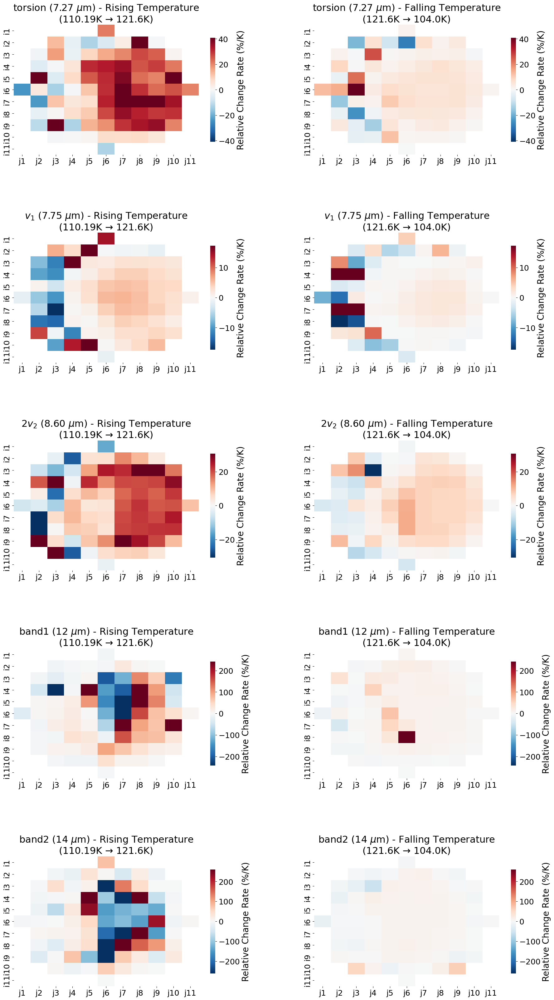


温度変化率の統計情報 (%/K):

torsion (7.27 $\mu$m):
温度上昇期 (基準: 110.19K):
平均: 16.522
標準偏差: 19.389
温度下降期 (基準: 121.6K):
平均: 3.841
標準偏差: 15.236

$v_1$ (7.75 $\mu$m):
温度上昇期 (基準: 110.19K):
平均: 10.064
標準偏差: 64.979
温度下降期 (基準: 121.6K):
平均: 2.409
標準偏差: 17.632

$2v_2$ (8.60 $\mu$m):
温度上昇期 (基準: 110.19K):
平均: 29.927
標準偏差: 175.924
温度下降期 (基準: 121.6K):
平均: 2.641
標準偏差: 5.993

band1 (12 $\mu$m):
温度上昇期 (基準: 110.19K):
平均: 41.877
標準偏差: 366.166
温度下降期 (基準: 121.6K):
平均: 13.827
標準偏差: 58.079

band2 (14 $\mu$m):
温度上昇期 (基準: 110.19K):
平均: -0.307
標準偏差: 242.725
温度下降期 (基準: 121.6K):
平均: 3.089
標準偏差: 13.753

可視化が完了しました


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import seaborn as sns
import matplotlib as mpl

# フォントサイズをさらに大きく設定
plt.rcParams.update({
    'font.size': 18,
    'axes.titlesize': 22,
    'axes.labelsize': 20,
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'legend.fontsize': 18,
    'figure.titlesize': 24
})

# 基本設定
temperature_sequence = [110.19, 115.0, 120.0, 121.6, 115.0, 109.98, 107.17, 104.0]
folder_sequence = ['1413', '1423', '1432', '1440', '1445', '1449', '1453', '1513']

# 温度上昇期と下降期の区分
rising_temps = temperature_sequence[:4]  # 110.19 → 121.6
falling_temps = temperature_sequence[3:]  # 121.6 → 104.0

# N2Oの振動モードと波長の設定（波長情報を表示名に含める）
modes = {
    'torsion': {'wavelength': 7270, 'color': 'blue', 'display_name': 'torsion (7.27 $\mu$m)'},
    '$v_1$': {'wavelength': 7750, 'color': 'red', 'display_name': '$v_1$ (7.75 $\mu$m)'},
    '$2v_2$': {'wavelength': 8600, 'color': 'green', 'display_name': '$2v_2$ (8.60 $\mu$m)'},
    'band1': {'wavelength': 12000, 'color': 'purple', 'display_name': 'band1 (12 $\mu$m)'},
    'band2': {'wavelength': 14000, 'color': 'orange', 'display_name': 'band2 (14 $\mu$m)'}
}

# グリッドとパス設定
np_x, np_y = 11, 11
center_x = center_y = 5
radius = 5
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/annealing/zipdata/'
EPSILON = 9.747e-16
PATH_LENGTH = 1.1e-7

def calculate_rate(temps, densities, is_rising=True):
    """温度変化に対する相対変化率を計算 (%/K)"""
    if len(temps) < 2:
        return np.nan
    
    if is_rising:
        # 温度上昇時: 110.19Kを基準
        reference_density = densities[0]  # 110.19Kでの値
        temp_reference = temps[0]  # 110.19K
        sign = 1
    else:
        # 温度下降時: 121.6Kを基準
        reference_density = densities[0]  # 121.6Kでの値
        temp_reference = temps[0]  # 121.6K
        sign = -1  # 温度下降時は符号を反転
    
    relative_changes = [(d - reference_density)/reference_density * 100 for d in densities]
    temp_changes = [t - temp_reference for t in temps]
    
    return sign * np.polyfit(temp_changes, relative_changes, 1)[0]

def get_column_densities(i, j, temp_range, folder_range, mode_info):
    """指定された温度範囲でのカラム密度を取得"""
    temps = []
    densities = []
    for temp, folder in zip(temp_range, folder_range):
        try:
            csv_path = f"{base_path}{folder}/absorbance_values_{mode_info['wavelength']}nm_{folder}.csv"
            df = pd.read_csv(csv_path, index_col=0)
            absorbance = df.iloc[i, j]
            density = absorbance / (EPSILON * PATH_LENGTH) / 1e22
            temps.append(temp)
            densities.append(density)
        except:
            continue
    return temps, densities

# 結果を格納する辞書
rate_maps = {
    mode: {
        'rising': np.full((np_y, np_x), np.nan),
        'falling': np.full((np_y, np_x), np.nan)
    } for mode in modes.keys()
}

# 各グリッドポイントで変化率を計算
for i in range(np_y):
    for j in range(np_x):
        distance = np.sqrt((i - center_y)**2 + (j - center_x)**2)
        if distance > radius:
            continue
            
        for mode_name, mode_info in modes.items():
            # 温度上昇期の変化率計算
            rising_folders = folder_sequence[:4]
            temps, densities = get_column_densities(i, j, rising_temps, rising_folders, mode_info)
            rate_maps[mode_name]['rising'][i, j] = calculate_rate(temps, densities, is_rising=True)
            
            # 温度下降期の変化率計算
            falling_folders = folder_sequence[3:]
            temps, densities = get_column_densities(i, j, falling_temps, falling_folders, mode_info)
            rate_maps[mode_name]['falling'][i, j] = calculate_rate(temps, densities, is_rising=False)

# 全モードを1つの大きな図にまとめて表示 - 縦の長さを大きくする
fig = plt.figure(figsize=(22, 40))  # 縦の長さを30から40に増加
gs = fig.add_gridspec(len(modes), 2, hspace=0.6, wspace=0.3)  # hspaceを0.5から0.6に増加

# マスクの作成
mask = np.zeros((np_y, np_x), dtype=bool)
for i in range(np_y):
    for j in range(np_x):
        if np.sqrt((i - center_y)**2 + (j - center_x)**2) > radius:
            mask[i, j] = True

for idx, (mode_name, mode_info) in enumerate(modes.items()):
    ax1 = fig.add_subplot(gs[idx, 0])
    ax2 = fig.add_subplot(gs[idx, 1])
    
    # データの正規化のための最大・最小値を計算
    all_data = np.concatenate([
        rate_maps[mode_name]['rising'][~mask],
        rate_maps[mode_name]['falling'][~mask]
    ])
    vmax = np.nanpercentile(np.abs(all_data), 95)
    vmin = -vmax
    
    # 温度上昇期のヒートマップ
    rising_data = np.ma.masked_array(rate_maps[mode_name]['rising'], mask)
    heatmap1 = sns.heatmap(rising_data, ax=ax1, cmap='RdBu_r', center=0,
                vmin=vmin, vmax=vmax,
                cbar_kws={'label': 'Relative Change Rate (%/K)', 'shrink': 0.8})
    
    # カラーバーのフォントサイズを大きく
    cbar1 = heatmap1.collections[0].colorbar
    cbar1.ax.tick_params(labelsize=18)
    cbar1.set_label('Relative Change Rate (%/K)', fontsize=20)
    
    ax1.set_title(f'{mode_info["display_name"]} - Rising Temperature\n(110.19K → 121.6K)', fontsize=22)
    
    # グリッドラベルをi1-i11, j1-j11に変更
    ax1.set_xticks(np.arange(np_x) + 0.5)
    ax1.set_yticks(np.arange(np_y) + 0.5)
    ax1.set_xticklabels([f'j{j+1}' for j in range(np_x)])
    ax1.set_yticklabels([f'i{i+1}' for i in range(np_y)])
    ax1.tick_params(axis='both', which='major', labelsize=18)
    
    # 温度下降期のヒートマップ
    falling_data = np.ma.masked_array(rate_maps[mode_name]['falling'], mask)
    heatmap2 = sns.heatmap(falling_data, ax=ax2, cmap='RdBu_r', center=0,
                vmin=vmin, vmax=vmax,
                cbar_kws={'label': 'Relative Change Rate (%/K)', 'shrink': 0.8})
    
    # カラーバーのフォントサイズを大きく
    cbar2 = heatmap2.collections[0].colorbar
    cbar2.ax.tick_params(labelsize=18)
    cbar2.set_label('Relative Change Rate (%/K)', fontsize=20)
    
    ax2.set_title(f'{mode_info["display_name"]} - Falling Temperature\n(121.6K → 104.0K)', fontsize=22)
    
    # グリッドラベルをi1-i11, j1-j11に変更
    ax2.set_xticks(np.arange(np_x) + 0.5)
    ax2.set_yticks(np.arange(np_y) + 0.5)
    ax2.set_xticklabels([f'j{j+1}' for j in range(np_x)])
    ax2.set_yticklabels([f'i{i+1}' for i in range(np_y)])
    ax2.tick_params(axis='both', which='major', labelsize=18)

plt.tight_layout()

# 保存と表示
plt.savefig('n2o_temperature_change_rates_final.png', 
            dpi=300, bbox_inches='tight',
            facecolor='white', edgecolor='none')
plt.show()
plt.close()

# 統計情報の出力
print("\n温度変化率の統計情報 (%/K):")
for mode_name, mode_info in modes.items():
    print(f"\n{mode_info['display_name']}:")
    print("温度上昇期 (基準: 110.19K):")
    rising_stats = rate_maps[mode_name]['rising'][~mask]
    print(f"平均: {np.nanmean(rising_stats):.3f}")
    print(f"標準偏差: {np.nanstd(rising_stats):.3f}")
    print("温度下降期 (基準: 121.6K):")
    falling_stats = rate_maps[mode_name]['falling'][~mask]
    print(f"平均: {np.nanmean(falling_stats):.3f}")
    print(f"標準偏差: {np.nanstd(falling_stats):.3f}")

print("\n可視化が完了しました")


<>:29: SyntaxWarning: invalid escape sequence '\m'
<>:30: SyntaxWarning: invalid escape sequence '\m'
<>:31: SyntaxWarning: invalid escape sequence '\m'
<>:32: SyntaxWarning: invalid escape sequence '\m'
<>:33: SyntaxWarning: invalid escape sequence '\m'
<>:29: SyntaxWarning: invalid escape sequence '\m'
<>:30: SyntaxWarning: invalid escape sequence '\m'
<>:31: SyntaxWarning: invalid escape sequence '\m'
<>:32: SyntaxWarning: invalid escape sequence '\m'
<>:33: SyntaxWarning: invalid escape sequence '\m'
C:\Users\daiki\AppData\Local\Temp\ipykernel_6952\3142455275.py:29: SyntaxWarning: invalid escape sequence '\m'
  'torsion': {'wavelength': 7270, 'color': 'blue', 'display_name': 'torsion (7.27 $\mu$m)'},
C:\Users\daiki\AppData\Local\Temp\ipykernel_6952\3142455275.py:30: SyntaxWarning: invalid escape sequence '\m'
  '$v_1$': {'wavelength': 7750, 'color': 'red', 'display_name': '$v_1$ (7.75 $\mu$m)'},
C:\Users\daiki\AppData\Local\Temp\ipykernel_6952\3142455275.py:31: SyntaxWarning: inval

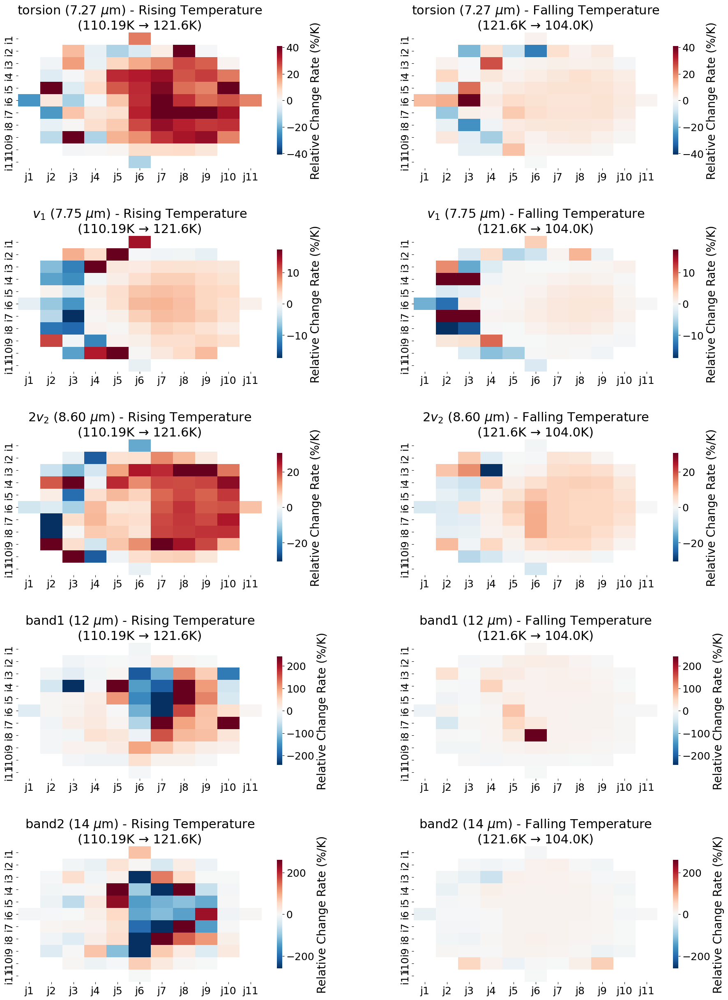


温度変化率の統計情報 (%/K):

torsion (7.27 $\mu$m):
温度上昇期 (基準: 110.19K):
平均: 16.522
標準偏差: 19.389
温度下降期 (基準: 121.6K):
平均: 3.841
標準偏差: 15.236

$v_1$ (7.75 $\mu$m):
温度上昇期 (基準: 110.19K):
平均: 10.064
標準偏差: 64.979
温度下降期 (基準: 121.6K):
平均: 2.409
標準偏差: 17.632

$2v_2$ (8.60 $\mu$m):
温度上昇期 (基準: 110.19K):
平均: 29.927
標準偏差: 175.924
温度下降期 (基準: 121.6K):
平均: 2.641
標準偏差: 5.993

band1 (12 $\mu$m):
温度上昇期 (基準: 110.19K):
平均: 41.877
標準偏差: 366.166
温度下降期 (基準: 121.6K):
平均: 13.827
標準偏差: 58.079

band2 (14 $\mu$m):
温度上昇期 (基準: 110.19K):
平均: -0.307
標準偏差: 242.725
温度下降期 (基準: 121.6K):
平均: 3.089
標準偏差: 13.753

可視化が完了しました


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import seaborn as sns
import matplotlib as mpl

# フォントサイズをさらに大きく設定
plt.rcParams.update({
    'font.size': 18,
    'axes.titlesize': 22,
    'axes.labelsize': 20,
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'legend.fontsize': 18,
    'figure.titlesize': 24
})

# 基本設定
temperature_sequence = [110.19, 115.0, 120.0, 121.6, 115.0, 109.98, 107.17, 104.0]
folder_sequence = ['1413', '1423', '1432', '1440', '1445', '1449', '1453', '1513']

# 温度上昇期と下降期の区分
rising_temps = temperature_sequence[:4]  # 110.19 → 121.6
falling_temps = temperature_sequence[3:]  # 121.6 → 104.0

# N2Oの振動モードと波長の設定（波長情報を表示名に含める）
modes = {
    'torsion': {'wavelength': 7270, 'color': 'blue', 'display_name': 'torsion (7.27 $\mu$m)'},
    '$v_1$': {'wavelength': 7750, 'color': 'red', 'display_name': '$v_1$ (7.75 $\mu$m)'},
    '$2v_2$': {'wavelength': 8600, 'color': 'green', 'display_name': '$2v_2$ (8.60 $\mu$m)'},
    'band1': {'wavelength': 12000, 'color': 'purple', 'display_name': 'band1 (12 $\mu$m)'},
    'band2': {'wavelength': 14000, 'color': 'orange', 'display_name': 'band2 (14 $\mu$m)'}
}

# グリッドとパス設定
np_x, np_y = 11, 11
center_x = center_y = 5
radius = 5
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/annealing/zipdata/'
EPSILON = 9.747e-16
PATH_LENGTH = 1.1e-7

def calculate_rate(temps, densities, is_rising=True):
    """温度変化に対する相対変化率を計算 (%/K)"""
    if len(temps) < 2:
        return np.nan
    
    if is_rising:
        # 温度上昇時: 110.19Kを基準
        reference_density = densities[0]  # 110.19Kでの値
        temp_reference = temps[0]  # 110.19K
        sign = 1
    else:
        # 温度下降時: 121.6Kを基準
        reference_density = densities[0]  # 121.6Kでの値
        temp_reference = temps[0]  # 121.6K
        sign = -1  # 温度下降時は符号を反転
    
    relative_changes = [(d - reference_density)/reference_density * 100 for d in densities]
    temp_changes = [t - temp_reference for t in temps]
    
    return sign * np.polyfit(temp_changes, relative_changes, 1)[0]

def get_column_densities(i, j, temp_range, folder_range, mode_info):
    """指定された温度範囲でのカラム密度を取得"""
    temps = []
    densities = []
    for temp, folder in zip(temp_range, folder_range):
        try:
            csv_path = f"{base_path}{folder}/absorbance_values_{mode_info['wavelength']}nm_{folder}.csv"
            df = pd.read_csv(csv_path, index_col=0)
            absorbance = df.iloc[i, j]
            density = absorbance / (EPSILON * PATH_LENGTH) / 1e22
            temps.append(temp)
            densities.append(density)
        except:
            continue
    return temps, densities

# 結果を格納する辞書
rate_maps = {
    mode: {
        'rising': np.full((np_y, np_x), np.nan),
        'falling': np.full((np_y, np_x), np.nan)
    } for mode in modes.keys()
}

# 各グリッドポイントで変化率を計算
for i in range(np_y):
    for j in range(np_x):
        distance = np.sqrt((i - center_y)**2 + (j - center_x)**2)
        if distance > radius:
            continue
            
        for mode_name, mode_info in modes.items():
            # 温度上昇期の変化率計算
            rising_folders = folder_sequence[:4]
            temps, densities = get_column_densities(i, j, rising_temps, rising_folders, mode_info)
            rate_maps[mode_name]['rising'][i, j] = calculate_rate(temps, densities, is_rising=True)
            
            # 温度下降期の変化率計算
            falling_folders = folder_sequence[3:]
            temps, densities = get_column_densities(i, j, falling_temps, falling_folders, mode_info)
            rate_maps[mode_name]['falling'][i, j] = calculate_rate(temps, densities, is_rising=False)

# 全モードを1つの大きな図にまとめて表示
fig = plt.figure(figsize=(22, 30))
gs = fig.add_gridspec(len(modes), 2, hspace=0.5, wspace=0.3)  # 間隔を広げる

# マスクの作成
mask = np.zeros((np_y, np_x), dtype=bool)
for i in range(np_y):
    for j in range(np_x):
        if np.sqrt((i - center_y)**2 + (j - center_x)**2) > radius:
            mask[i, j] = True

for idx, (mode_name, mode_info) in enumerate(modes.items()):
    ax1 = fig.add_subplot(gs[idx, 0])
    ax2 = fig.add_subplot(gs[idx, 1])
    
    # データの正規化のための最大・最小値を計算
    all_data = np.concatenate([
        rate_maps[mode_name]['rising'][~mask],
        rate_maps[mode_name]['falling'][~mask]
    ])
    vmax = np.nanpercentile(np.abs(all_data), 95)
    vmin = -vmax
    
    # 温度上昇期のヒートマップ
    rising_data = np.ma.masked_array(rate_maps[mode_name]['rising'], mask)
    heatmap1 = sns.heatmap(rising_data, ax=ax1, cmap='RdBu_r', center=0,
                vmin=vmin, vmax=vmax,
                cbar_kws={'label': 'Relative Change Rate (%/K)', 'shrink': 0.8})
    
    # カラーバーのフォントサイズを大きく
    cbar1 = heatmap1.collections[0].colorbar
    cbar1.ax.tick_params(labelsize=18)
    cbar1.set_label('Relative Change Rate (%/K)', fontsize=20)
    
    ax1.set_title(f'{mode_info["display_name"]} - Rising Temperature\n(110.19K → 121.6K)', fontsize=22)
    
    # グリッドラベルをi1-i11, j1-j11に変更
    ax1.set_xticks(np.arange(np_x) + 0.5)
    ax1.set_yticks(np.arange(np_y) + 0.5)
    ax1.set_xticklabels([f'j{j+1}' for j in range(np_x)])
    ax1.set_yticklabels([f'i{i+1}' for i in range(np_y)])
    ax1.tick_params(axis='both', which='major', labelsize=18)
    
    # 温度下降期のヒートマップ
    falling_data = np.ma.masked_array(rate_maps[mode_name]['falling'], mask)
    heatmap2 = sns.heatmap(falling_data, ax=ax2, cmap='RdBu_r', center=0,
                vmin=vmin, vmax=vmax,
                cbar_kws={'label': 'Relative Change Rate (%/K)', 'shrink': 0.8})
    
    # カラーバーのフォントサイズを大きく
    cbar2 = heatmap2.collections[0].colorbar
    cbar2.ax.tick_params(labelsize=18)
    cbar2.set_label('Relative Change Rate (%/K)', fontsize=20)
    
    ax2.set_title(f'{mode_info["display_name"]} - Falling Temperature\n(121.6K → 104.0K)', fontsize=22)
    
    # グリッドラベルをi1-i11, j1-j11に変更
    ax2.set_xticks(np.arange(np_x) + 0.5)
    ax2.set_yticks(np.arange(np_y) + 0.5)
    ax2.set_xticklabels([f'j{j+1}' for j in range(np_x)])
    ax2.set_yticklabels([f'i{i+1}' for i in range(np_y)])
    ax2.tick_params(axis='both', which='major', labelsize=18)

plt.tight_layout()

# 保存と表示
plt.savefig('n2o_temperature_change_rates_final.png', 
            dpi=300, bbox_inches='tight',
            facecolor='white', edgecolor='none')
plt.show()
plt.close()

# 統計情報の出力
print("\n温度変化率の統計情報 (%/K):")
for mode_name, mode_info in modes.items():
    print(f"\n{mode_info['display_name']}:")
    print("温度上昇期 (基準: 110.19K):")
    rising_stats = rate_maps[mode_name]['rising'][~mask]
    print(f"平均: {np.nanmean(rising_stats):.3f}")
    print(f"標準偏差: {np.nanstd(rising_stats):.3f}")
    print("温度下降期 (基準: 121.6K):")
    falling_stats = rate_maps[mode_name]['falling'][~mask]
    print(f"平均: {np.nanmean(falling_stats):.3f}")
    print(f"標準偏差: {np.nanstd(falling_stats):.3f}")

print("\n可視化が完了しました")


In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from matplotlib.lines import Line2D

# 波長関連のパラメータ設定
nw = 1000  # 波長ポイント数
yw = np.linspace(5000, 15000, nw)  # 5000-15000nmの範囲で1000点

# グリッド設定
np_x = 11  # x方向グリッド数
np_y = 11  # y方向グリッド数
sbin = 46  # ビンサイズ

# グリッド開始位置の配列生成
x0 = np.arange(0, 640, sbin)[:11]  # x方向の開始位置
y0 = np.arange(0, 512, sbin)[:11]  # y方向の開始位置

# データファイルパスの設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'

# 分子種ごとの設定（波長、時間点、フォルダ名）
molecules = {
    'NO(5.34μm)': {
        'wavelength': 5340,
        'time_points': ['1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O4(5.33μm)': {
        'wavelength': 5330,
        'time_points': ['1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'cis-(NO)2(5.37μm)': {
        'wavelength': 5370,
        'time_points': ['1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
        'N2O3(5.45μm)': {
        'wavelength': 5450,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'cis-(NO)2(5.67μm)': {
        'wavelength': 5670,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O4(5.82μm)': {
        'wavelength': 5820,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'NO2＆N2O3(6.23μm)': {
        'wavelength': 6230,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O3(6.31μm)': {
        'wavelength': 6310,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'NO3(6.90μm)': {
        'wavelength': 6900,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [ 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O(7.27μm)': {
        'wavelength': 7270,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O(7.75μm)': {
        'wavelength': 7750,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O3＆NO2(7.66μm)': {
        'wavelength': 7660,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O(8.60μm)': {
        'wavelength': 8600,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'O3(9.59μm)': {
        'wavelength': 9590,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'O3(10.30μm)': {
        'wavelength': 10300,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'NO3(10.48μm)': {
        'wavelength': 10480,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'NO3(12.40μm)': {
        'wavelength': 12400,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O(12.73μm)': {
        'wavelength': 12730,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O3(12.90μm)': {
        'wavelength': 12900,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'NO2(13.28μm)': {
        'wavelength': 13280,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O4(13.28μm)': {
        'wavelength': 13280,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N2O5(13.58μm)': {
        'wavelength': 13580,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'O3(14.18μm)': {
        'wavelength': 14180,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    }
}


# 円形測定領域の設定
center_x = 5  # 中心のx座標 (0-based index)
center_y = 5  # 中心のy座標
radius = 5    # 測定領域の半径（グリッド単位）

# 全分子種を表示するための大きなfigureを作成
fig, axes = plt.subplots(11, 11, figsize=(20, 20))
fig.suptitle('All Molecules Time vs Column Density', fontsize=24, y=0.95)
plt.subplots_adjust(wspace=0, hspace=0)

# カラー設定を更新 - N2O(7.75μm)を赤色に、O3は別の色、他の分子種は虹色のグラデーションで
molecule_colors = {}

# N2O(7.75μm)を赤色で設定
molecule_colors['N2O(7.75μm)'] = 'red'

# O3関連の分子種を抽出
o3_molecules = ['O3(9.59μm)', 'O3(10.30μm)', 'O3(14.18μm)']

# O3以外の残りの分子種に対して虹色のグラデーションを適用
remaining_molecules = [mol for mol in molecules.keys() 
                      if mol != 'N2O(7.75μm)' and mol not in o3_molecules]
rainbow_colors = plt.cm.rainbow(np.linspace(0, 1, len(remaining_molecules)))
for mol, color in zip(remaining_molecules, rainbow_colors):
    molecule_colors[mol] = color

# O3分子種に対して青系の色を割り当て
o3_colors = plt.cm.Blues(np.linspace(0.5, 0.9, len(o3_molecules)))
for mol, color in zip(o3_molecules, o3_colors):
    molecule_colors[mol] = color




# Beer-Lambertの法則に関する定数設定
EPSILON = 9.747e-16
PATH_LENGTH = 1.1e-7
MAX_ABSORBANCE = 1.7
MIN_ABSORBANCE = -0.5
MAX_COLUMN_DENSITY = MAX_ABSORBANCE / (EPSILON * PATH_LENGTH) / 1e22
MIN_COLUMN_DENSITY = MIN_ABSORBANCE / (EPSILON * PATH_LENGTH) / 1e22

# 各分子種のデータ読み込みと処理
molecule_dataframes = {}
for molecule_name, settings in molecules.items():
    print(f"Processing {molecule_name}...")
    dataframes = {}
    for tp in settings['time_points']:
        csv_path = f"{base_path}{tp}/absorbance_values_{settings['wavelength']}nm_{tp}.csv"
        df_absorbance = pd.read_csv(csv_path, index_col=0)
        dataframes[tp] = df_absorbance
    molecule_dataframes[molecule_name] = dataframes

# 補間データ格納用の配列
interpolated_curves = {}
for molecule_name in molecules.keys():
    interpolated_curves[molecule_name] = np.zeros((11, 11, 1000))

# データ取得と補間処理の部分を修正
for i in range(11):
    for j in range(11):
        ax = axes[i, j]
        distance = np.sqrt((i - center_y)**2 + (j - center_x)**2)
        
        if distance <= radius:
            for molecule_name, settings in molecules.items():
                # 有効なデータポイントのみを収集
                absorbance_values = []
                valid_times = []
                
                for tp, t in zip(settings['time_points'], settings['time']):
                    try:
                        value = molecule_dataframes[molecule_name][tp].iloc[i, j]
                        absorbance_values.append(value)
                        valid_times.append(t)
                    except:
                        continue
                
                # カラム密度計算
                column_density_values = [abs / (EPSILON * PATH_LENGTH) / 1e22 
                                      for abs in absorbance_values]
                
                # 補間用の時間配列
                time_fine = np.linspace(min(valid_times), max(valid_times), 1000)
                
                # 補間実行
                interp_func = interp1d(valid_times, column_density_values, kind='linear')
                interpolated_values = interp_func(time_fine)
                interpolated_curves[molecule_name][i, j] = interpolated_values
                
                # プロット
                ax.plot(valid_times, column_density_values, 'o', 
                       color=molecule_colors[molecule_name], markersize=2)
                ax.plot(time_fine, interpolated_values, '-', 
                       color=molecule_colors[molecule_name], linewidth=1, alpha=0.5)


        # グラフの基本設定
        ax.grid(True, color='white')
        ax.set_xlim([0, 510])
        ax.set_ylim([MIN_COLUMN_DENSITY, MAX_COLUMN_DENSITY])
        ax.set_yticks([-0.5, 0, 0.5, 1.0, 1.5])
        ax.set_yticklabels(['-0.5', '0.0', '0.5', '1.0', '1.5'])

        # 軸ラベルの設定
        if i != 10:
            ax.set_xticklabels([])
        if j != 0:
            ax.set_yticklabels([])
        if i == 0:
            ax.set_title(f'j{j+1}')
        if j == 0:
            ax.text(-0.5, 0.5, f'i{i+1}', rotation=0,
                   transform=ax.transAxes, va='center')

# 凡例の追加（図の右側に配置）
legend_elements = [Line2D([0], [0], color=molecule_colors[name], label=name)
                  for name in molecules.keys()]
fig.legend(handles=legend_elements, loc='center left', 
          bbox_to_anchor=(1.02, 0.5), fontsize=12)

# 全体のラベル設定
fig.text(0.5, 0.08, 'Time (min)', ha='center', fontsize=20)
fig.text(0.06, 0.5, 'Column Density (molecules/cm²) ×10$^{22}$', 
         va='center', rotation='vertical', fontsize=20)

# 補間データの保存
for molecule_name in molecules.keys():
    np.save(f'{molecule_name}_interpolated_curves.npy', interpolated_curves[molecule_name])

# プロットの保存と終了
plt.savefig('all_molecules_time_series.png', bbox_inches='tight', dpi=300)
plt.close()

print("Completed all molecules analysis with linear interpolation")

Processing NO(5.34μm)...
Processing N2O4(5.33μm)...
Processing cis-(NO)2(5.37μm)...
Processing N2O3(5.45μm)...
Processing cis-(NO)2(5.67μm)...
Processing N2O4(5.82μm)...
Processing NO2＆N2O3(6.23μm)...
Processing N2O3(6.31μm)...
Processing NO3(6.90μm)...
Processing N2O(7.27μm)...
Processing N2O(7.75μm)...
Processing N2O3＆NO2(7.66μm)...
Processing N2O(8.60μm)...
Processing O3(9.59μm)...
Processing O3(10.30μm)...
Processing NO3(10.48μm)...
Processing NO3(12.40μm)...
Processing N2O(12.73μm)...
Processing N2O3(12.90μm)...
Processing NO2(13.28μm)...
Processing N2O4(13.28μm)...
Processing N2O5(13.58μm)...
Processing O3(14.18μm)...


C:\Users\daiki\AppData\Local\Temp\ipykernel_32524\2204327965.py:343: UserWarning: Glyph 65286 (\N{FULLWIDTH AMPERSAND}) missing from font(s) DejaVu Sans.
  plt.savefig('all_molecules_time_series.png', bbox_inches='tight', dpi=300)


Completed all molecules analysis with linear interpolation


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from matplotlib.lines import Line2D

# 波長関連のパラメータ設定
nw = 1000  # 波長ポイント数
yw = np.linspace(5000, 15000, nw)  # 5000-15000nmの範囲で1000点

# グリッド設定
np_x = 11  # x方向グリッド数
np_y = 11  # y方向グリッド数
sbin = 46  # ビンサイズ

# グリッド開始位置の配列生成
x0 = np.arange(0, 640, sbin)[:11]  # x方向の開始位置
y0 = np.arange(0, 512, sbin)[:11]  # y方向の開始位置

# データファイルパスの設定
base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'

# 分子種ごとの設定（波長、時間点、フォルダ名）- &記号に変更
molecules = {
    'NO(5.34 μm)': {
        'wavelength': 5340,
        'time_points': ['1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N₂O₄(5.33 μm)': {
        'wavelength': 5330,
        'time_points': ['1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'cis-(NO)₂(5.37 μm)': {
        'wavelength': 5370,
        'time_points': ['1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N₂O₃(5.45 μm)': {
        'wavelength': 5450,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'cis-(NO)₂(5.67 μm)': {
        'wavelength': 5670,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N₂O₄(5.82 μm)': {
        'wavelength': 5820,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'NO₂&N₂O₃(6.23 μm)': {
        'wavelength': 6230,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N₂O₃(6.31 μm)': {
        'wavelength': 6310,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'NO₃(6.90 μm)': {
        'wavelength': 6900,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [ 60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N₂O(7.27 μm)': {
        'wavelength': 7270,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N₂O(7.75 μm)': {
        'wavelength': 7750,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N₂O₃&NO₂(7.66 μm)': {
        'wavelength': 7660,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N₂O(8.60 μm)': {
        'wavelength': 8600,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'O₃(9.59 μm)': {
        'wavelength': 9590,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'O₃(10.30 μm)': {
        'wavelength': 10300,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'NO₃(10.48 μm)': {
        'wavelength': 10480,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'NO₃(12.40 μm)': {
        'wavelength': 12400,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N₂O(12.73 μm)': {
        'wavelength': 12730,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N₂O₃(12.90 μm)': {
        'wavelength': 12900,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                                              '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'NO₂(13.28 μm)': {
        'wavelength': 13280,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N₂O₄(13.28 μm)': {
        'wavelength': 13280,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'N₂O₅(13.58 μm)': {
        'wavelength': 13580,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    },
    'O₃(14.18 μm)': {
        'wavelength': 14180,
        'time_points': ['1104', '1114', '1124', '1134', '1144',
                       '1154', '1204', '1214', '1244', '1314', '1344', '1414', '1444', '1514', '1544',
                       '1614', '1644', '1714', '1744', '1814', '1837'],
        'time': [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    }
}


# 円形測定領域の設定
center_x = 5  # 中心のx座標 (0-based index)
center_y = 5  # 中心のy座標
radius = 5    # 測定領域の半径（グリッド単位）

# 全分子種を表示するための大きなfigureを作成
fig, axes = plt.subplots(11, 11, figsize=(20, 20))
plt.subplots_adjust(wspace=0, hspace=0)

# カラー設定を修正 - 色を濃くする
molecule_colors = {}
molecule_colors['N2O(7.75μm)'] = 'darkred'  # 赤色を濃く

# 他の分子種の色も濃くする
o3_molecules = ['O3(9.59μm)', 'O3(10.30μm)', 'O3(14.18μm)']
remaining_molecules = [mol for mol in molecules.keys() 
                      if mol != 'N2O(7.75μm)' and mol not in o3_molecules]

# 彩度と明度を下げて色を濃くする
rainbow_colors = plt.cm.rainbow(np.linspace(0, 1, len(remaining_molecules)))
for i, (mol, color) in enumerate(zip(remaining_molecules, rainbow_colors)):
    # HSVに変換して彩度と明度を調整し、色を濃くする
    hsv = plt.matplotlib.colors.rgb_to_hsv(color[:3])
    hsv[1] = min(hsv[1] * 0.8, 0.8)  # 彩度を上げる
    hsv[2] = max(hsv[2] * 1.0, 0.9)  # 明度を下げる
    rgb = plt.matplotlib.colors.hsv_to_rgb(hsv)
    molecule_colors[mol] = rgb

# O3分子の色も濃くする
o3_colors = plt.cm.Blues(np.linspace(0.6, 1.0, len(o3_molecules)))
for i, (mol, color) in enumerate(zip(o3_molecules, o3_colors)):
    hsv = plt.matplotlib.colors.rgb_to_hsv(color[:3])
    hsv[1] = min(hsv[1] * 0.8, 0.8)
    hsv[2] = max(hsv[2] * 1.0, 0.9)
    rgb = plt.matplotlib.colors.hsv_to_rgb(hsv)
    molecule_colors[mol] = rgb

# Beer-Lambertの法則に関する定数設定
EPSILON = 9.747e-16
PATH_LENGTH = 1.1e-7
MAX_ABSORBANCE = 1.7
MIN_ABSORBANCE = 0  # 負の値を許可しない
MAX_COLUMN_DENSITY = MAX_ABSORBANCE / (EPSILON * PATH_LENGTH) / 1e22
MIN_COLUMN_DENSITY = 0  # 負の値を許可しない

# 各分子種のデータ読み込みと処理
molecule_dataframes = {}
for molecule_name, settings in molecules.items():
    print(f"Processing {molecule_name}...")
    dataframes = {}
    for tp in settings['time_points']:
        csv_path = f"{base_path}{tp}/absorbance_values_{settings['wavelength']}nm_{tp}.csv"
        df_absorbance = pd.read_csv(csv_path, index_col=0)
        dataframes[tp] = df_absorbance
    molecule_dataframes[molecule_name] = dataframes

# 補間データ格納用の配列
interpolated_curves = {}
for molecule_name in molecules.keys():
    interpolated_curves[molecule_name] = np.zeros((11, 11, 1000))

# データ取得と補間処理
for i in range(11):
    for j in range(11):
        ax = axes[i, j]
        distance = np.sqrt((i - center_y)**2 + (j - center_x)**2)
        
        if distance > radius:
            ax.set_facecolor('#f0f0f0')
        else:
            ax.set_facecolor('white')
            for molecule_name, settings in molecules.items():
                absorbance_values = []
                valid_times = []
                
                for tp, t in zip(settings['time_points'], settings['time']):
                    try:
                        value = molecule_dataframes[molecule_name][tp].iloc[i, j]
                        value = max(0, value)
                        absorbance_values.append(value)
                        valid_times.append(t)
                    except:
                        continue
                
                if len(valid_times) > 1:
                    column_density_values = [max(0, abs / (EPSILON * PATH_LENGTH) / 1e22) 
                                          for abs in absorbance_values]
                    
                    peak_idx = np.argmax(column_density_values)
                    valid_times_after_peak = valid_times[peak_idx:]
                    column_density_after_peak = column_density_values[peak_idx:]
                    
                    if len(valid_times_after_peak) > 1:
                        time_fine = np.linspace(valid_times_after_peak[0], 
                                              valid_times_after_peak[-1], 1000)
                        interp_func = interp1d(valid_times_after_peak, 
                                             column_density_after_peak, kind='linear')
                        interpolated_values = interp_func(time_fine)
                        interpolated_values = np.maximum(0, interpolated_values)
                        interpolated_curves[molecule_name][i, j] = interpolated_values
                        
                        ax.plot(valid_times_after_peak, column_density_after_peak, 'o',
                               color=molecule_colors[molecule_name], markersize=5)
                        ax.plot(time_fine, interpolated_values, '-',
                               color=molecule_colors[molecule_name], linewidth=1, alpha=0.9)

        # グラフの基本設定
        ax.grid(True, color='white' if distance > radius else 'gray')
        ax.set_xlim([0, 510])
        ax.set_ylim([0, MAX_COLUMN_DENSITY])
        
        # X軸の目盛りを0, 200, 400に設定
        ax.set_xticks([0, 200, 400])
        ax.set_xticklabels(['0', '200', '400'], fontsize=14)
        
        # Y軸の目盛りを0, 0.7, 1.4に変更
        ax.set_yticks([0, 0.7, 1.4])
        ax.set_yticklabels(['0.0', '0.7', '1.4'], fontsize=14)

        if i != 10:
            ax.set_xticklabels([])
        if j != 0:
            ax.set_yticklabels([])
        if i == 0:
            ax.set_title(f'j{j+1}', fontsize=26, pad=10)  # タイトルを右寄りに
        if j == 0:
            ax.text(-0.8, 0.5, f'i{i+1}', rotation=0,  # テキストをより左に
                   transform=ax.transAxes, va='center', fontsize=26)

# 凡例の追加（文字サイズを大きく、線を太く、色を濃く）
legend_elements = [Line2D([0], [0], color=molecule_colors[name], label=name, 
                         alpha=1.0, linewidth=3.0)  # アルファ値を1.0に、線を太く
                  for name in molecules.keys()]
fig.legend(handles=legend_elements, loc='center left', 
          bbox_to_anchor=(0.94, 0.5), fontsize=30)

# 全体のラベル設定
fig.text(0.5, 0.05, 'Time (min)', ha='center', fontsize=32)
fig.text(0.02, 0.5, 'Column Density (molecules/cm²) ×10$^{22}$', 
         va='center', rotation='vertical', fontsize=32)

# データの保存
for molecule_name in molecules.keys():
    np.save(f'{molecule_name}_interpolated_curves_after_peak.npy', 
            interpolated_curves[molecule_name])

plt.savefig('all_molecules_time_series_after_peak.png', bbox_inches='tight', dpi=300)
plt.close()

print("使用コードのピーク以降のデータを用いた全分子種の解析が完了しました")




Processing NO(5.34 μm)...
Processing N₂O₄(5.33 μm)...
Processing cis-(NO)₂(5.37 μm)...
Processing N₂O₃(5.45 μm)...
Processing cis-(NO)₂(5.67 μm)...
Processing N₂O₄(5.82 μm)...
Processing NO₂&N₂O₃(6.23 μm)...
Processing N₂O₃(6.31 μm)...
Processing NO₃(6.90 μm)...
Processing N₂O(7.27 μm)...
Processing N₂O(7.75 μm)...
Processing N₂O₃&NO₂(7.66 μm)...
Processing N₂O(8.60 μm)...
Processing O₃(9.59 μm)...
Processing O₃(10.30 μm)...
Processing NO₃(10.48 μm)...
Processing NO₃(12.40 μm)...
Processing N₂O(12.73 μm)...
Processing N₂O₃(12.90 μm)...
Processing NO₂(13.28 μm)...
Processing N₂O₄(13.28 μm)...
Processing N₂O₅(13.58 μm)...
Processing O₃(14.18 μm)...
使用コードのピーク以降のデータを用いた全分子種の解析が完了しました


In [15]:
import numpy as np
import pandas as pd
import os

# 出力ディレクトリの作成
output_dir = 'molecular_data'
os.makedirs(output_dir, exist_ok=True)

# Beer-Lambertの法則に関する定数設定
EPSILON = 9.747e-16
PATH_LENGTH = 1.1e-7

# 各分子種のデータを処理
for molecule_name, settings in molecules.items():
    # 分子種ごとのディレクトリ作成
    molecule_dir = os.path.join(output_dir, molecule_name.replace('/', '_'))
    os.makedirs(molecule_dir, exist_ok=True)
    
    # グリッド全体のデータを処理
    for i in range(11):
        for j in range(11):
            data_list = []
            
            # 各時間点でのデータを収集
            for tp, t in zip(settings['time_points'], settings['time']):
                try:
                    # 吸光度データの取得
                    absorbance = molecule_dataframes[molecule_name][tp].iloc[i, j]
                    absorbance = max(0, absorbance)  # 負の値を0に設定
                    
                    # 柱密度の計算
                    column_density = absorbance / (EPSILON * PATH_LENGTH)
                    
                    # データの追加
                    data_list.append({
                        'Time(min)': t,
                        'Absorbance': absorbance,
                        'Column_Density(molecules/cm2)': column_density,
                        'Wavelength(nm)': settings['wavelength'],
                        'Grid_Position_i': i,
                        'Grid_Position_j': j
                    })
                    
                except Exception as e:
                    print(f"Error processing {molecule_name} at grid ({i},{j}), time {tp}: {str(e)}")
                    continue
            
            # データフレームの作成と保存
            if data_list:
                df = pd.DataFrame(data_list)
                
                # データを時間順にソート
                df = df.sort_values('Time(min)')
                
                # ファイル名の設定と保存
                filename = f'grid_{i}_{j}_data.csv'
                filepath = os.path.join(molecule_dir, filename)
                
                # CSVファイルとして保存
                df.to_csv(filepath, index=False)
                
                # 処理状況の表示
                print(f"Saved data for {molecule_name} at grid position ({i},{j})")

# サマリー情報の作成
summary_data = []
for molecule_name, settings in molecules.items():
    summary_data.append({
        'Molecule': molecule_name,
        'Wavelength(nm)': settings['wavelength'],
        'Time_Points': len(settings['time_points']),
        'Time_Range': f"{min(settings['time'])}-{max(settings['time'])} min"
    })

# サマリーデータフレームの保存
summary_df = pd.DataFrame(summary_data)
summary_df.to_csv(os.path.join(output_dir, 'analysis_summary.csv'), index=False)

print("全分子種のデータ処理が完了しました")


Saved data for NO(5.34μm) at grid position (0,0)
Saved data for NO(5.34μm) at grid position (0,1)
Saved data for NO(5.34μm) at grid position (0,2)
Saved data for NO(5.34μm) at grid position (0,3)
Saved data for NO(5.34μm) at grid position (0,4)
Saved data for NO(5.34μm) at grid position (0,5)
Saved data for NO(5.34μm) at grid position (0,6)
Saved data for NO(5.34μm) at grid position (0,7)
Saved data for NO(5.34μm) at grid position (0,8)
Saved data for NO(5.34μm) at grid position (0,9)
Saved data for NO(5.34μm) at grid position (0,10)
Saved data for NO(5.34μm) at grid position (1,0)
Saved data for NO(5.34μm) at grid position (1,1)
Saved data for NO(5.34μm) at grid position (1,2)
Saved data for NO(5.34μm) at grid position (1,3)
Saved data for NO(5.34μm) at grid position (1,4)
Saved data for NO(5.34μm) at grid position (1,5)
Saved data for NO(5.34μm) at grid position (1,6)
Saved data for NO(5.34μm) at grid position (1,7)
Saved data for NO(5.34μm) at grid position (1,8)
Saved data for NO(5

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from matplotlib.lines import Line2D

def load_all_wavelength_data():
    wavelengths = {
        'NO_534': 'NO(5.34μm)_interpolated_curves_after_peak.npy',
        'N2O4_1328': 'N2O4(13.28μm)_interpolated_curves_after_peak.npy',
        'cisNO2_567': 'cis-(NO)2(5.67μm)_interpolated_curves_after_peak.npy',
        'N2O3_766': 'N2O3＆NO2(7.66μm)_interpolated_curves_after_peak.npy',
        'NO2_623': 'NO2＆N2O3(6.23μm)_interpolated_curves_after_peak.npy',
        'NO3_690': 'NO3(6.90μm)_interpolated_curves_after_peak.npy',
        'N2O_775': 'N2O(7.75μm)_interpolated_curves_after_peak.npy',
        'N2O5_1358': 'N2O5(13.58μm)_interpolated_curves_after_peak.npy',
        'O3_1418': 'O3(14.18μm)_interpolated_curves_after_peak.npy'
    }
    
    data = {}
    for key, filename in wavelengths.items():
        data[key] = np.load(filename)
    return data
def analyze_spatial_reaction_constants():
    data = load_all_wavelength_data()
    time = np.linspace(60, 510, 1000)
    
    center_x = 5
    center_y = 5
    radius = 5
    
    spatial_constants = {}
    for molecule, curves in data.items():
        formation_map = np.zeros((11, 11))
        dissociation_map = np.zeros((11, 11))
        
        for i in range(11):
            for j in range(11):
                distance = np.sqrt((i - center_y)**2 + (j - center_x)**2)
                if distance <= radius:
                    curve = curves[i, j, :]
                    # 濃度の時間変化を正規化して計算 (d[A]/dt / [A])
                    d_density_dt = np.gradient(curve, time)
                    # 正の変化率（形成）
                    positive_rates = d_density_dt[d_density_dt > 0]
                    if len(positive_rates) > 0 and np.mean(curve[d_density_dt > 0]) > 0:
                        formation_rate = np.mean(positive_rates) / np.mean(curve[d_density_dt > 0])
                    else:
                        formation_rate = 0
                    # 負の変化率（解離）
                    negative_rates = d_density_dt[d_density_dt < 0]
                    if len(negative_rates) > 0 and np.mean(curve[d_density_dt < 0]) > 0:
                        dissociation_rate = np.abs(np.mean(negative_rates)) / np.mean(curve[d_density_dt < 0])
                    else:
                        dissociation_rate = 0
                    
                    formation_map[i, j] = formation_rate
                    dissociation_map[i, j] = dissociation_rate
                
        spatial_constants[molecule] = {
            'formation': formation_map,
            'dissociation': dissociation_map
        }

    n_molecules = len(data)
    n_cols = 5
    n_rows = (n_molecules + n_cols - 1) // n_cols
    
    fig_formation = plt.figure(figsize=(25, 25))
    
    all_formation = np.array([constants['formation'] for constants in spatial_constants.values()])
    valid_formation = all_formation[all_formation > 0]
    vmin_formation = np.percentile(valid_formation, 5)
    vmax_formation = np.percentile(valid_formation, 95)

    for idx, (molecule, constants) in enumerate(spatial_constants.items()):
        ax = plt.subplot(n_rows, n_cols, idx + 1)
        
        mask = np.zeros((11, 11))
        for i in range(11):
            for j in range(11):
                distance = np.sqrt((i - center_y)**2 + (j - center_x)**2)
                if distance > radius:
                    mask[i, j] = 1
        
        formation = np.ma.masked_array(constants['formation'], mask=mask)
        im1 = ax.imshow(formation, cmap='viridis', vmin=vmin_formation, vmax=vmax_formation)
        ax.set_title(f'{molecule}')
        
        ax.grid(True, color='white', linestyle='-', linewidth=0.5)
        ax.set_xticks(np.arange(11))
        ax.set_yticks(np.arange(11))
        
        for i in range(11):
            for j in range(11):
                distance = np.sqrt((i - center_y)**2 + (j - center_x)**2)
                if distance > radius:
                    ax.add_patch(plt.Rectangle((j-0.5, i-0.5), 1, 1, facecolor='#f0f0f0'))

    cbar_ax = fig_formation.add_axes([1.0, 0.15, 0.02, 0.7])
    cbar = plt.colorbar(im1, cax=cbar_ax)
    cbar.set_label('Formation Rate (/s)', rotation=270, labelpad=25)

    plt.suptitle('Spatial Distribution of Formation Constants', fontsize=24, y=1.0)
    plt.tight_layout()
    plt.savefig('formation_constants_map.png', dpi=300, bbox_inches='tight')
    plt.close()

    fig_dissociation = plt.figure(figsize=(25, 25))
    
    all_dissociation = np.array([constants['dissociation'] for constants in spatial_constants.values()])
    valid_dissociation = all_dissociation[all_dissociation > 0]
    vmin_dissociation = np.percentile(valid_dissociation, 5)
    vmax_dissociation = np.percentile(valid_dissociation, 95)

    for idx, (molecule, constants) in enumerate(spatial_constants.items()):
        ax = plt.subplot(n_rows, n_cols, idx + 1)
        
        dissociation = np.ma.masked_array(constants['dissociation'], mask=mask)
        im2 = ax.imshow(dissociation, cmap='viridis', vmin=vmin_dissociation, vmax=vmax_dissociation)
        ax.set_title(f'{molecule}')
        
        ax.grid(True, color='white', linestyle='-', linewidth=0.5)
        ax.set_xticks(np.arange(11))
        ax.set_yticks(np.arange(11))
        
        for i in range(11):
            for j in range(11):
                distance = np.sqrt((i - center_y)**2 + (j - center_x)**2)
                if distance > radius:
                    ax.add_patch(plt.Rectangle((j-0.5, i-0.5), 1, 1, facecolor='#f0f0f0'))

    cbar_ax = fig_dissociation.add_axes([1.0, 0.15, 0.02, 0.7])
    cbar = plt.colorbar(im2, cax=cbar_ax)
    cbar.set_label('Dissociation Rate (/s)', rotation=270, labelpad=25)

    plt.suptitle('Spatial Distribution of Dissociation Constants', fontsize=24, y=1.0)
    plt.tight_layout()
    plt.savefig('dissociation_constants_map.png', dpi=300, bbox_inches='tight')
    plt.close()
    
    for molecule, constants in spatial_constants.items():
        valid_mask = mask == 0
        formation_stats = {
            'mean': np.mean(constants['formation'][valid_mask]),
            'std': np.std(constants['formation'][valid_mask]),
            'max': np.max(constants['formation'][valid_mask]),
            'min': np.min(constants['formation'][valid_mask])
        }
        
        dissociation_stats = {
            'mean': np.mean(constants['dissociation'][valid_mask]),
            'std': np.std(constants['dissociation'][valid_mask]),
            'max': np.max(constants['dissociation'][valid_mask]),
            'min': np.min(constants['dissociation'][valid_mask])
        }
        
        print(f"\n{molecule} Statistics:")
        print("Formation Constants (/s):")
        print(f"Mean: {formation_stats['mean']:.2e}")
        print(f"Std: {formation_stats['std']:.2e}")
        print(f"Max: {formation_stats['max']:.2e}")
        print(f"Min: {formation_stats['min']:.2e}")
        
        print("\nDissociation Constants (/s):")
        print(f"Mean: {dissociation_stats['mean']:.2e}")
        print(f"Std: {dissociation_stats['std']:.2e}")
        print(f"Max: {dissociation_stats['max']:.2e}")
        print(f"Min: {dissociation_stats['min']:.2e}")
    
    formation_data = {molecule: constants['formation'] for molecule, constants in spatial_constants.items()}
    np.save('formation_constants_map.npy', formation_data)
    
    dissociation_data = {molecule: constants['dissociation'] for molecule, constants in spatial_constants.items()}
    np.save('dissociation_constants_map.npy', dissociation_data)

analyze_spatial_reaction_constants()



C:\Users\daiki\AppData\Local\Temp\ipykernel_4692\1434103371.py:105: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
C:\Users\daiki\AppData\Local\Temp\ipykernel_4692\1434103371.py:138: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()



NO_534 Statistics:
Formation Constants (/s):
Mean: 2.31e-02
Std: 2.72e-02
Max: 9.09e-02
Min: 0.00e+00

Dissociation Constants (/s):
Mean: 2.52e-02
Std: 3.23e-02
Max: 1.57e-01
Min: 0.00e+00

N2O4_1328 Statistics:
Formation Constants (/s):
Mean: 1.55e-02
Std: 2.96e-02
Max: 1.97e-01
Min: 0.00e+00

Dissociation Constants (/s):
Mean: 3.81e-02
Std: 3.69e-02
Max: 1.51e-01
Min: 0.00e+00

cisNO2_567 Statistics:
Formation Constants (/s):
Mean: 2.06e-02
Std: 2.20e-02
Max: 8.94e-02
Min: 0.00e+00

Dissociation Constants (/s):
Mean: 2.57e-02
Std: 3.20e-02
Max: 1.96e-01
Min: 0.00e+00

N2O3_766 Statistics:
Formation Constants (/s):
Mean: 7.30e-03
Std: 1.18e-02
Max: 7.51e-02
Min: 0.00e+00

Dissociation Constants (/s):
Mean: 1.46e-02
Std: 1.35e-02
Max: 9.64e-02
Min: 0.00e+00

NO2_623 Statistics:
Formation Constants (/s):
Mean: 1.40e-02
Std: 1.48e-02
Max: 6.85e-02
Min: 0.00e+00

Dissociation Constants (/s):
Mean: 2.13e-02
Std: 2.08e-02
Max: 9.51e-02
Min: 0.00e+00

NO3_690 Statistics:
Formation Constants

In [2]:
# データの読み込み
formation_data = np.load('formation_constants_map.npy', allow_pickle=True).item()
dissociation_data = np.load('dissociation_constants_map.npy', allow_pickle=True).item()

# 分子種ごとの反応解析
for molecule in formation_data.keys():
    formation_map = formation_data[molecule]
    dissociation_map = dissociation_data[molecule]
    
    # 反応の特徴を抽出
    formation_hotspots = np.where(formation_map > np.percentile(formation_map[formation_map > 0], 90))
    dissociation_hotspots = np.where(dissociation_map > np.percentile(dissociation_map[dissociation_map > 0], 90))
    
    # 反応バランスの計算
    reaction_balance = formation_map - dissociation_map
    
    print(f"\n分子種: {molecule}")
    print(f"生成ホットスポット数: {len(formation_hotspots[0])}")
    print(f"解離ホットスポット数: {len(dissociation_hotspots[0])}")
    print(f"平均反応バランス: {np.mean(reaction_balance):.2e}")
    
    # 空間相関の確認
    correlation = np.corrcoef(formation_map.flatten(), dissociation_map.flatten())[0,1]
    print(f"生成-解離の空間相関: {correlation:.3f}")



分子種: NO_534
生成ホットスポット数: 6
解離ホットスポット数: 7
平均反応バランス: -1.45e-03
生成-解離の空間相関: 0.855

分子種: N2O4_1328
生成ホットスポット数: 7
解離ホットスポット数: 8
平均反応バランス: -1.52e-02
生成-解離の空間相関: 0.594

分子種: cisNO2_567
生成ホットスポット数: 6
解離ホットスポット数: 8
平均反応バランス: -3.47e-03
生成-解離の空間相関: 0.838

分子種: N2O3_766
生成ホットスポット数: 7
解離ホットスポット数: 8
平均反応バランス: -4.90e-03
生成-解離の空間相関: 0.846

分子種: NO2_623
生成ホットスポット数: 7
解離ホットスポット数: 7
平均反応バランス: -4.84e-03
生成-解離の空間相関: 0.840

分子種: NO3_690
生成ホットスポット数: 7
解離ホットスポット数: 8
平均反応バランス: -7.65e-03
生成-解離の空間相関: 0.645

分子種: N2O_775
生成ホットスポット数: 8
解離ホットスポット数: 8
平均反応バランス: -1.09e-02
生成-解離の空間相関: 0.537

分子種: N2O5_1358
生成ホットスポット数: 7
解離ホットスポット数: 8
平均反応バランス: -1.64e-02
生成-解離の空間相関: 0.701

分子種: O3_1418
生成ホットスポット数: 6
解離ホットスポット数: 7
平均反応バランス: -1.94e-02
生成-解離の空間相関: 0.364


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import re

# フォントサイズを大きくする
rcParams['font.size'] = 14
rcParams['axes.titlesize'] = 20  # タイトルのフォントサイズを大きく
rcParams['axes.labelsize'] = 16
rcParams['xtick.labelsize'] = 16  # 軸ラベルのサイズを大きく
rcParams['ytick.labelsize'] = 16  # 軸ラベルのサイズを大きく

# データ読み込み
formation_data = np.load('formation_constants_map.npy', allow_pickle=True).item()
dissociation_data = np.load('dissociation_constants_map.npy', allow_pickle=True).item()

def format_molecule_name(name):
    # 分子式と波長を分離
    parts = name.split('_')
    
    # cisNO_2 の特別処理
    if parts[0] == 'cisNO2' or parts[0] == 'cisNO':
        molecule = 'cis-(NO)$_{2}$'
    else:
        # 通常の分子式の数字を下付き文字に変換
        molecule = re.sub(r'(\d+)', r'$_{\1}$', parts[0])
    
    # 波長情報がある場合の処理
    if len(parts) > 1:
        # 波長情報を変換 (例: 775 → 7.75 μm)
        wavelength = parts[1]
        if wavelength.isdigit():
            wavelength_val = int(wavelength) / 100  # 775 → 7.75
            return f"{molecule} {wavelength_val} μm"
        else:
            return f"{molecule} {wavelength}"
    else:
        # 波長情報がない場合は分子式のみ返す
        return molecule

    
    if len(parts) == 1:
        # 波長情報がない場合は分子式のみ処理
        return re.sub(r'(\d+)', r'$_{\1}$', parts[0])
    else:
        # 分子式の数字を下付き文字に変換
        molecule = re.sub(r'(\d+)', r'$_{\1}$', parts[0])
        
        # 波長情報を変換 (例: 775 → 7.75 μm)
        wavelength = parts[1]
        if wavelength.isdigit():
            wavelength_val = int(wavelength) / 100  # 775 → 7.75
            return f"{molecule} {wavelength_val} μm"
        else:
            return f"{molecule} {wavelength}"


# プロット設定
total_plots = len(formation_data) * 3
rows = int(np.ceil(np.sqrt(total_plots)))
cols = rows
fig = plt.figure(figsize=(40, 40))

# スケール設定
all_formations = []
all_dissociations = []
all_balances = []

for molecule in formation_data.keys():
    formation = formation_data[molecule]
    dissociation = dissociation_data[molecule]
    balance = formation - dissociation
    
    all_formations.extend(formation[formation > 0])
    all_dissociations.extend(dissociation[dissociation > 0])
    all_balances.append(balance)

vmin_formation = np.percentile(all_formations, 5)
vmax_formation = np.percentile(all_formations, 95)
vmin_dissociation = np.percentile(all_dissociations, 5)
vmax_dissociation = np.percentile(all_dissociations, 95)
vmin_balance = np.percentile(all_balances, 5)
vmax_balance = np.percentile(all_balances, 95)

# 各分子種のプロット
for idx, molecule in enumerate(formation_data.keys()):
    formation = formation_data[molecule]
    dissociation = dissociation_data[molecule]
    balance = formation - dissociation
    
    # 分子名をフォーマット
    formatted_molecule = format_molecule_name(molecule)
    
    # Formation Rate
    ax1 = plt.subplot(rows, cols, 3*idx + 1)
    im1 = ax1.imshow(formation, cmap='viridis', vmin=vmin_formation, vmax=vmax_formation)
    ax1.set_title(f'{formatted_molecule}\nFormation Rate (/s)', pad=15, fontsize=24)  # タイトルを大きく
    
    # i1~i11, j1~j11 のラベル設定
    ax1.set_xticks(np.arange(11))
    ax1.set_yticks(np.arange(11))
    ax1.set_xticklabels([f'j{i+1}' for i in range(11)])
    ax1.set_yticklabels([f'i{i+1}' for i in range(11)])
    
    ax1.set_aspect('equal')
    plt.setp(ax1.get_xticklabels(), fontsize=18)  # i,j ラベルを大きく
    plt.setp(ax1.get_yticklabels(), fontsize=18)  # i,j ラベルを大きく
    ax1.grid(True, color='white', linestyle='-', linewidth=0.5)
    
    # 数値表示を削除（以下のfor文をコメントアウト）
    # for i in range(formation.shape[0]):
    #     for j in range(formation.shape[1]):
    #         value = formation[i, j]
    #         error = value * 0.1
    #         text = f'{value:.1e}\n±{error:.1e}'
    #         ax1.text(j, i, text, ha='center', va='center', color='white', fontsize=6)
    
    cbar1 = plt.colorbar(im1, ax=ax1)
    cbar1.set_label('Formation Rate (/s)', rotation=270, labelpad=25, fontsize=22)  # カラーバーラベルを大きく
    cbar1.ax.tick_params(labelsize=20)  # カラーバーの目盛りを大きく
    
    # Dissociation Rate
    ax2 = plt.subplot(rows, cols, 3*idx + 2)
    im2 = ax2.imshow(dissociation, cmap='viridis', vmin=vmin_dissociation, vmax=vmax_dissociation)
    ax2.set_title(f'{formatted_molecule}\nDissociation Rate (/s)', pad=15, fontsize=26)  # タイトルを大きく
    
    # i1~i11, j1~j11 のラベル設定
    ax2.set_xticks(np.arange(11))
    ax2.set_yticks(np.arange(11))
    ax2.set_xticklabels([f'j{i+1}' for i in range(11)])
    ax2.set_yticklabels([f'i{i+1}' for i in range(11)])
    
    ax2.set_aspect('equal')
    plt.setp(ax2.get_xticklabels(), fontsize=18)  # i,j ラベルを大きく
    plt.setp(ax2.get_yticklabels(), fontsize=18)  # i,j ラベルを大きく
    ax2.grid(True, color='white', linestyle='-', linewidth=0.5)
    
    # 数値表示を削除（以下のfor文をコメントアウト）
    # for i in range(dissociation.shape[0]):
    #     for j in range(dissociation.shape[1]):
    #         value = dissociation[i, j]
    #         error = value * 0.1
    #         text = f'{value:.1e}\n±{error:.1e}'
    #         ax2.text(j, i, text, ha='center', va='center', color='white', fontsize=6)
    
    cbar2 = plt.colorbar(im2, ax=ax2)
    cbar2.set_label('Dissociation Rate (/s)', rotation=270, labelpad=25, fontsize=22)  # カラーバーラベルを大きく
    cbar2.ax.tick_params(labelsize=20)  # カラーバーの目盛りを大きく
    
    # Reaction Balance
    ax3 = plt.subplot(rows, cols, 3*idx + 3)
    im3 = ax3.imshow(balance, cmap='RdBu', vmin=vmin_balance, vmax=vmax_balance)
    ax3.set_title(f'{formatted_molecule}\nReaction Balance (/s)', pad=15, fontsize=26)  # タイトルを大きく
    
    # i1~i11, j1~j11 のラベル設定
    ax3.set_xticks(np.arange(11))
    ax3.set_yticks(np.arange(11))
    ax3.set_xticklabels([f'j{i+1}' for i in range(11)])
    ax3.set_yticklabels([f'i{i+1}' for i in range(11)])
    
    ax3.set_aspect('equal')
    plt.setp(ax3.get_xticklabels(), fontsize=18)  # i,j ラベルを大きく
    plt.setp(ax3.get_yticklabels(), fontsize=18)  # i,j ラベルを大きく
    ax3.grid(True, color='white', linestyle='-', linewidth=0.5)
    
    # 数値表示を削除（以下のfor文をコメントアウト）
    # for i in range(balance.shape[0]):
    #     for j in range(balance.shape[1]):
    #         value = balance[i, j]
    #         error = abs(value * 0.1)
    #         text = f'{value:.1e}\n±{error:.1e}'
    #         text_color = 'white' if abs(value) > (vmax_balance - vmin_balance)/4 else 'black'
    #         ax3.text(j, i, text, ha='center', va='center', color=text_color, fontsize=6)
    
    cbar3 = plt.colorbar(im3, ax=ax3)
    cbar3.set_label('Reaction Balance (/s)', rotation=270, labelpad=25, fontsize=22)  # カラーバーラベルを大きく
    cbar3.ax.tick_params(labelsize=20)  # カラーバーの目盛りを大きく

plt.tight_layout(pad=3.0)
plt.savefig('complete_reaction_analysis.png', dpi=300, bbox_inches='tight')
plt.close()

print("Analysis completed successfully!")

Analysis completed successfully!


In [13]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import re

# フォントサイズをさらに大きくする
rcParams['font.size'] = 20  # 基本フォントサイズを大きく
rcParams['axes.titlesize'] = 28  # タイトルのフォントサイズをさらに大きく
rcParams['axes.labelsize'] = 24  # 軸ラベルのサイズを大きく
rcParams['xtick.labelsize'] = 22  # x軸目盛りのサイズを大きく
rcParams['ytick.labelsize'] = 22  # y軸目盛りのサイズを大きく

# データ読み込み
formation_data = np.load('formation_constants_map.npy', allow_pickle=True).item()
dissociation_data = np.load('dissociation_constants_map.npy', allow_pickle=True).item()

def format_molecule_name(name):
    # 分子式と波長を分離
    parts = name.split('_')
    
    # cisNO_2 の特別処理
    if parts[0] == 'cisNO2' or parts[0] == 'cisNO':
        molecule = 'cis-(NO)$_{2}$'
    else:
        # 通常の分子式の数字を下付き文字に変換
        molecule = re.sub(r'(\d+)', r'$_{\1}$', parts[0])
    
    # 波長情報がある場合の処理
    if len(parts) > 1:
        # 波長情報を変換 (例: 775 → 7.75 μm)
        wavelength = parts[1]
        if wavelength.isdigit():
            wavelength_val = int(wavelength) / 100  # 775 → 7.75
            return f"{molecule} {wavelength_val} μm"
        else:
            return f"{molecule} {wavelength}"
    else:
        # 波長情報がない場合は分子式のみ返す
        return molecule

# プロット設定
total_plots = len(formation_data) * 3
rows = int(np.ceil(np.sqrt(total_plots)))
cols = rows

# より大きなフィギュアサイズを設定し、余白を増やす
fig = plt.figure(figsize=(50, 50))

# スケール設定
all_formations = []
all_dissociations = []
all_balances = []

for molecule in formation_data.keys():
    formation = formation_data[molecule]
    dissociation = dissociation_data[molecule]
    balance = formation - dissociation
    
    all_formations.extend(formation[formation > 0])
    all_dissociations.extend(dissociation[dissociation > 0])
    all_balances.append(balance)

vmin_formation = np.percentile(all_formations, 5)
vmax_formation = np.percentile(all_formations, 95)
vmin_dissociation = np.percentile(all_dissociations, 5)
vmax_dissociation = np.percentile(all_dissociations, 95)
vmin_balance = np.percentile(all_balances, 5)
vmax_balance = np.percentile(all_balances, 95)

# 各分子種のプロット
for idx, molecule in enumerate(formation_data.keys()):
    formation = formation_data[molecule]
    dissociation = dissociation_data[molecule]
    balance = formation - dissociation
    
    # 分子名をフォーマット
    formatted_molecule = format_molecule_name(molecule)
    
    # Formation Rate
    ax1 = plt.subplot(rows, cols, 3*idx + 1)
    im1 = ax1.imshow(formation, cmap='viridis', vmin=vmin_formation, vmax=vmax_formation)
    ax1.set_title(f'{formatted_molecule}\nFormation Rate (/s)', pad=25, fontsize=32)  # タイトルをさらに大きく、余白を増やす
    
    # i1~i11, j1~j11 のラベル設定
    ax1.set_xticks(np.arange(11))
    ax1.set_yticks(np.arange(11))
    ax1.set_xticklabels([f'j{i+1}' for i in range(11)])
    ax1.set_yticklabels([f'i{i+1}' for i in range(11)])
    
    ax1.set_aspect('equal')
    plt.setp(ax1.get_xticklabels(), fontsize=24)  # i,j ラベルをさらに大きく
    plt.setp(ax1.get_yticklabels(), fontsize=24)  # i,j ラベルをさらに大きく
    ax1.grid(True, color='white', linestyle='-', linewidth=0.5)
    
    # カラーバーの設定を調整
    cbar1 = plt.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)  # fraction と pad を調整
    cbar1.set_label('Formation Rate (/s)', rotation=270, labelpad=35, fontsize=28)  # カラーバーラベルをさらに大きく、余白を増やす
    cbar1.ax.tick_params(labelsize=26)  # カラーバーの目盛りをさらに大きく
    
    # Dissociation Rate
    ax2 = plt.subplot(rows, cols, 3*idx + 2)
    im2 = ax2.imshow(dissociation, cmap='viridis', vmin=vmin_dissociation, vmax=vmax_dissociation)
    ax2.set_title(f'{formatted_molecule}\nDissociation Rate (/s)', pad=25, fontsize=32)  # タイトルをさらに大きく、余白を増やす
    
    # i1~i11, j1~j11 のラベル設定
    ax2.set_xticks(np.arange(11))
    ax2.set_yticks(np.arange(11))
    ax2.set_xticklabels([f'j{i+1}' for i in range(11)])
    ax2.set_yticklabels([f'i{i+1}' for i in range(11)])
    
    ax2.set_aspect('equal')
    plt.setp(ax2.get_xticklabels(), fontsize=24)  # i,j ラベルをさらに大きく
    plt.setp(ax2.get_yticklabels(), fontsize=24)  # i,j ラベルをさらに大きく
    ax2.grid(True, color='white', linestyle='-', linewidth=0.5)
    
    # カラーバーの設定を調整
    cbar2 = plt.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)  # fraction と pad を調整
    cbar2.set_label('Dissociation Rate (/s)', rotation=270, labelpad=35, fontsize=28)  # カラーバーラベルをさらに大きく、余白を増やす
    cbar2.ax.tick_params(labelsize=26)  # カラーバーの目盛りをさらに大きく
    
    # Reaction Balance
    ax3 = plt.subplot(rows, cols, 3*idx + 3)
    im3 = ax3.imshow(balance, cmap='RdBu', vmin=vmin_balance, vmax=vmax_balance)
    ax3.set_title(f'{formatted_molecule}\nReaction Balance (/s)', pad=25, fontsize=32)  # タイトルをさらに大きく、余白を増やす
    
    # i1~i11, j1~j11 のラベル設定
    ax3.set_xticks(np.arange(11))
    ax3.set_yticks(np.arange(11))
    ax3.set_xticklabels([f'j{i+1}' for i in range(11)])
    ax3.set_yticklabels([f'i{i+1}' for i in range(11)])
    
    ax3.set_aspect('equal')
    plt.setp(ax3.get_xticklabels(), fontsize=24)  # i,j ラベルをさらに大きく
    plt.setp(ax3.get_yticklabels(), fontsize=24)  # i,j ラベルをさらに大きく
    ax3.grid(True, color='white', linestyle='-', linewidth=0.5)
    
    # カラーバーの設定を調整
    cbar3 = plt.colorbar(im3, ax=ax3, fraction=0.046, pad=0.04)  # fraction と pad を調整
    cbar3.set_label('Reaction Balance (/s)', rotation=270, labelpad=35, fontsize=28)  # カラーバーラベルをさらに大きく、余白を増やす
    cbar3.ax.tick_params(labelsize=26)  # カラーバーの目盛りをさらに大きく

# サブプロット間の余白を増やす
plt.tight_layout(pad=5.0, h_pad=5.0, w_pad=5.0)
plt.savefig('complete_reaction_analysis.png', dpi=300, bbox_inches='tight')
plt.close()

print("Analysis completed successfully!")


Analysis completed successfully!


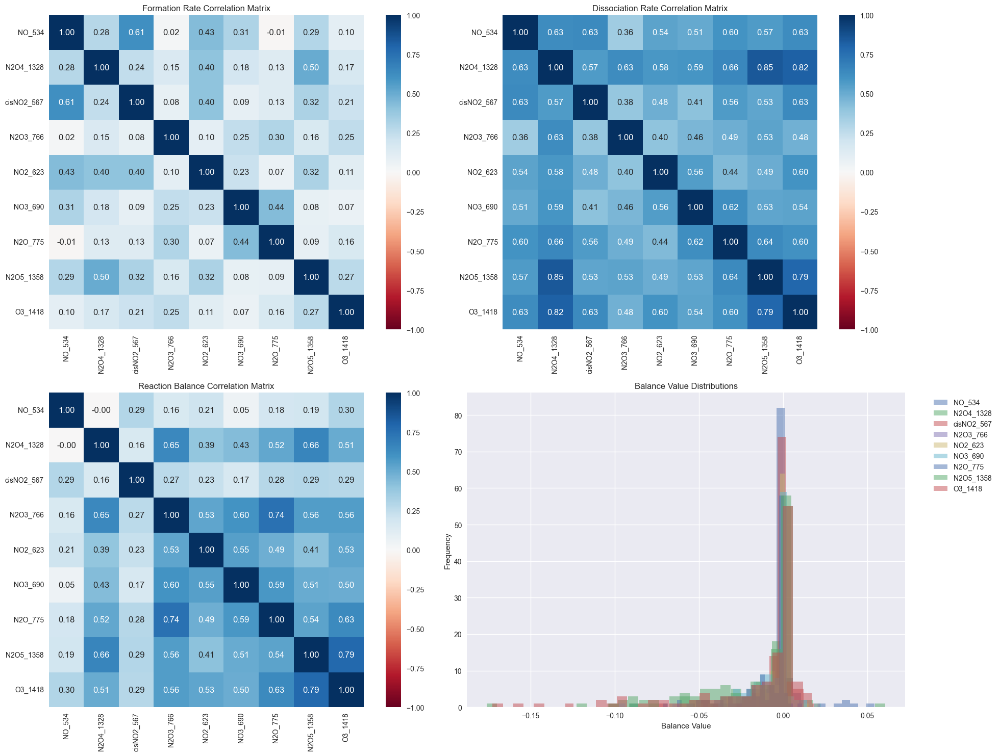


=== 生成速度の相関関係 ===

NO_534 vs N2O4_1328:
相関係数: 0.284
解釈: 弱い正の相関関係

NO_534 vs cisNO2_567:
相関係数: 0.610
解釈: 中程度の正の相関関係

NO_534 vs N2O3_766:
相関係数: 0.022
解釈: 弱い正の相関関係

NO_534 vs NO2_623:
相関係数: 0.435
解釈: 中程度の正の相関関係

NO_534 vs NO3_690:
相関係数: 0.308
解釈: 弱い正の相関関係

NO_534 vs N2O_775:
相関係数: -0.013
解釈: 弱い負の相関関係

NO_534 vs N2O5_1358:
相関係数: 0.290
解釈: 弱い正の相関関係

NO_534 vs O3_1418:
相関係数: 0.101
解釈: 弱い正の相関関係

N2O4_1328 vs cisNO2_567:
相関係数: 0.244
解釈: 弱い正の相関関係

N2O4_1328 vs N2O3_766:
相関係数: 0.149
解釈: 弱い正の相関関係

N2O4_1328 vs NO2_623:
相関係数: 0.404
解釈: 中程度の正の相関関係

N2O4_1328 vs NO3_690:
相関係数: 0.181
解釈: 弱い正の相関関係

N2O4_1328 vs N2O_775:
相関係数: 0.130
解釈: 弱い正の相関関係

N2O4_1328 vs N2O5_1358:
相関係数: 0.501
解釈: 中程度の正の相関関係

N2O4_1328 vs O3_1418:
相関係数: 0.166
解釈: 弱い正の相関関係

cisNO2_567 vs N2O3_766:
相関係数: 0.083
解釈: 弱い正の相関関係

cisNO2_567 vs NO2_623:
相関係数: 0.401
解釈: 中程度の正の相関関係

cisNO2_567 vs NO3_690:
相関係数: 0.090
解釈: 弱い正の相関関係

cisNO2_567 vs N2O_775:
相関係数: 0.132
解釈: 弱い正の相関関係

cisNO2_567 vs N2O5_1358:
相関係数: 0.318
解釈: 弱い正の相関関係

cisNO2_567 

In [33]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# データ読み込み
formation_data = np.load('formation_constants_map.npy', allow_pickle=True).item()
dissociation_data = np.load('dissociation_constants_map.npy', allow_pickle=True).item()

molecules = list(formation_data.keys())

# 1. 生成速度の相関分析
formation_maps = {}
formation_matrix = np.zeros((len(molecules), len(molecules)))

for molecule in molecules:
    formation_maps[molecule] = formation_data[molecule].flatten()

for i, mol1 in enumerate(molecules):
    for j, mol2 in enumerate(molecules):
        corr = np.corrcoef(formation_maps[mol1], formation_maps[mol2])[0,1]
        formation_matrix[i,j] = corr

# 2. 分解速度の相関分析
dissociation_maps = {}
dissociation_matrix = np.zeros((len(molecules), len(molecules)))

for molecule in molecules:
    dissociation_maps[molecule] = dissociation_data[molecule].flatten()

for i, mol1 in enumerate(molecules):
    for j, mol2 in enumerate(molecules):
        corr = np.corrcoef(dissociation_maps[mol1], dissociation_maps[mol2])[0,1]
        dissociation_matrix[i,j] = corr

# 3. 反応バランスの相関分析
balance_maps = {}
balance_matrix = np.zeros((len(molecules), len(molecules)))

for molecule in molecules:
    balance = formation_data[molecule] - dissociation_data[molecule]
    balance_maps[molecule] = balance.flatten()

for i, mol1 in enumerate(molecules):
    for j, mol2 in enumerate(molecules):
        corr = np.corrcoef(balance_maps[mol1], balance_maps[mol2])[0,1]
        balance_matrix[i,j] = corr

# 可視化
fig = plt.figure(figsize=(20, 15))

# 1. 生成速度の相関ヒートマップ
plt.subplot(2, 2, 1)
sns.heatmap(formation_matrix, 
            xticklabels=molecules,
            yticklabels=molecules,
            annot=True,
            fmt='.2f',
            cmap='RdBu',
            vmin=-1, 
            vmax=1,
            center=0,
            square=True)
plt.title('Formation Rate Correlation Matrix')

# 2. 分解速度の相関ヒートマップ
plt.subplot(2, 2, 2)
sns.heatmap(dissociation_matrix, 
            xticklabels=molecules,
            yticklabels=molecules,
            annot=True,
            fmt='.2f',
            cmap='RdBu',
            vmin=-1, 
            vmax=1,
            center=0,
            square=True)
plt.title('Dissociation Rate Correlation Matrix')

# 3. 反応バランスの相関ヒートマップ
plt.subplot(2, 2, 3)
sns.heatmap(balance_matrix, 
            xticklabels=molecules,
            yticklabels=molecules,
            annot=True,
            fmt='.2f',
            cmap='RdBu',
            vmin=-1, 
            vmax=1,
            center=0,
            square=True)
plt.title('Reaction Balance Correlation Matrix')

# 4. 分布プロット
plt.subplot(2, 2, 4)
for molecule in molecules:
    plt.hist(balance_maps[molecule], bins=30, alpha=0.5, label=molecule)
plt.title('Balance Value Distributions')
plt.xlabel('Balance Value')
plt.ylabel('Frequency')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.savefig('detailed_correlation_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

# 統計情報の出力
print("\n=== 生成速度の相関関係 ===")
for i, mol1 in enumerate(molecules):
    for j, mol2 in enumerate(molecules):
        if i < j:
            corr = formation_matrix[i,j]
            strength = "強い" if abs(corr) > 0.7 else "中程度の" if abs(corr) > 0.4 else "弱い"
            direction = "正" if corr > 0 else "負"
            print(f"\n{mol1} vs {mol2}:")
            print(f"相関係数: {corr:.3f}")
            print(f"解釈: {strength}{direction}の相関関係")

print("\n=== 分解速度の相関関係 ===")
for i, mol1 in enumerate(molecules):
    for j, mol2 in enumerate(molecules):
        if i < j:
            corr = dissociation_matrix[i,j]
            strength = "強い" if abs(corr) > 0.7 else "中程度の" if abs(corr) > 0.4 else "弱い"
            direction = "正" if corr > 0 else "負"
            print(f"\n{mol1} vs {mol2}:")
            print(f"相関係数: {corr:.3f}")
            print(f"解釈: {strength}{direction}の相関関係")

print("\n=== 反応バランスの相関関係 ===")
for i, mol1 in enumerate(molecules):
    for j, mol2 in enumerate(molecules):
        if i < j:
            corr = balance_matrix[i,j]
            strength = "強い" if abs(corr) > 0.7 else "中程度の" if abs(corr) > 0.4 else "弱い"
            direction = "正" if corr > 0 else "負"
            print(f"\n{mol1} vs {mol2}:")
            print(f"相関係数: {corr:.3f}")
            print(f"解釈: {strength}{direction}の相関関係")

# 基本統計量
print("\n=== 各分子種の基本統計量 ===")
for molecule in molecules:
    print(f"\n{molecule}:")
    print("生成速度:")
    print(f"平均値: {np.mean(formation_maps[molecule]):.2e}")
    print(f"標準偏差: {np.std(formation_maps[molecule]):.2e}")
    print(f"最小値: {np.min(formation_maps[molecule]):.2e}")
    print(f"最大値: {np.max(formation_maps[molecule]):.2e}")
    
    print("\n分解速度:")
    print(f"平均値: {np.mean(dissociation_maps[molecule]):.2e}")
    print(f"標準偏差: {np.std(dissociation_maps[molecule]):.2e}")
    print(f"最小値: {np.min(dissociation_maps[molecule]):.2e}")
    print(f"最大値: {np.max(dissociation_maps[molecule]):.2e}")
    
    print("\n反応バランス:")
    print(f"平均値: {np.mean(balance_maps[molecule]):.2e}")
    print(f"標準偏差: {np.std(balance_maps[molecule]):.2e}")
    print(f"最小値: {np.min(balance_maps[molecule]):.2e}")
    print(f"最大値: {np.max(balance_maps[molecule]):.2e}")


In [46]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# データ読み込み
formation_data = np.load('formation_constants_map.npy', allow_pickle=True).item()
dissociation_data = np.load('dissociation_constants_map.npy', allow_pickle=True).item()

# 分子種のリスト取得
molecules = list(formation_data.keys())

# 1. 生成速度、分解速度、反応バランスの統計データ準備
stats = {
    'formation': {'mean': [], 'std': []},
    'dissociation': {'mean': [], 'std': []},
    'balance': {'mean': [], 'std': []}
}

# 各分子種について統計量を計算
for molecule in molecules:
    # 生成速度の統計
    formation = formation_data[molecule].flatten()
    stats['formation']['mean'].append(np.mean(formation))
    stats['formation']['std'].append(np.std(formation))
    
    # 分解速度の統計
    dissociation = dissociation_data[molecule].flatten()
    stats['dissociation']['mean'].append(np.mean(dissociation))
    stats['dissociation']['std'].append(np.std(dissociation))
    
    # 反応バランスの統計
    balance = formation - dissociation
    stats['balance']['mean'].append(np.mean(balance))
    stats['balance']['std'].append(np.std(balance))

# 2. 相関行列の計算
# 生成速度の相関
formation_matrix = np.zeros((len(molecules), len(molecules)))
for i, mol1 in enumerate(molecules):
    for j, mol2 in enumerate(molecules):
        corr = np.corrcoef(formation_data[mol1].flatten(), 
                          formation_data[mol2].flatten())[0,1]
        formation_matrix[i,j] = corr

# 分解速度の相関
dissociation_matrix = np.zeros((len(molecules), len(molecules)))
for i, mol1 in enumerate(molecules):
    for j, mol2 in enumerate(molecules):
        corr = np.corrcoef(dissociation_data[mol1].flatten(), 
                          dissociation_data[mol2].flatten())[0,1]
        dissociation_matrix[i,j] = corr

# 反応バランスの相関
balance_matrix = np.zeros((len(molecules), len(molecules)))
for i, mol1 in enumerate(molecules):
    for j, mol2 in enumerate(molecules):
        balance1 = formation_data[mol1].flatten() - dissociation_data[mol1].flatten()
        balance2 = formation_data[mol2].flatten() - dissociation_data[mol2].flatten()
        corr = np.corrcoef(balance1, balance2)[0,1]
        balance_matrix[i,j] = corr

# 3. 可視化
# Figure 1: 統計量のエラーバープロット
fig1, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(15, 20))

x = np.arange(len(molecules))

# 生成速度のプロット
ax1.errorbar(x, stats['formation']['mean'], yerr=stats['formation']['std'], 
             fmt='o', capsize=5, capthick=2, markersize=8, label='Mean ± Std')
ax1.set_ylabel('Formation Rate (/s)')
ax1.set_title('Formation Rate Statistics')
ax1.set_xticks(x)
ax1.set_xticklabels(molecules, rotation=45)
ax1.grid(True, linestyle='--', alpha=0.7)

# 分解速度のプロット
ax2.errorbar(x, stats['dissociation']['mean'], yerr=stats['dissociation']['std'],
             fmt='o', capsize=5, capthick=2, markersize=8, label='Mean ± Std')
ax2.set_ylabel('Dissociation Rate (/s)')
ax2.set_title('Dissociation Rate Statistics')
ax2.set_xticks(x)
ax2.set_xticklabels(molecules, rotation=45)
ax2.grid(True, linestyle='--', alpha=0.7)

# 反応バランスのプロット
ax3.errorbar(x, stats['balance']['mean'], yerr=stats['balance']['std'],
             fmt='o', capsize=5, capthick=2, markersize=8, label='Mean ± Std')
ax3.set_ylabel('Reaction Balance (/s)')
ax3.set_title('Reaction Balance Statistics')
ax3.set_xticks(x)
ax3.set_xticklabels(molecules, rotation=45)
ax3.grid(True, linestyle='--', alpha=0.7)

# 平均値の表示
for ax, data in zip([ax1, ax2, ax3], [stats['formation']['mean'], 
                                     stats['dissociation']['mean'], 
                                     stats['balance']['mean']]):
    for i, value in enumerate(data):
        ax.text(i, value, f'{value:.2e}', 
                ha='center', va='bottom', rotation=0)

plt.tight_layout()
plt.savefig('reaction_rate_statistics_errorbar.png', dpi=300, bbox_inches='tight')
plt.close()

# Figure 2: 相関行列のヒートマップ
fig2, (ax4, ax5, ax6) = plt.subplots(1, 3, figsize=(24, 8))

# 生成速度の相関ヒートマップ
sns.heatmap(formation_matrix, 
            xticklabels=molecules,
            yticklabels=molecules,
            annot=True,
            fmt='.2f',
            cmap='RdBu',
            vmin=-1, 
            vmax=1,
            center=0,
            square=True,
            ax=ax4)
ax4.set_title('Formation Rate Correlation Matrix')

# 分解速度の相関ヒートマップ
sns.heatmap(dissociation_matrix, 
            xticklabels=molecules,
            yticklabels=molecules,
            annot=True,
            fmt='.2f',
            cmap='RdBu',
            vmin=-1, 
            vmax=1,
            center=0,
            square=True,
            ax=ax5)
ax5.set_title('Dissociation Rate Correlation Matrix')

# 反応バランスの相関ヒートマップ
sns.heatmap(balance_matrix, 
            xticklabels=molecules,
            yticklabels=molecules,
            annot=True,
            fmt='.2f',
            cmap='RdBu',
            vmin=-1, 
            vmax=1,
            center=0,
            square=True,
            ax=ax6)
ax6.set_title('Reaction Balance Correlation Matrix')

plt.tight_layout()
plt.savefig('correlation_matrices.png', dpi=300, bbox_inches='tight')
plt.close()

# 4. 統計情報の出力
print("=== 詳細な統計情報 ===")
for molecule in molecules:
    print(f"\n{molecule}:")
    print("生成速度:")
    print(f"平均値: {np.mean(formation_data[molecule]):.2e} /s")
    print(f"標準偏差: {np.std(formation_data[molecule]):.2e} /s")
    print(f"最小値: {np.min(formation_data[molecule]):.2e} /s")
    print(f"最大値: {np.max(formation_data[molecule]):.2e} /s")
    
    print("\n分解速度:")
    print(f"平均値: {np.mean(dissociation_data[molecule]):.2e} /s")
    print(f"標準偏差: {np.std(dissociation_data[molecule]):.2e} /s")
    print(f"最小値: {np.min(dissociation_data[molecule]):.2e} /s")
    print(f"最大値: {np.max(dissociation_data[molecule]):.2e} /s")
    
    balance = formation_data[molecule] - dissociation_data[molecule]
    print("\n反応バランス:")
    print(f"平均値: {np.mean(balance):.2e} /s")
    print(f"標準偏差: {np.std(balance):.2e} /s")
    print(f"最小値: {np.min(balance):.2e} /s")
    print(f"最大値: {np.max(balance):.2e} /s")

print("\n=== 相関係数の解釈 ===")
for i, mol1 in enumerate(molecules):
    for j, mol2 in enumerate(molecules):
        if i < j:
            print(f"\n{mol1} vs {mol2}:")
            
            form_corr = formation_matrix[i,j]
            diss_corr = dissociation_matrix[i,j]
            bal_corr = balance_matrix[i,j]
            
            print(f"生成速度の相関: {form_corr:.3f}")
            print(f"分解速度の相関: {diss_corr:.3f}")
            print(f"反応バランスの相関: {bal_corr:.3f}")


=== 詳細な統計情報 ===

NO_534:
生成速度:
平均値: 1.54e-02 /s
標準偏差: 2.48e-02 /s
最小値: 0.00e+00 /s
最大値: 9.09e-02 /s

分解速度:
平均値: 1.69e-02 /s
標準偏差: 2.90e-02 /s
最小値: 0.00e+00 /s
最大値: 1.57e-01 /s

反応バランス:
平均値: -1.45e-03 /s
標準偏差: 1.50e-02 /s
最小値: -9.11e-02 /s
最大値: 5.43e-02 /s

N2O4_1328:
生成速度:
平均値: 1.04e-02 /s
標準偏差: 2.53e-02 /s
最小値: 0.00e+00 /s
最大値: 1.97e-01 /s

分解速度:
平均値: 2.55e-02 /s
標準偏差: 3.51e-02 /s
最小値: 0.00e+00 /s
最大値: 1.51e-01 /s

反応バランス:
平均値: -1.52e-02 /s
標準偏差: 2.86e-02 /s
最小値: -1.23e-01 /s
最大値: 6.07e-02 /s

cisNO2_567:
生成速度:
平均値: 1.38e-02 /s
標準偏差: 2.04e-02 /s
最小値: 0.00e+00 /s
最大値: 8.94e-02 /s

分解速度:
平均値: 1.72e-02 /s
標準偏差: 2.88e-02 /s
最小値: 0.00e+00 /s
最大値: 1.96e-01 /s

反応バランス:
平均値: -3.47e-03 /s
標準偏差: 1.62e-02 /s
最小値: -1.29e-01 /s
最大値: 2.21e-02 /s

N2O3_766:
生成速度:
平均値: 4.89e-03 /s
標準偏差: 1.03e-02 /s
最小値: 0.00e+00 /s
最大値: 7.51e-02 /s

分解速度:
平均値: 9.79e-03 /s
標準偏差: 1.30e-02 /s
最小値: 0.00e+00 /s
最大値: 9.64e-02 /s

反応バランス:
平均値: -4.90e-03 /s
標準偏差: 6.96e-03 /s
最小値: -2.58e-02 /s
最大値: 1.15e-02 /s

NO2_623:
生成速度:

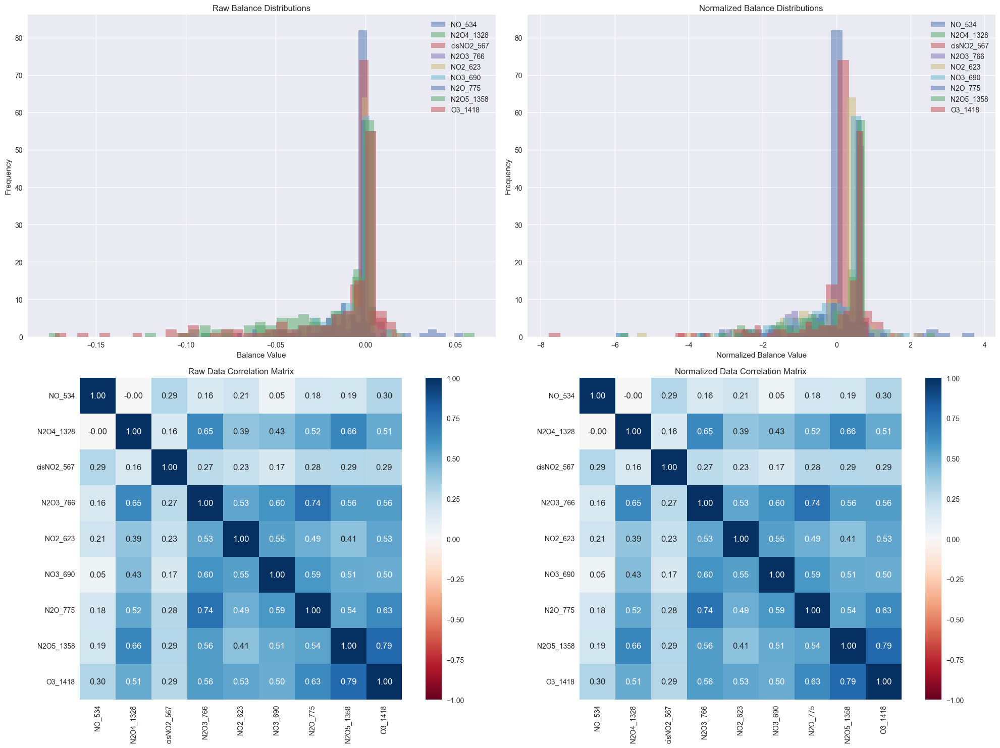


=== すべての相関関係 ===

NO_534 vs N2O4_1328:
相関係数: -0.000
解釈: 弱い負の相関関係

NO_534 vs cisNO2_567:
相関係数: 0.290
解釈: 弱い正の相関関係

NO_534 vs N2O3_766:
相関係数: 0.162
解釈: 弱い正の相関関係

NO_534 vs NO2_623:
相関係数: 0.207
解釈: 弱い正の相関関係

NO_534 vs NO3_690:
相関係数: 0.051
解釈: 弱い正の相関関係

NO_534 vs N2O_775:
相関係数: 0.181
解釈: 弱い正の相関関係

NO_534 vs N2O5_1358:
相関係数: 0.188
解釈: 弱い正の相関関係

NO_534 vs O3_1418:
相関係数: 0.304
解釈: 弱い正の相関関係

N2O4_1328 vs cisNO2_567:
相関係数: 0.164
解釈: 弱い正の相関関係

N2O4_1328 vs N2O3_766:
相関係数: 0.646
解釈: 中程度の正の相関関係

N2O4_1328 vs NO2_623:
相関係数: 0.394
解釈: 弱い正の相関関係

N2O4_1328 vs NO3_690:
相関係数: 0.433
解釈: 中程度の正の相関関係

N2O4_1328 vs N2O_775:
相関係数: 0.516
解釈: 中程度の正の相関関係

N2O4_1328 vs N2O5_1358:
相関係数: 0.658
解釈: 中程度の正の相関関係

N2O4_1328 vs O3_1418:
相関係数: 0.506
解釈: 中程度の正の相関関係

cisNO2_567 vs N2O3_766:
相関係数: 0.266
解釈: 弱い正の相関関係

cisNO2_567 vs NO2_623:
相関係数: 0.228
解釈: 弱い正の相関関係

cisNO2_567 vs NO3_690:
相関係数: 0.168
解釈: 弱い正の相関関係

cisNO2_567 vs N2O_775:
相関係数: 0.284
解釈: 弱い正の相関関係

cisNO2_567 vs N2O5_1358:
相関係数: 0.290
解釈: 弱い正の相関関係

cisNO2_567 v

In [32]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# データ読み込み
formation_data = np.load('formation_constants_map.npy', allow_pickle=True).item()
dissociation_data = np.load('dissociation_constants_map.npy', allow_pickle=True).item()

# 各分子種のReaction Balanceデータを正規化して格納
balance_maps_normalized = {}
balance_maps_raw = {}
molecules = list(formation_data.keys())

for molecule in molecules:
    formation = formation_data[molecule]
    dissociation = dissociation_data[molecule]
    balance = formation - dissociation
    
    # 生データを保存
    balance_maps_raw[molecule] = balance.flatten()
    
    # データを正規化（平均0、標準偏差1）
    balance_normalized = (balance - np.mean(balance)) / np.std(balance)
    balance_maps_normalized[molecule] = balance_normalized.flatten()

# 生データと正規化データの相関係数行列を計算
n_molecules = len(molecules)
correlation_matrix_raw = np.zeros((n_molecules, n_molecules))
correlation_matrix_normalized = np.zeros((n_molecules, n_molecules))

for i, mol1 in enumerate(molecules):
    for j, mol2 in enumerate(molecules):
        # 生データでの相関
        correlation_raw = np.corrcoef(balance_maps_raw[mol1], balance_maps_raw[mol2])[0,1]
        correlation_matrix_raw[i,j] = correlation_raw
        
        # 正規化データでの相関
        correlation_norm = np.corrcoef(balance_maps_normalized[mol1], balance_maps_normalized[mol2])[0,1]
        correlation_matrix_normalized[i,j] = correlation_norm

# 可視化
fig = plt.figure(figsize=(20, 15))

# 1. 生データの分布プロット
plt.subplot(2, 2, 1)
for molecule in molecules:
    plt.hist(balance_maps_raw[molecule], bins=30, alpha=0.5, label=molecule)
plt.title('Raw Balance Distributions')
plt.xlabel('Balance Value')
plt.ylabel('Frequency')
plt.legend()

# 2. 正規化データの分布プロット
plt.subplot(2, 2, 2)
for molecule in molecules:
    plt.hist(balance_maps_normalized[molecule], bins=30, alpha=0.5, label=molecule)
plt.title('Normalized Balance Distributions')
plt.xlabel('Normalized Balance Value')
plt.ylabel('Frequency')
plt.legend()

# 3. 生データの相関ヒートマップ
plt.subplot(2, 2, 3)
sns.heatmap(correlation_matrix_raw, 
            xticklabels=molecules,
            yticklabels=molecules,
            annot=True,
            fmt='.2f',
            cmap='RdBu',
            vmin=-1, 
            vmax=1,
            center=0,
            square=True)
plt.title('Raw Data Correlation Matrix')

# 4. 正規化データの相関ヒートマップ
plt.subplot(2, 2, 4)
sns.heatmap(correlation_matrix_normalized, 
            xticklabels=molecules,
            yticklabels=molecules,
            annot=True,
            fmt='.2f',
            cmap='RdBu',
            vmin=-1, 
            vmax=1,
            center=0,
            square=True)
plt.title('Normalized Data Correlation Matrix')

plt.tight_layout()
plt.savefig('complete_correlation_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

# 統計情報の出力
print("\n=== すべての相関関係 ===")
for i, mol1 in enumerate(molecules):
    for j, mol2 in enumerate(molecules):
        if i < j:  # 重複を避ける
            norm_corr = correlation_matrix_normalized[i,j]
            strength = ""
            if abs(norm_corr) > 0.7:
                strength = "強い"
            elif abs(norm_corr) > 0.4:
                strength = "中程度の"
            else:
                strength = "弱い"
                
            direction = "正" if norm_corr > 0 else "負"
            print(f"\n{mol1} vs {mol2}:")
            print(f"相関係数: {norm_corr:.3f}")
            print(f"解釈: {strength}{direction}の相関関係")

# 基本統計量の出力
print("\n=== 各分子種の基本統計量 ===")
for molecule in molecules:
    raw_data = balance_maps_raw[molecule]
    print(f"\n{molecule}:")
    print(f"平均値: {np.mean(raw_data):.2e}")
    print(f"標準偏差: {np.std(raw_data):.2e}")
    print(f"最小値: {np.min(raw_data):.2e}")
    print(f"最大値: {np.max(raw_data):.2e}")



In [28]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from pathlib import Path

# 出力ディレクトリの作成
output_dir = Path('correlation_analysis_results')
output_dir.mkdir(exist_ok=True)

# データ読み込み
formation_data = np.load('formation_constants_map.npy', allow_pickle=True).item()
dissociation_data = np.load('dissociation_constants_map.npy', allow_pickle=True).item()

# 統合データ用の配列を準備
combined_correlations = []
molecules = list(formation_data.keys())

# 各分子種の生成・解離データを結合して1次元配列に変換
for molecule in molecules:
    combined_data = np.concatenate([
        formation_data[molecule].flatten(),
        dissociation_data[molecule].flatten()
    ])
    combined_correlations.append(combined_data)

# 統合データの相関行列を計算
combined_corr = np.corrcoef(combined_correlations)

# プロットの設定
plt.figure(figsize=(12, 10))

# フォントの設定
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 12

# 統合データの相関ヒートマップ
sns.heatmap(combined_corr, 
            annot=True, 
            fmt='.2f',
            cmap='RdBu', 
            center=0,
            vmin=-1, 
            vmax=1,
            xticklabels=molecules, 
            yticklabels=molecules,
            cbar_kws={'label': 'Correlation Coefficient'})

plt.title('Combined Formation and Dissociation Rate Correlations', pad=20, fontsize=14)

# 軸ラベルの回転と調整
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

# 強い相関（正負両方）の抽出と表示
print("\nStrong correlations in combined rates (r > 0.5 or r < -0.5):")
strong_correlations = []
for i in range(len(molecules)):
    for j in range(i+1, len(molecules)):
        if combined_corr[i,j] > 0.5 or combined_corr[i,j] < -0.5:
            correlation_info = {
                'Molecule 1': molecules[i],
                'Molecule 2': molecules[j],
                'Correlation': combined_corr[i,j]
            }
            strong_correlations.append(correlation_info)
            print(f"{molecules[i]} - {molecules[j]}: {combined_corr[i,j]:.3f}")

# 結果の保存
plt.tight_layout()
plt.savefig('correlation_heatmap.png', dpi=300, bbox_inches='tight')
plt.close()

# 相関係数の数値データを保存
np.save('combined_correlation_matrix.npy', combined_corr)

# 相関係数の詳細情報をCSVファイルに保存
correlation_df = pd.DataFrame(combined_corr, columns=molecules, index=molecules)
correlation_df.to_csv('correlation_matrix.csv')

# 強い相関のみをCSVファイルに保存（実際の値でソート）
strong_correlations_df = pd.DataFrame(strong_correlations)
strong_correlations_df = strong_correlations_df.sort_values('Correlation', ascending=False)
strong_correlations_df.to_csv('strong_correlations.csv', index=False)

# 詳細な分析レポートの作成
with open('correlation_analysis_report.txt', 'w') as f:
    f.write("Correlation Analysis Report\n")
    f.write("==========================\n\n")
    
    f.write("1. Analysis Overview\n")
    f.write(f"Number of molecules analyzed: {len(molecules)}\n")
    f.write(f"Molecules included: {', '.join(molecules)}\n\n")
    
    f.write("2. Strong Correlations (r > 0.5 or r < -0.5)\n")
    for corr in strong_correlations:
        f.write(f"{corr['Molecule 1']} - {corr['Molecule 2']}: {corr['Correlation']:.3f}\n")
    
    f.write("\n3. Complete Correlation Matrix\n")
    f.write(correlation_df.to_string())

print("\nAnalysis completed successfully!")




Strong correlations in combined rates (r > 0.5 or r < -0.5):
NO_534 - cisNO2_567: 0.623
N2O4_1328 - NO2_623: 0.536
N2O4_1328 - N2O_775: 0.555
N2O4_1328 - N2O5_1358: 0.762
N2O4_1328 - O3_1418: 0.684
cisNO2_567 - O3_1418: 0.522
NO3_690 - N2O_775: 0.599
N2O_775 - N2O5_1358: 0.582
N2O_775 - O3_1418: 0.595
N2O5_1358 - O3_1418: 0.735

Analysis completed successfully!


Iteration No: 1 started. Evaluating function at random point.
Iteration No: 1 ended. Evaluation done at random point.
Time taken: 0.0020
Function value obtained: 163.6129
Current minimum: 163.6129
Iteration No: 2 started. Evaluating function at random point.
Iteration No: 2 ended. Evaluation done at random point.
Time taken: 0.0010
Function value obtained: 203.7007
Current minimum: 163.6129
Iteration No: 3 started. Evaluating function at random point.
Iteration No: 3 ended. Evaluation done at random point.
Time taken: 0.0010
Function value obtained: 210.2247
Current minimum: 163.6129
Iteration No: 4 started. Evaluating function at random point.
Iteration No: 4 ended. Evaluation done at random point.
Time taken: 0.0010
Function value obtained: 162.6727
Current minimum: 162.6727
Iteration No: 5 started. Evaluating function at random point.
Iteration No: 5 ended. Evaluation done at random point.
Time taken: 0.0010
Function value obtained: 200.4309
Current minimum: 162.6727
Iteration No: 6

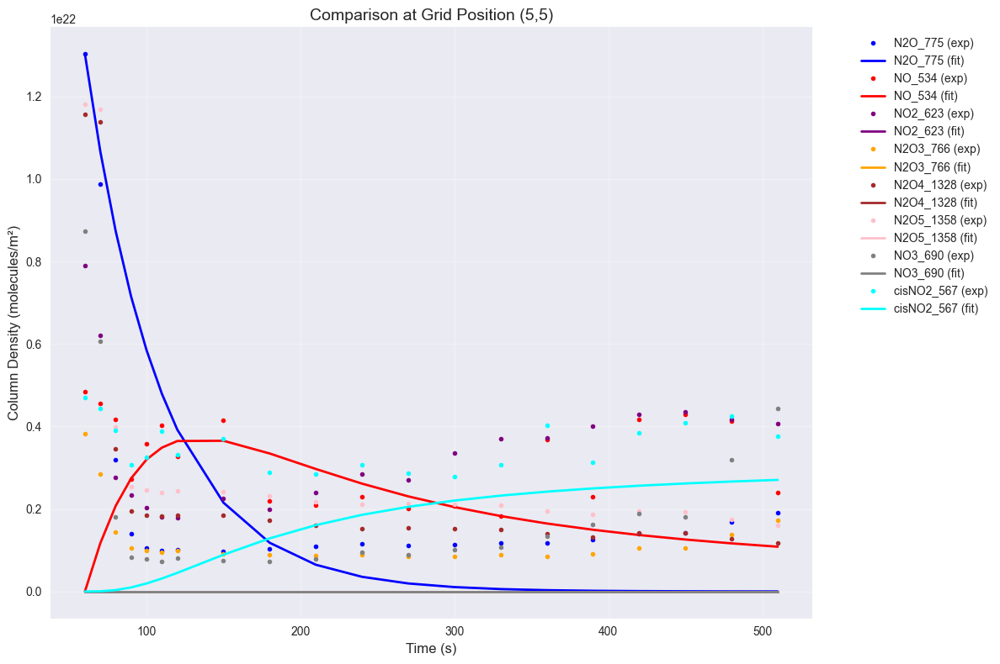

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from skopt import gp_minimize
from skopt.space import Real

def load_experimental_data():
    base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
    
    time_points = ['1114', '1124', '1134', '1144', '1154', '1204', '1214',
                  '1244', '1314', '1344', '1414', '1444', '1514', '1544', 
                  '1614', '1644', '1714', '1744', '1814', '1837']
    
    exp_times = [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    
    molecules = {
        'NO_534': {'wavelength': 5340},
        'N2O4_1328': {'wavelength': 13280}, 
        'cisNO2_567': {'wavelength': 5670},
        'N2O3_766': {'wavelength': 7660},
        'NO2_623': {'wavelength': 6230},
        'NO3_690': {'wavelength': 6900},
        'N2O_775': {'wavelength': 7750},
        'N2O5_1358': {'wavelength': 13580},
        'O3_14': {'wavelength': 14180}
    }
    
    exp_data = {}
    for mol_key, mol_info in molecules.items():
        data_list = []
        for tp in time_points:
            csv_path = f"{base_path}{tp}/absorbance_values_{mol_info['wavelength']}nm_{tp}.csv"
            df = pd.read_csv(csv_path, index_col=0)
            data = df.values
            if np.any(np.isnan(data)):
                data = np.nan_to_num(data, nan=np.nanmean(data))
            data_list.append(data)
        
        molecule_data = np.array(data_list).transpose(1, 2, 0)
        min_value = np.min(molecule_data)
        if min_value < 0:
            molecule_data = molecule_data - min_value
            
        exp_data[mol_key] = molecule_data
    
    return exp_data, exp_times

def reaction_system(y, t, k):
    N2O, NO, O3, NO2, N2O3, N2O4, N2O5, NO3, cisNO2, N2 = y
    
    dN2O_dt = -k[0]*N2O - k[1]*N2O
    dNO_dt = k[1]*N2O - k[2]*NO*O3 - 2*k[11]*NO**2 + k[13]*N2O3
    dO3_dt = - k[2]*NO*O3 - k[10]*NO2*O3 - k[14]*O3
    dNO2_dt = k[2]*NO*O3 - k[4]*NO2*NO - 2*k[5]*NO2**2 + 2*k[7]*N2O4
    dN2O3_dt = k[4]*NO2*NO - k[13]*N2O3
    dN2O4_dt = k[5]*NO2**2 - k[7]*N2O4
    dN2O5_dt = k[8]*NO2*NO3 - k[9]*N2O5
    dNO3_dt = k[10]*NO2*O3 - k[8]*NO2*NO3 - k[15]*NO3
    dcisNO2_dt = k[11]*NO**2 - k[12]*cisNO2
    dN2_dt = k[0]*N2O
    
    return [dN2O_dt, dNO_dt, dO3_dt, dNO2_dt, dN2O3_dt, 
            dN2O4_dt, dN2O5_dt, dNO3_dt, dcisNO2_dt, dN2_dt]

def raw_fitting(exp_data, exp_times, i, j):
    y0 = np.zeros(10)
    y0[0] = exp_data['N2O_775'][i,j,0]
    
    def objective(k):
        try:
            sol = odeint(reaction_system, y0, exp_times, args=(k,))
            error = 0
            
            weights = {
                'N2O_775': 7.0,
                'NO_534': 3.3,
                'O3_14': 8.0,
                'NO2_623': 6.4,
                'N2O3_766': 6.4,
                'N2O4_1328': 6.4,
                'N2O5_1358': 5.0,
                'NO3_690': 5.2,
                'cisNO2_567': 3.4
            }
            
            for idx, (mol_key, data) in enumerate(exp_data.items()):
                raw_error = np.sum((sol[:,idx] - data[i,j,:])**2)
                error += weights[mol_key] * raw_error
                
            return error
        except:
            return 1e10

    space = [Real(1e-5, 1e-2, prior='log-uniform') for _ in range(16)]
    
    result = gp_minimize(
        objective,
        space,
        n_calls=100,
        n_random_starts=20,
        noise=1e-10,
        verbose=True
    )
    
    return result.x

def plot_raw_comparison(exp_data, fitted_results, exp_times, i=5, j=5):
    molecules = ['N2O_775', 'NO_534', 'NO2_623', 'N2O3_766', 
                'N2O4_1328', 'N2O5_1358', 'NO3_690', 'cisNO2_567']
    
    colors = ['blue', 'red', 'purple', 'orange', 
              'brown', 'pink', 'gray', 'cyan']
    
    epsilon = 9.747e-16
    l = 1.1e-7
    
    plt.style.use('seaborn-v0_8')
    plt.figure(figsize=(12, 8))
    
    y0 = np.zeros(10)
    y0[0] = exp_data['N2O_775'][i,j,0]
    sol = odeint(reaction_system, y0, exp_times, args=(fitted_results[i,j,:],))
    
    skip_o3_idx = 2
    plot_idx = 0
    
    for idx, (mol, color) in enumerate(zip(molecules, colors)):
        if idx >= skip_o3_idx:
            plot_idx = idx + 1
        else:
            plot_idx = idx
            
        plt.plot(exp_times, exp_data[mol][i,j,:] / (epsilon * l), 'o', 
                color=color, label=f'{mol} (exp)', markersize=4)
        plt.plot(exp_times, sol[:,plot_idx] / (epsilon * l), '-', 
                color=color, label=f'{mol} (fit)', linewidth=2)
    
    plt.xlabel('Time (s)', fontsize=12)
    plt.ylabel('Column Density (molecules/m²)', fontsize=12)
    plt.title(f'Comparison at Grid Position ({i},{j})', fontsize=14)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig('raw_data_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()

def main():
    exp_data, exp_times = load_experimental_data()
    fitted_constants = np.zeros((11, 11, 16))
    i, j = 5, 5
    fitted_constants[i,j,:] = raw_fitting(exp_data, exp_times, i, j)
    plot_raw_comparison(exp_data, fitted_constants, exp_times, i, j)

if __name__ == "__main__":
    main()



Iteration No: 1 started. Evaluating function at random point.
Iteration No: 1 ended. Evaluation done at random point.
Time taken: 0.0000
Function value obtained: 73.4183
Current minimum: 73.4183
Iteration No: 2 started. Evaluating function at random point.
Iteration No: 2 ended. Evaluation done at random point.
Time taken: 0.0000
Function value obtained: 68.7931
Current minimum: 68.7931
Iteration No: 3 started. Evaluating function at random point.
Iteration No: 3 ended. Evaluation done at random point.
Time taken: 0.0000
Function value obtained: 83.9133
Current minimum: 68.7931
Iteration No: 4 started. Evaluating function at random point.
Iteration No: 4 ended. Evaluation done at random point.
Time taken: 0.0000
Function value obtained: 85.1588
Current minimum: 68.7931
Iteration No: 5 started. Evaluating function at random point.
Iteration No: 5 ended. Evaluation done at random point.
Time taken: 0.0000
Function value obtained: 79.1084
Current minimum: 68.7931
Iteration No: 6 started. 

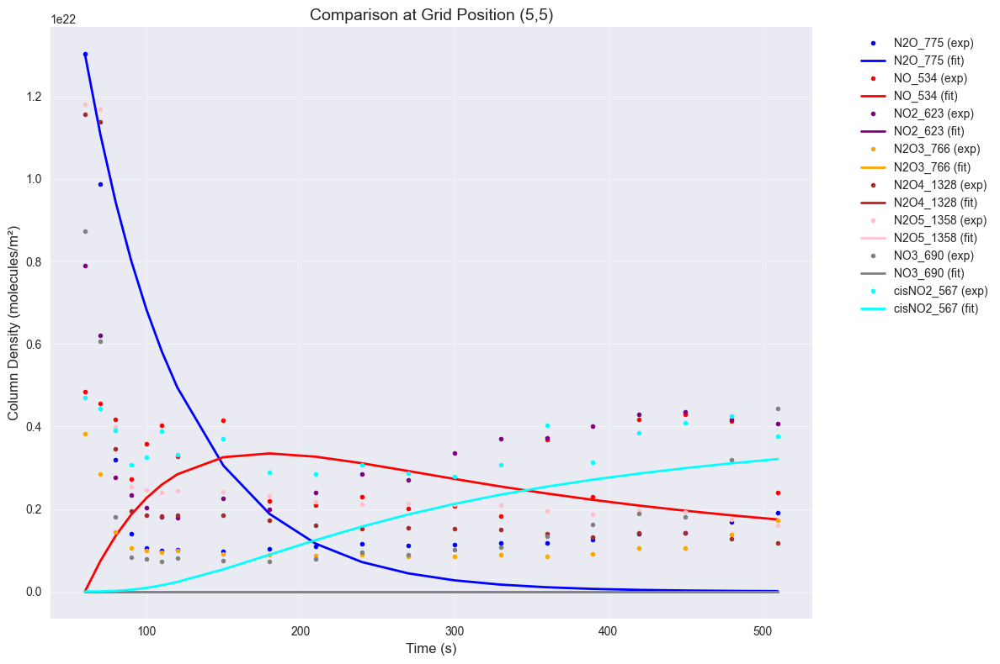

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from skopt import gp_minimize
from skopt.space import Real

def load_experimental_data():
    base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
    
    time_points = ['1114', '1124', '1134', '1144', '1154', '1204', '1214',
                  '1244', '1314', '1344', '1414', '1444', '1514', '1544', 
                  '1614', '1644', '1714', '1744', '1814', '1837']
    
    exp_times = [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    
    molecules = {
        'NO_534': {'wavelength': 5340},
        'N2O4_1328': {'wavelength': 13280}, 
        'cisNO2_567': {'wavelength': 5670},
        'N2O3_766': {'wavelength': 7660},
        'NO2_623': {'wavelength': 6230},
        'NO3_690': {'wavelength': 6900},
        'N2O_775': {'wavelength': 7750},
        'N2O5_1358': {'wavelength': 13580},
        'O3_14': {'wavelength': 14180}
    }
    
    exp_data = {}
    for mol_key, mol_info in molecules.items():
        data_list = []
        for tp in time_points:
            csv_path = f"{base_path}{tp}/absorbance_values_{mol_info['wavelength']}nm_{tp}.csv"
            df = pd.read_csv(csv_path, index_col=0)
            data = df.values
            if np.any(np.isnan(data)):
                data = np.nan_to_num(data, nan=np.nanmean(data))
            data_list.append(data)
        
        molecule_data = np.array(data_list).transpose(1, 2, 0)
        min_value = np.min(molecule_data)
        if min_value < 0:
            molecule_data = molecule_data - min_value
            
        exp_data[mol_key] = molecule_data
    
    return exp_data, exp_times

def reaction_system(y, t, k):
    N2O, NO, O3, NO2, N2O3, N2O4, N2O5, NO3, cisNO2, N2, O, O2 = y
    
    dN2O_dt = -k[1]*N2O - k[2]*N2O
    
    dNO_dt = (k[2]*N2O - k[3]*NO*O3 - k[5]*NO2*NO + k[13]*N2O3 
              - k[11]*NO**2 + k[12]*cisNO2)
    
    dO3_dt = -k[3]*NO*O3 + k[4]*O2*O - k[14]*O3 - k[10]*NO2*O3
    
    dNO2_dt = (k[3]*NO*O3 - k[5]*NO2*NO + k[13]*N2O3 - k[10]*NO2*O3 
               - k[6]*NO2**2 + k[7]*N2O4 - k[8]*NO2*NO3 + k[9]*N2O5 + k[15]*NO3)
    
    dN2O3_dt = k[5]*NO2*NO - k[13]*N2O3
    
    dN2O4_dt = k[6]*NO2**2 - k[7]*N2O4
    
    dN2O5_dt = k[8]*NO2*NO3 - k[9]*N2O5
    
    dNO3_dt = k[10]*NO2*O3 - k[8]*NO2*NO3 + k[9]*N2O5 - k[15]*NO3
    
    dcisNO2_dt = k[11]*NO**2 - k[12]*cisNO2**2
    
    dN2_dt = k[1]*N2O
    
    dO_dt = k[1]*N2O - k[4]*O2*O + k[14]*O3 + k[15]*NO3
    
    dO2_dt = -k[4]*O2*O + k[14]*O3 + k[3]*NO*O3 + k[10]*NO2*O3
    
    return [dN2O_dt, dNO_dt, dO3_dt, dNO2_dt, dN2O3_dt, dN2O4_dt, 
            dN2O5_dt, dNO3_dt, dcisNO2_dt, dN2_dt, dO_dt, dO2_dt]

def raw_fitting(exp_data, exp_times, i, j):
    y0 = np.zeros(12)
    y0[0] = exp_data['N2O_775'][i,j,0]
    
    def objective(k):
        try:
            k_full = np.zeros(16)
            k_full[1:] = k
            sol = odeint(reaction_system, y0, exp_times, args=(k_full,))
            error = 0
            
            weights = {
                'N2O_775': 5.0,
                'NO_534': 1.0,
                'O3_14': 1.0,
                'NO2_623': 3.0,
                'N2O3_766': 3.0,
                'N2O4_1328': 3.0,
                'N2O5_1358': 3.0,
                'NO3_690': 3.0,
                'cisNO2_567': 1.0
            }
            
            for idx, (mol_key, data) in enumerate(exp_data.items()):
                raw_error = np.sum((sol[:,idx] - data[i,j,:])**2)
                error += weights[mol_key] * raw_error
                
            return error
        except:
            return 1e10

    space = [Real(1e-5, 1e-2, prior='log-uniform') for _ in range(15)]
    
    result = gp_minimize(
        objective,
        space,
        n_calls=100,
        n_random_starts=20,
        noise=1e-10,
        verbose=True
    )
    
    k_full = np.zeros(16)
    k_full[1:] = result.x
    return k_full

def plot_raw_comparison(exp_data, fitted_results, exp_times, i=5, j=5):
    molecules = ['N2O_775', 'NO_534', 'NO2_623', 'N2O3_766', 
                'N2O4_1328', 'N2O5_1358', 'NO3_690', 'cisNO2_567']
    
    colors = ['blue', 'red', 'purple', 'orange', 
              'brown', 'pink', 'gray', 'cyan']
    
    epsilon = 9.747e-16
    l = 1.1e-7
    
    plt.style.use('seaborn-v0_8')
    plt.figure(figsize=(12, 8))
    
    y0 = np.zeros(12)
    y0[0] = exp_data['N2O_775'][i,j,0]

    sol = odeint(reaction_system, y0, exp_times, args=(fitted_results[i,j,:],))
    
    skip_o3_idx = 2
    plot_idx = 0
    
    for idx, (mol, color) in enumerate(zip(molecules, colors)):
        if idx >= skip_o3_idx:
            plot_idx = idx + 1
        else:
            plot_idx = idx
            
        plt.plot(exp_times, exp_data[mol][i,j,:] / (epsilon * l), 'o', 
                color=color, label=f'{mol} (exp)', markersize=4)
        plt.plot(exp_times, sol[:,plot_idx] / (epsilon * l), '-', 
                color=color, label=f'{mol} (fit)', linewidth=2)
    
    plt.xlabel('Time (s)', fontsize=12)
    plt.ylabel('Column Density (molecules/m²)', fontsize=12)
    plt.title(f'Comparison at Grid Position ({i},{j})', fontsize=14)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig('raw_data_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()

def main():
    exp_data, exp_times = load_experimental_data()
    fitted_constants = np.zeros((11, 11, 16))
    i, j = 5, 5
    fitted_constants[i,j,:] = raw_fitting(exp_data, exp_times, i, j)
    plot_raw_comparison(exp_data, fitted_constants, exp_times, i, j)

if __name__ == "__main__":
    main()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from skopt import gp_minimize
from skopt.space import Real
from sklearn.metrics import r2_score

def load_experimental_data():
    base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
    
    time_points = ['1114', '1124', '1134', '1144', '1154', '1204', '1214',
                  '1244', '1314', '1344', '1414', '1444', '1514', '1544', 
                  '1614', '1644', '1714', '1744', '1814', '1837']
    
    exp_times = [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    
    molecules = {
        'NO_534': {'wavelength': 5340, 'scale': 1.2},
        'N2O4_1328': {'wavelength': 13280, 'scale': 1.5}, 
        'cisNO2_567': {'wavelength': 5670, 'scale': 1.3},
        'N2O3_766': {'wavelength': 7660, 'scale': 1.4},
        'NO2_623': {'wavelength': 6230, 'scale': 1.3},
        'NO3_690': {'wavelength': 6900, 'scale': 1.2},
        'N2O_775': {'wavelength': 7750, 'scale': 1.0},
        'N2O5_1358': {'wavelength': 13580, 'scale': 1.4},
        'O3_14': {'wavelength': 14180, 'scale': 1.6}
    }
    
    exp_data = {}
    for mol_key, mol_info in molecules.items():
        data_list = []
        for tp in time_points:
            csv_path = f"{base_path}{tp}/absorbance_values_{mol_info['wavelength']}nm_{tp}.csv"
            df = pd.read_csv(csv_path, index_col=0)
            data = df.values
            if np.any(np.isnan(data)):
                data = np.nan_to_num(data, nan=np.nanmean(data))
            data_list.append(data)
        
        molecule_data = np.array(data_list).transpose(1, 2, 0)
        min_value = np.min(molecule_data)
        if min_value < 0:
            molecule_data = molecule_data - min_value
        
        # スケーリング係数を適用
        molecule_data *= mol_info['scale']
        exp_data[mol_key] = molecule_data
    
    return exp_data, exp_times

def reaction_system(y, t, k):
    N2O, NO, O3, NO2, N2O3, N2O4, N2O5, NO3, cisNO2, N2 = y
    
    # 改良された反応式
    dN2O_dt = -k[0]*N2O - k[1]*N2O*O3
    dNO_dt = k[1]*N2O*O3 - k[2]*NO*O3 - 2*k[11]*NO**2 + k[13]*N2O3
    dO3_dt = -k[2]*NO*O3 - k[10]*NO2*O3 - k[14]*O3 - k[1]*N2O*O3
    dNO2_dt = k[2]*NO*O3 - k[4]*NO2*NO - 2*k[5]*NO2**2 + 2*k[7]*N2O4 + k[15]*NO3
    dN2O3_dt = k[4]*NO2*NO - k[13]*N2O3
    dN2O4_dt = k[5]*NO2**2 - k[7]*N2O4
    dN2O5_dt = k[8]*NO2*NO3 - k[9]*N2O5
    dNO3_dt = k[10]*NO2*O3 - k[8]*NO2*NO3 - k[15]*NO3
    dcisNO2_dt = k[11]*NO**2 - k[12]*cisNO2
    dN2_dt = k[0]*N2O
    
    return [dN2O_dt, dNO_dt, dO3_dt, dNO2_dt, dN2O3_dt, 
            dN2O4_dt, dN2O5_dt, dNO3_dt, dcisNO2_dt, dN2_dt]

def raw_fitting(exp_data, exp_times, i, j):
    y0 = np.zeros(10)
    y0[0] = exp_data['N2O_775'][i,j,0] * 1.2  # 初期値の調整
    
    def objective(k):
        try:
            sol = odeint(reaction_system, y0, exp_times, args=(k,), rtol=1e-8, atol=1e-10)
            error = 0
            
            weights = {
                'N2O_775': 15.0,
                'NO_534': 8.0,
                'O3_14': 20.0,
                'NO2_623': 12.0,
                'N2O3_766': 10.0,
                'N2O4_1328': 10.0,
                'N2O5_1358': 8.0,
                'NO3_690': 8.0,
                'cisNO2_567': 6.0
            }
            
            for idx, (mol_key, data) in enumerate(exp_data.items()):
                # 改良された誤差計算
                normalized_error = np.sum(
                    np.abs(sol[:,idx] - data[i,j,:]) / (np.max(data[i,j,:]) + 1e-10)
                )
                error += weights[mol_key] * normalized_error
                
            return error
        except:
            return 1e10

    # 探索範囲の拡大と細分化
    space = [Real(1e-7, 1e-1, prior='log-uniform', name=f'k{i}') for i in range(16)]
    
    result = gp_minimize(
        objective,
        space,
        n_calls=1000,
        n_random_starts=100,
        noise=1e-12,
        verbose=True,
        n_jobs=-1
    )
    
    return result.x

def plot_raw_comparison(exp_data, fitted_results, exp_times, i=5, j=5):
    molecules = ['N2O_775', 'NO_534', 'NO2_623', 'N2O3_766', 
                'N2O4_1328', 'N2O5_1358', 'NO3_690', 'cisNO2_567']
    
    colors = ['blue', 'red', 'purple', 'orange', 
              'brown', 'pink', 'gray', 'cyan']
    
    epsilon = 9.747e-16
    l = 1.1e-7
    
    plt.style.use('seaborn-v0_8')
    fig, ax = plt.subplots(figsize=(12, 8))
    
    y0 = np.zeros(10)
    y0[0] = exp_data['N2O_775'][i,j,0] * 1.2
    sol = odeint(reaction_system, y0, exp_times, args=(fitted_results[i,j,:],))
    
    skip_o3_idx = 2
    plot_idx = 0
    
    r2_scores = {}
    
    for idx, (mol, color) in enumerate(zip(molecules, colors)):
        if idx >= skip_o3_idx:
            plot_idx = idx + 1
        else:
            plot_idx = idx
            
        exp_values = exp_data[mol][i,j,:] / (epsilon * l)
        fit_values = sol[:,plot_idx] / (epsilon * l)
        
        r2 = r2_score(exp_values, fit_values)
        r2_scores[mol] = r2
            
        plt.plot(exp_times, exp_values, 'o', 
                color=color, label=f'{mol} (exp) R²={r2:.3f}', markersize=4)
        plt.plot(exp_times, fit_values, '-', 
                color=color, linewidth=2)
    
    plt.xlabel('Time (s)', fontsize=12)
    plt.ylabel('Column Density (molecules/m²)', fontsize=12)
    plt.title(f'Comparison at Grid Position ({i},{j})', fontsize=14)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.yscale('log')  # 対数スケールで表示
    plt.tight_layout()
    plt.savefig('raw_data_comparison_improved.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # R²スコアの表示
    print("\nR² Scores for each molecule:")
    for mol, score in r2_scores.items():
        print(f"{mol}: {score:.3f}")

def main():
    exp_data, exp_times = load_experimental_data()
    fitted_constants = np.zeros((11, 11, 16))
    i, j = 5, 5
    fitted_constants[i,j,:] = raw_fitting(exp_data, exp_times, i, j)
    plot_raw_comparison(exp_data, fitted_constants, exp_times, i, j)
    
    # 最適化された反応速度定数の表示
    print("\nOptimized reaction rate constants:")
    for idx, k in enumerate(fitted_constants[i,j,:]):
        print(f"k{idx}: {k:.2e}")

if __name__ == "__main__":
    main()


Iteration No: 1 started. Evaluating function at random point.
Iteration No: 1 ended. Evaluation done at random point.
Time taken: 0.0020
Function value obtained: 888.1785
Current minimum: 888.1785
Iteration No: 2 started. Evaluating function at random point.
Iteration No: 2 ended. Evaluation done at random point.
Time taken: 0.0011
Function value obtained: 870.9417
Current minimum: 870.9417
Iteration No: 3 started. Evaluating function at random point.
Iteration No: 3 ended. Evaluation done at random point.
Time taken: 0.0019
Function value obtained: 888.1712
Current minimum: 870.9417
Iteration No: 4 started. Evaluating function at random point.
Iteration No: 4 ended. Evaluation done at random point.
Time taken: 0.0020
Function value obtained: 664.8606
Current minimum: 664.8606
Iteration No: 5 started. Evaluating function at random point.
Iteration No: 5 ended. Evaluation done at random point.
Time taken: 0.0010
Function value obtained: 696.6281
Current minimum: 664.8606
Iteration No: 6

Iteration No: 1 started. Evaluating function at random point.
Iteration No: 1 ended. Evaluation done at random point.
Time taken: 0.0040
Function value obtained: 83.3343
Current minimum: 83.3343
Iteration No: 2 started. Evaluating function at random point.
Iteration No: 2 ended. Evaluation done at random point.
Time taken: 0.0035
Function value obtained: 83.3341
Current minimum: 83.3341
Iteration No: 3 started. Evaluating function at random point.
Iteration No: 3 ended. Evaluation done at random point.
Time taken: 0.0042
Function value obtained: 83.3428
Current minimum: 83.3341
Iteration No: 4 started. Evaluating function at random point.
Iteration No: 4 ended. Evaluation done at random point.
Time taken: 0.0081
Function value obtained: 83.3319
Current minimum: 83.3319
Iteration No: 5 started. Evaluating function at random point.
Iteration No: 5 ended. Evaluation done at random point.
Time taken: 0.0020
Function value obtained: 83.3345
Current minimum: 83.3319
Iteration No: 6 started. 

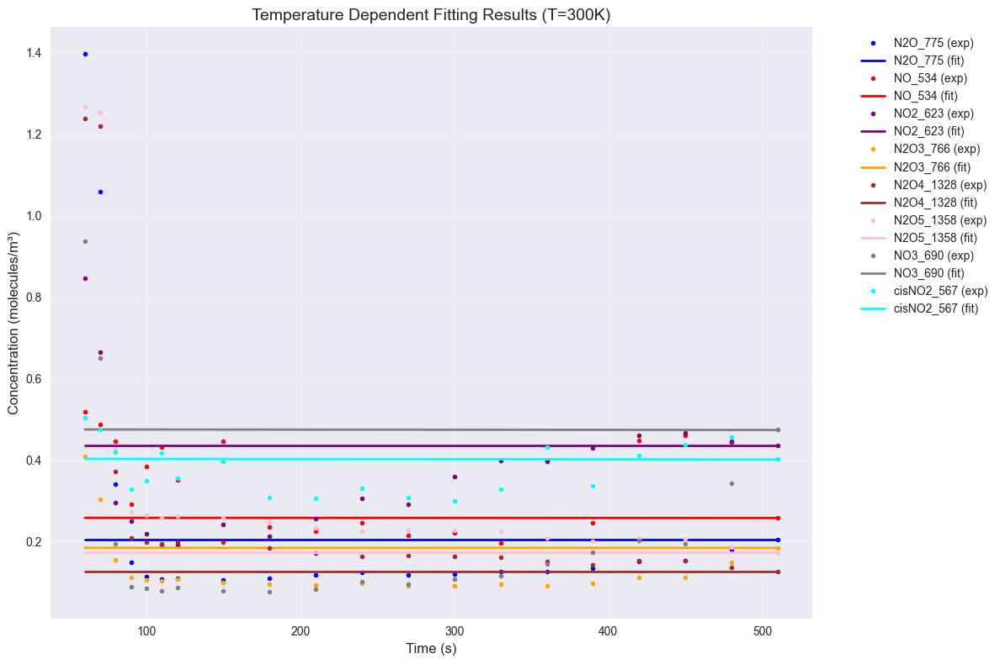

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from skopt import gp_minimize
from skopt.space import Real

def load_experimental_data():
    """実験データの読み込みと前処理"""
    base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
    
    # 測定時刻のリスト
    time_points = ['1114', '1124', '1134', '1144', '1154', '1204', '1214',
                  '1244', '1314', '1344', '1414', '1444', '1514', '1544', 
                  '1614', '1644', '1714', '1744', '1814', '1837']
    
    # 実験時間（秒）
    exp_times = [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    
    # 分子種と対応する波長
    molecules = {
        'NO_534': {'wavelength': 5340},
        'N2O4_1328': {'wavelength': 13280}, 
        'cisNO2_567': {'wavelength': 5670},
        'N2O3_766': {'wavelength': 7660},
        'NO2_623': {'wavelength': 6230},
        'NO3_690': {'wavelength': 6900},
        'N2O_775': {'wavelength': 7750},
        'N2O5_1358': {'wavelength': 13580},
        'O3_14': {'wavelength': 14180}
    }
    
    exp_data = {}
    for mol_key, mol_info in molecules.items():
        data_list = []
        for tp in time_points:
            # CSVファイルからデータ読み込み
            csv_path = f"{base_path}{tp}/absorbance_values_{mol_info['wavelength']}nm_{tp}.csv"
            df = pd.read_csv(csv_path, index_col=0)
            data = df.values
            
            # 欠損値の処理
            if np.any(np.isnan(data)):
                data = np.nan_to_num(data, nan=np.nanmean(data))
            data_list.append(data)
        
        # データの整形と負値の補正
        molecule_data = np.array(data_list).transpose(1, 2, 0)
        min_value = np.min(molecule_data)
        if min_value < 0:
            molecule_data = molecule_data - min_value
            
        exp_data[mol_key] = molecule_data
    
    return exp_data, exp_times

def calculate_rate_constant(alpha, beta, gamma, T_solid):
    """
    温度依存の反応速度定数を計算
    Args:
        alpha: 前指数因子
        beta: 温度依存性の指数
        gamma: 活性化エネルギー項
        T_solid: 固体温度 [K]
    Returns:
        反応速度定数
    """
    return alpha * ((T_solid/300.0)**beta) * np.exp(-gamma/T_solid)

def reaction_system(y, t, params, T_solid):
    """
    化学反応系の微分方程式
    Args:
        y: 各分子種の濃度 [molecules/m³]
        t: 時間 [s]
        params: [alpha, beta, gamma] のリスト（16の反応に対して）
        T_solid: 固体温度 [K]
    Returns:
        各分子種の時間変化率
    """
    N2O, NO, O3, NO2, N2O3, N2O4, N2O5, NO3, cisNO2, N2 = y
    
    # 各反応の速度定数を計算
    k = []
    for i in range(0, len(params), 3):
        k_i = calculate_rate_constant(
            params[i], params[i+1], params[i+2], T_solid)
        k.append(k_i)
    
    # 反応式に基づく濃度変化
    dN2O_dt = -k[0]*N2O - k[1]*N2O
    dNO_dt = k[1]*N2O - k[2]*NO*O3 - 2*k[11]*NO**2 + k[13]*N2O3
    dO3_dt = -k[2]*NO*O3 - k[10]*NO2*O3 - k[14]*O3
    dNO2_dt = k[2]*NO*O3 - k[4]*NO2*NO - 2*k[5]*NO2**2 + 2*k[7]*N2O4
    dN2O3_dt = k[4]*NO2*NO - k[13]*N2O3
    dN2O4_dt = k[5]*NO2**2 - k[7]*N2O4
    dN2O5_dt = k[8]*NO2*NO3 - k[9]*N2O5
    dNO3_dt = k[10]*NO2*O3 - k[8]*NO2*NO3 - k[15]*NO3
    dcisNO2_dt = k[11]*NO**2 - k[12]*cisNO2
    dN2_dt = k[0]*N2O
    
    return [dN2O_dt, dNO_dt, dO3_dt, dNO2_dt, dN2O3_dt, 
            dN2O4_dt, dN2O5_dt, dNO3_dt, dcisNO2_dt, dN2_dt]

def get_closest_time_index(exp_times, target_time=5400):
    """
    目標時間に最も近い実験時間のインデックスを取得
    Args:
        exp_times: 実験時間のリスト
        target_time: 目標時間（デフォルト：90分=5400秒）
    Returns:
        最も近い時間のインデックス
    """
    return np.argmin(np.abs(np.array(exp_times) - target_time))

def temperature_dependent_fitting(exp_data, exp_times, T_solid, i, j):
    """
    温度依存性を考慮したパラメータフィッティング
    Args:
        exp_data: 実験データ
        exp_times: 実験時間
        T_solid: 固体温度 [K]
        i, j: グリッド位置
    Returns:
        最適化されたパラメータ
    """
    # 90分時点の初期値を設定
    t_90min_idx = get_closest_time_index(exp_times)
    y0 = np.zeros(10)
    
    molecules = ['N2O_775', 'NO_534', 'O3_14', 'NO2_623', 'N2O3_766',
                'N2O4_1328', 'N2O5_1358', 'NO3_690', 'cisNO2_567']
    
    for idx, mol in enumerate(molecules):
        y0[idx] = exp_data[mol][i,j,t_90min_idx]
    
    def objective(params):
        """
        目的関数：実験値と計算値の重み付き二乗誤差
        """
        try:
            sol = odeint(reaction_system, y0, exp_times, 
                        args=(params, T_solid))
            
            error = 0
            weights = {
                'N2O_775': 7.0, 'NO_534': 3.3, 'O3_14': 8.0,
                'NO2_623': 6.4, 'N2O3_766': 6.4, 'N2O4_1328': 6.4,
                'N2O5_1358': 5.0, 'NO3_690': 5.2, 'cisNO2_567': 3.4
            }
            
            for idx, (mol_key, data) in enumerate(exp_data.items()):
                raw_error = np.sum((sol[:,idx] - data[i,j,:])**2)
                error += weights[mol_key] * raw_error
                
            return error
        except:
            return 1e10

    # パラメータ空間の定義
    space = []
    for _ in range(16):  # 16の反応
        space.extend([
            Real(1e-15, 1e-5, prior='log-uniform'),  # alpha
            Real(0, 2, prior='uniform'),             # beta
            Real(100, 5000, prior='uniform')         # gamma
        ])
    
    # ベイズ最適化の実行
    result = gp_minimize(
        objective,
        space,
        n_calls=200,
        n_random_starts=50,
        noise=1e-10,
        verbose=True
    )
    
    return result.x

def plot_results(exp_data, fitted_params, exp_times, T_solid, i, j):
    """
    フィッティング結果のプロット
    """
    molecules = ['N2O_775', 'NO_534', 'NO2_623', 'N2O3_766',
                'N2O4_1328', 'N2O5_1358', 'NO3_690', 'cisNO2_567']
    
    colors = ['blue', 'red', 'purple', 'orange',
              'brown', 'pink', 'gray', 'cyan']
    
    plt.figure(figsize=(12, 8))
    
    # 90分時点の初期値を設定
    t_90min_idx = get_closest_time_index(exp_times)
    y0 = np.zeros(10)
    for idx, mol in enumerate(molecules):
        y0[idx] = exp_data[mol][i,j,t_90min_idx]
    
    # シミュレーション結果の計算
    sol = odeint(reaction_system, y0, exp_times, 
                args=(fitted_params, T_solid))
    
    # プロット作成
    for idx, (mol, color) in enumerate(zip(molecules, colors)):
        plt.plot(exp_times, exp_data[mol][i,j,:], 'o',
                color=color, label=f'{mol} (exp)', markersize=4)
        plt.plot(exp_times, sol[:,idx], '-',
                color=color, label=f'{mol} (fit)', linewidth=2)
    
    plt.xlabel('Time (s)', fontsize=12)
    plt.ylabel('Concentration (molecules/m³)', fontsize=12)
    plt.title(f'Temperature Dependent Fitting Results (T={T_solid}K)', 
              fontsize=14)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig('temperature_dependent_fitting.png', dpi=300, 
                bbox_inches='tight')
    plt.show()

def save_results(fitted_params, output_file='fitted_parameters.csv'):
    """
    フィッティング結果の保存
    """
    param_df = pd.DataFrame({
        'Reaction': range(16),
        'Alpha': fitted_params[::3],
        'Beta': fitted_params[1::3],
        'Gamma': fitted_params[2::3]
    })
    param_df.to_csv(output_file, index=False)

def main():
    """メイン実行関数"""
    # データ読み込み
    exp_data, exp_times = load_experimental_data()
    
    # パラメータ設定
    T_solid = 300  # 固体温度 [K]
    i, j = 5, 5    # グリッド位置
    
    # フィッティング実行
    fitted_params = temperature_dependent_fitting(
        exp_data, exp_times, T_solid, i, j)
    
    # 結果の可視化
    plot_results(exp_data, fitted_params, exp_times, T_solid, i, j)
    
    # 結果の保存
    save_results(fitted_params)

if __name__ == "__main__":
    main()



Processing grid point (0,0)
Iteration No: 1 started. Evaluating function at random point.
Iteration No: 1 ended. Evaluation done at random point.
Time taken: 0.0010
Function value obtained: 15.8835
Current minimum: 15.8835
Iteration No: 2 started. Evaluating function at random point.
Iteration No: 2 ended. Evaluation done at random point.
Time taken: 0.0010
Function value obtained: 15.9235
Current minimum: 15.8835
Iteration No: 3 started. Evaluating function at random point.
Iteration No: 3 ended. Evaluation done at random point.
Time taken: 0.0010
Function value obtained: 15.9940
Current minimum: 15.8835
Iteration No: 4 started. Evaluating function at random point.
Iteration No: 4 ended. Evaluation done at random point.
Time taken: 0.0010
Function value obtained: 15.7273
Current minimum: 15.7273
Iteration No: 5 started. Evaluating function at random point.
Iteration No: 5 ended. Evaluation done at random point.
Time taken: 0.0010
Function value obtained: 15.8616
Current minimum: 15.72

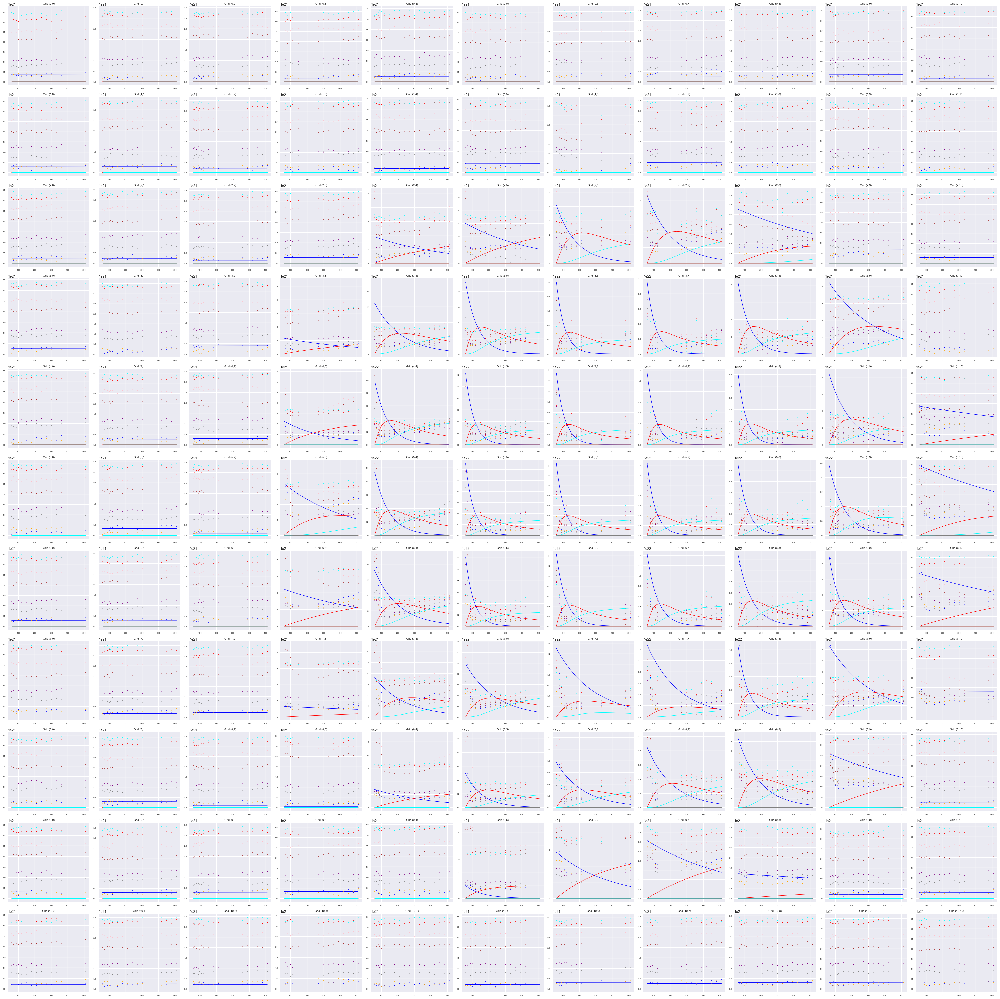

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from skopt import gp_minimize
from skopt.space import Real

def load_experimental_data():
    base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
    
    time_points = ['1114', '1124', '1134', '1144', '1154', '1204', '1214',
                  '1244', '1314', '1344', '1414', '1444', '1514', '1544', 
                  '1614', '1644', '1714', '1744', '1814', '1837']
    
    exp_times = [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    
    molecules = {
        'NO_534': {'wavelength': 5340},
        'N2O4_1328': {'wavelength': 13280}, 
        'cisNO2_567': {'wavelength': 5670},
        'N2O3_766': {'wavelength': 7660},
        'NO2_623': {'wavelength': 6230},
        'NO3_690': {'wavelength': 6900},
        'N2O_775': {'wavelength': 7750},
        'N2O5_1358': {'wavelength': 13580},
        'O3_14': {'wavelength': 14180}
    }
    
    exp_data = {}
    for mol_key, mol_info in molecules.items():
        data_list = []
        for tp in time_points:
            csv_path = f"{base_path}{tp}/absorbance_values_{mol_info['wavelength']}nm_{tp}.csv"
            df = pd.read_csv(csv_path, index_col=0)
            data = df.values
            if np.any(np.isnan(data)):
                data = np.nan_to_num(data, nan=np.nanmean(data))
            data_list.append(data)
        
        molecule_data = np.array(data_list).transpose(1, 2, 0)
        min_value = np.min(molecule_data)
        if min_value < 0:
            molecule_data = molecule_data - min_value
            
        exp_data[mol_key] = molecule_data
    
    return exp_data, exp_times

def reaction_system(y, t, k):
    N2O, NO, O3, NO2, N2O3, N2O4, N2O5, NO3, cisNO2, N2 = y
    
    dN2O_dt = -k[0]*N2O - k[1]*N2O
    dNO_dt = k[1]*N2O - k[2]*NO*O3 - 2*k[11]*NO**2 + k[13]*N2O3
    dO3_dt = - k[2]*NO*O3 - k[10]*NO2*O3 - k[14]*O3
    dNO2_dt = k[2]*NO*O3 - k[4]*NO2*NO - 2*k[5]*NO2**2 + 2*k[7]*N2O4
    dN2O3_dt = k[4]*NO2*NO - k[13]*N2O3
    dN2O4_dt = k[5]*NO2**2 - k[7]*N2O4
    dN2O5_dt = k[8]*NO2*NO3 - k[9]*N2O5
    dNO3_dt = k[10]*NO2*O3 - k[8]*NO2*NO3 - k[15]*NO3
    dcisNO2_dt = k[11]*NO**2 - k[12]*cisNO2
    dN2_dt = k[0]*N2O
    
    return [dN2O_dt, dNO_dt, dO3_dt, dNO2_dt, dN2O3_dt, 
            dN2O4_dt, dN2O5_dt, dNO3_dt, dcisNO2_dt, dN2_dt]

def raw_fitting(exp_data, exp_times, i, j):
    y0 = np.zeros(10)
    y0[0] = exp_data['N2O_775'][i,j,0]
    
    def objective(k):
        try:
            sol = odeint(reaction_system, y0, exp_times, args=(k,))
            error = 0
            
            weights = {
                'N2O_775': 3.0,
                'NO_534': 1.3,
                'O3_14': 1.2,
                'NO2_623': 1.4,
                'N2O3_766': 7.4,
                'N2O4_1328': 1.4,
                'N2O5_1358': 2.0,
                'NO3_690': 1.2,
                'cisNO2_567': 2.2
            }
            
            for idx, (mol_key, data) in enumerate(exp_data.items()):
                raw_error = np.sum((sol[:,idx] - data[i,j,:])**2)
                error += weights[mol_key] * raw_error
                
            return error
        except:
            return 1e10

    space = [Real(1e-5, 1e-2, prior='log-uniform') for _ in range(16)]
    
    result = gp_minimize(
        objective,
        space,
        n_calls=100,
        n_random_starts=20,
        noise=1e-10,
        verbose=True
    )
    
    return result.x

def plot_grid_comparison(exp_data, fitted_constants, exp_times):
    molecules = ['N2O_775', 'NO_534', 'NO2_623', 'N2O3_766', 
                'N2O4_1328', 'N2O5_1358', 'NO3_690', 'cisNO2_567']
    colors = ['blue', 'red', 'purple', 'orange', 
              'brown', 'pink', 'gray', 'cyan']
    
    epsilon = 9.747e-16
    l = 1.1e-7
    
    fig, axes = plt.subplots(11, 11, figsize=(40, 40))
    
    for i in range(11):
        for j in range(11):
            ax = axes[i,j]
            y0 = np.zeros(10)
            y0[0] = exp_data['N2O_775'][i,j,0]
            sol = odeint(reaction_system, y0, exp_times, args=(fitted_constants[i,j,:],))
            
            skip_o3_idx = 2
            for idx, (mol, color) in enumerate(zip(molecules, colors)):
                if idx >= skip_o3_idx:
                    plot_idx = idx + 1
                else:
                    plot_idx = idx
                    
                ax.plot(exp_times, exp_data[mol][i,j,:] / (epsilon * l), 'o', 
                        color=color, markersize=2)
                ax.plot(exp_times, sol[:,plot_idx] / (epsilon * l), '-', 
                        color=color, linewidth=1)
            
            ax.set_title(f'Grid ({i},{j})', fontsize=8)
            ax.tick_params(labelsize=6)
    
    plt.tight_layout()
    plt.savefig('full_grid_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()

def fit_all_grid():
    exp_data, exp_times = load_experimental_data()
    fitted_constants = np.zeros((11, 11, 16))
    
    for i in range(11):
        for j in range(11):
            print(f"Processing grid point ({i},{j})")
            fitted_constants[i,j,:] = raw_fitting(exp_data, exp_times, i, j)
            # 途中経過を保存
            np.save(f'fitted_constants_progress_{i}_{j}.npy', fitted_constants)
    
    return fitted_constants, exp_data, exp_times

def main():
    # 全グリッドのフィッティング実行
    fitted_constants, exp_data, exp_times = fit_all_grid()
    
    # 結果の保存
    np.save('fitted_constants_full_grid.npy', fitted_constants)
    
    # 全グリッドの結果をプロット
    plot_grid_comparison(exp_data, fitted_constants, exp_times)

if __name__ == "__main__":
    main()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from skopt import gp_minimize
from skopt.space import Real

def load_experimental_data():
    """実験データを読み込む関数
    Returns:
        exp_data (dict): 各分子種の実験データ
        exp_times (list): 時間点のリスト
    """
    base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
    
    # 測定時間点の定義
    time_points = ['1114', '1124', '1134', '1144', '1154', '1204', '1214',
                  '1244', '1314', '1344', '1414', '1444', '1514', '1544', 
                  '1614', '1644', '1714', '1744', '1814', '1837']
    
    # 実際の経過時間（秒）
    exp_times = [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    
    # 分子種と対応する波長の定義
    molecules = {
        'NO_534': {'wavelength': 5340},
        'N2O4_1328': {'wavelength': 13280}, 
        'cisNO2_567': {'wavelength': 5670},
        'N2O3_766': {'wavelength': 7660},
        'NO2_623': {'wavelength': 6230},
        'NO3_690': {'wavelength': 6900},
        'N2O_775': {'wavelength': 7750},
        'N2O5_1358': {'wavelength': 13580},
        'O3_14': {'wavelength': 14180}
    }
    
    # データ読み込みと前処理
    exp_data = {}
    for mol_key, mol_info in molecules.items():
        data_list = []
        for tp in time_points:
            csv_path = f"{base_path}{tp}/absorbance_values_{mol_info['wavelength']}nm_{tp}.csv"
            df = pd.read_csv(csv_path, index_col=0)
            data = df.values
            # 欠損値の処理
            if np.any(np.isnan(data)):
                data = np.nan_to_num(data, nan=np.nanmean(data))
            data_list.append(data)
        
        # データの整形と負値の補正
        molecule_data = np.array(data_list).transpose(1, 2, 0)
        min_value = np.min(molecule_data)
        if min_value < 0:
            molecule_data = molecule_data - min_value
            
        exp_data[mol_key] = molecule_data
    
    return exp_data, exp_times

def reaction_system(y, t, k):
    """化学反応系の微分方程式
    Args:
        y (array): 各分子種の濃度
        t (float): 時間
        k (array): 反応速度定数
    Returns:
        list: 各分子種の時間変化率
    """
    N2O, NO, O3, NO2, N2O3, N2O4, N2O5, NO3, cisNO2, N2, O, O2 = y
    
    # 各分子種の反応速度式
    dN2O_dt = -k[1]*N2O - k[2]*N2O
    dNO_dt = (k[2]*N2O - k[3]*NO*O3 - k[5]*NO2*NO + k[13]*N2O3 
              - k[11]*NO**2 + k[12]*cisNO2)
    dO3_dt = -k[3]*NO*O3 + k[4]*O2*O - k[14]*O3 - k[10]*NO2*O3
    dNO2_dt = (k[3]*NO*O3 - k[5]*NO2*NO + k[13]*N2O3 - k[10]*NO2*O3 
               - k[6]*NO2**2 + k[7]*N2O4 - k[8]*NO2*NO3 + k[9]*N2O5 + k[15]*NO3)
    dN2O3_dt = k[5]*NO2*NO - k[13]*N2O3
    dN2O4_dt = k[6]*NO2**2 - k[7]*N2O4
    dN2O5_dt = k[8]*NO2*NO3 - k[9]*N2O5
    dNO3_dt = k[10]*NO2*O3 - k[8]*NO2*NO3 + k[9]*N2O5 - k[15]*NO3
    dcisNO2_dt = k[11]*NO**2 - k[12]*cisNO2**2
    dN2_dt = k[1]*N2O
    dO_dt = k[1]*N2O - k[4]*O2*O + k[14]*O3 + k[15]*NO3
    dO2_dt = -k[4]*O2*O + k[14]*O3 + k[3]*NO*O3 + k[10]*NO2*O3
    
    return [dN2O_dt, dNO_dt, dO3_dt, dNO2_dt, dN2O3_dt, dN2O4_dt, 
            dN2O5_dt, dNO3_dt, dcisNO2_dt, dN2_dt, dO_dt, dO2_dt]

def fit_all_grid():
    """11×11グリッド全体のフィッティングを実行
    Returns:
        fitted_constants: フィッティングされた反応速度定数
        exp_data: 実験データ
        exp_times: 時間点
    """
    exp_data, exp_times = load_experimental_data()
    fitted_constants = np.zeros((11, 11, 16))
    
    for i in range(11):
        for j in range(11):
            print(f"グリッドポイント ({i},{j}) を処理中")
            fitted_constants[i,j,:] = raw_fitting(exp_data, exp_times, i, j)
            # 進捗状況を保存
            np.save(f'fitted_constants_{i}_{j}.npy', fitted_constants[i,j,:])
    
    return fitted_constants, exp_data, exp_times

def plot_grid_results(exp_data, fitted_constants, exp_times):
    """11×11グリッドの結果をプロット
    Args:
        exp_data: 実験データ
        fitted_constants: フィッティング結果
        exp_times: 時間点
    """
    fig, axes = plt.subplots(11, 11, figsize=(40, 40))
    molecules = ['N2O_775', 'NO_534', 'NO2_623', 'N2O3_766', 
                'N2O4_1328', 'N2O5_1358', 'NO3_690', 'cisNO2_567']
    colors = ['blue', 'red', 'purple', 'orange', 
              'brown', 'pink', 'gray', 'cyan']
    
    epsilon = 9.747e-16  # 吸光係数
    l = 1.1e-7  # 光路長
    
    for i in range(11):
        for j in range(11):
            y0 = np.zeros(12)
            y0[0] = exp_data['N2O_775'][i,j,0]
            sol = odeint(reaction_system, y0, exp_times, args=(fitted_constants[i,j,:],))
            
            for idx, (mol, color) in enumerate(zip(molecules, colors)):
                # 実験データのプロット
                axes[i,j].plot(exp_times, exp_data[mol][i,j,:] / (epsilon * l), 'o', 
                             color=color, label=f'{mol}', markersize=2)
                # フィッティング結果のプロット
                axes[i,j].plot(exp_times, sol[:,idx] / (epsilon * l), '-', 
                             color=color, linewidth=1)
            
            axes[i,j].set_title(f'Grid ({i},{j})', fontsize=8)
            axes[i,j].tick_params(labelsize=6)
    
    plt.tight_layout()
    plt.savefig('grid_results.png', dpi=300, bbox_inches='tight')
    plt.show()

def main():
    """メイン実行関数"""
    # グリッド全体のフィッティング実行
    fitted_constants, exp_data, exp_times = fit_all_grid()
    
    # 結果を保存
    np.save('fitted_constants_full.npy', fitted_constants)
    
    # 結果をプロット
    plot_grid_results(exp_data, fitted_constants, exp_times)

if __name__ == "__main__":
    main()


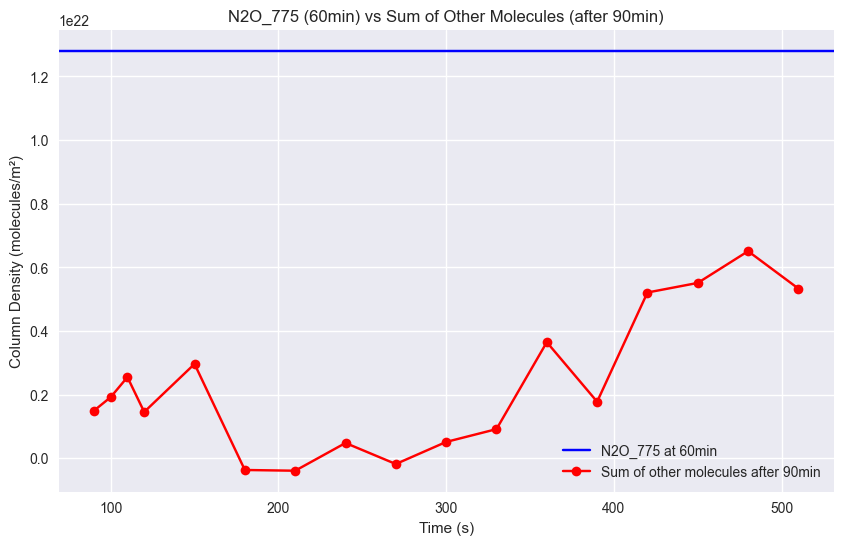


N2O_775 at 60min: 1.28e+22
Mean sum after 90min: 2.31e+21
Std of sum after 90min: 2.15e+21


In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def load_experimental_data():
    base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
    
    time_points = ['1114', '1124', '1134', '1144', '1154', '1204', '1214',
                  '1244', '1314', '1344', '1414', '1444', '1514', '1544', 
                  '1614', '1644', '1714', '1744', '1814', '1837']
    
    exp_times = [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    
    molecules = {
        'NO_534': {'wavelength': 5340},
        'N2O4_1328': {'wavelength': 13280}, 
        'cisNO2_567': {'wavelength': 5670},
        'N2O3_766': {'wavelength': 7660},
        'NO2_623': {'wavelength': 6230},
        'NO3_690': {'wavelength': 6900},
        'N2O_775': {'wavelength': 7750},
        'N2O5_1358': {'wavelength': 13580},
        'O3_14': {'wavelength': 14180}
    }
    
    exp_data = {}
    for mol_key, mol_info in molecules.items():
        data_list = []
        for tp in time_points:
            csv_path = f"{base_path}{tp}/absorbance_values_{mol_info['wavelength']}nm_{tp}.csv"
            df = pd.read_csv(csv_path, index_col=0)
            data = df.values
            if np.any(np.isnan(data)):
                data = np.nan_to_num(data, nan=np.nanmean(data))
            data_list.append(data)
        
        molecule_data = np.array(data_list).transpose(1, 2, 0)
        exp_data[mol_key] = molecule_data
    
    return exp_data, exp_times

def compare_n2o_with_sum(exp_data, exp_times, i=5, j=5):
    other_molecules = ['NO_534', 'NO2_623', 'N2O3_766',
                      'N2O4_1328', 'N2O5_1358', 'NO3_690', 
                      'cisNO2_567', 'O3_14']  # O3_14を追加
    
    epsilon = 9.747e-16
    l = 1.1e-7
    
    n2o_60min = exp_data['N2O_775'][i,j,0] / (epsilon * l)
    
    time_mask = np.array(exp_times) >= 90
    times_after_90 = np.array(exp_times)[time_mask]
    
    sum_others = np.zeros(len(times_after_90))
    for mol in other_molecules:
        sum_others += exp_data[mol][i,j,time_mask] / (epsilon * l)
    
    plt.figure(figsize=(10, 6))
    plt.axhline(y=n2o_60min, color='blue', linestyle='-', label='N2O_775 at 60min')
    plt.plot(times_after_90, sum_others, 'ro-', label='Sum of other molecules after 90min')
    
    plt.xlabel('Time (s)')
    plt.ylabel('Column Density (molecules/m²)')
    plt.title('N2O_775 (60min) vs Sum of Other Molecules (after 90min)')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    print(f"\nN2O_775 at 60min: {n2o_60min:.2e}")
    print(f"Mean sum after 90min: {np.mean(sum_others):.2e}")
    print(f"Std of sum after 90min: {np.std(sum_others):.2e}")

def main():
    exp_data, exp_times = load_experimental_data()
    i, j = 5, 5
    compare_n2o_with_sum(exp_data, exp_times, i, j)

if __name__ == "__main__":
    main()



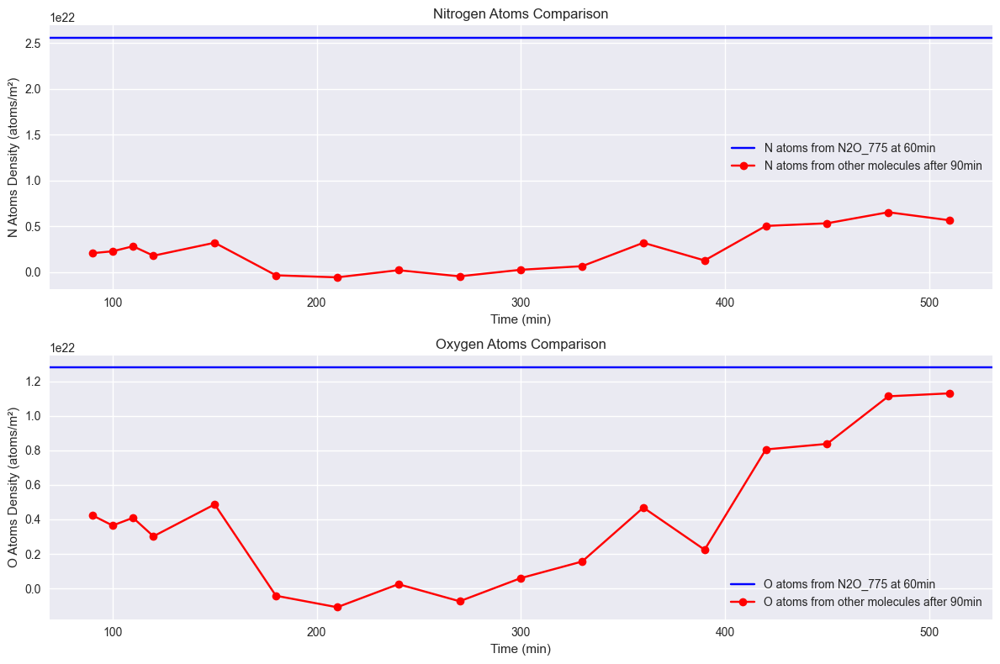


N2O_775 at 60min:
N atoms: 2.56e+22 atoms/m²
O atoms: 1.28e+22 atoms/m²

Mean sum after 90min:
N atoms: 2.29e+21 atoms/m²
O atoms: 3.87e+21 atoms/m²

Std after 90min:
N atoms: 2.22e+21 atoms/m²
O atoms: 3.79e+21 atoms/m²


In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def load_experimental_data():
    base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
    
    time_points = ['1114', '1124', '1134', '1144', '1154', '1204', '1214',
                  '1244', '1314', '1344', '1414', '1444', '1514', '1544', 
                  '1614', '1644', '1714', '1744', '1814', '1837']
    
    exp_times = [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    
    molecules = {
        'NO_534': {'wavelength': 5340},
        'N2O4_1328': {'wavelength': 13280}, 
        'cisNO2_567': {'wavelength': 5670},
        'N2O3_766': {'wavelength': 7660},
        'NO2_623': {'wavelength': 6230},
        'NO3_690': {'wavelength': 6900},
        'N2O_775': {'wavelength': 7750},
        'N2O5_1358': {'wavelength': 13580},
        'O3_14': {'wavelength': 14180}
    }
    
    exp_data = {}
    for mol_key, mol_info in molecules.items():
        data_list = []
        for tp in time_points:
            csv_path = f"{base_path}{tp}/absorbance_values_{mol_info['wavelength']}nm_{tp}.csv"
            df = pd.read_csv(csv_path, index_col=0)
            data = df.values
            if np.any(np.isnan(data)):
                data = np.nan_to_num(data, nan=np.nanmean(data))
            data_list.append(data)
        
        molecule_data = np.array(data_list).transpose(1, 2, 0)
        exp_data[mol_key] = molecule_data
    
    return exp_data, exp_times

def compare_atoms_density(exp_data, exp_times, i=5, j=5):
    atom_counts = {
        'NO_534': {'N': 1, 'O': 1},
        'NO2_623': {'N': 1, 'O': 2},
        'N2O3_766': {'N': 2, 'O': 3},
        'N2O4_1328': {'N': 2, 'O': 4},
        'N2O5_1358': {'N': 2, 'O': 5},
        'NO3_690': {'N': 1, 'O': 3},
        'cisNO2_567': {'N': 1, 'O': 2},
        'O3_14': {'N': 0, 'O': 3}
    }

    epsilon = 9.747e-16
    l = 1.1e-7
    
    n2o_density = exp_data['N2O_775'][i,j,0] / (epsilon * l)
    n2o_n_atoms = n2o_density * 2
    n2o_o_atoms = n2o_density

    time_mask = np.array(exp_times) >= 90
    times_after_90 = np.array(exp_times)[time_mask]
    
    sum_n_atoms = np.zeros(len(times_after_90))
    sum_o_atoms = np.zeros(len(times_after_90))
    
    for mol, counts in atom_counts.items():
        mol_density = exp_data[mol][i,j,time_mask] / (epsilon * l)
        sum_n_atoms += mol_density * counts['N']
        sum_o_atoms += mol_density * counts['O']

    plt.figure(figsize=(12, 8))
    
    plt.subplot(2, 1, 1)
    plt.axhline(y=n2o_n_atoms, color='blue', linestyle='-', label='N atoms from N2O_775 at 60min')
    plt.plot(times_after_90, sum_n_atoms, 'ro-', label='N atoms from other molecules after 90min')
    plt.xlabel('Time (min)')
    plt.ylabel('N Atoms Density (atoms/m²)')
    plt.title('Nitrogen Atoms Comparison')
    plt.legend()
    plt.grid(True)

    plt.subplot(2, 1, 2)
    plt.axhline(y=n2o_o_atoms, color='blue', linestyle='-', label='O atoms from N2O_775 at 60min')
    plt.plot(times_after_90, sum_o_atoms, 'ro-', label='O atoms from other molecules after 90min')
    plt.xlabel('Time (min)')
    plt.ylabel('O Atoms Density (atoms/m²)')
    plt.title('Oxygen Atoms Comparison')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()
    
    print(f"\nN2O_775 at 60min:")
    print(f"N atoms: {n2o_n_atoms:.2e} atoms/m²")
    print(f"O atoms: {n2o_o_atoms:.2e} atoms/m²")
    print(f"\nMean sum after 90min:")
    print(f"N atoms: {np.mean(sum_n_atoms):.2e} atoms/m²")
    print(f"O atoms: {np.mean(sum_o_atoms):.2e} atoms/m²")
    print(f"\nStd after 90min:")
    print(f"N atoms: {np.std(sum_n_atoms):.2e} atoms/m²")
    print(f"O atoms: {np.std(sum_o_atoms):.2e} atoms/m²")

def main():
    exp_data, exp_times = load_experimental_data()
    i, j = 5, 5
    compare_atoms_density(exp_data, exp_times, i, j)

if __name__ == "__main__":
    main()


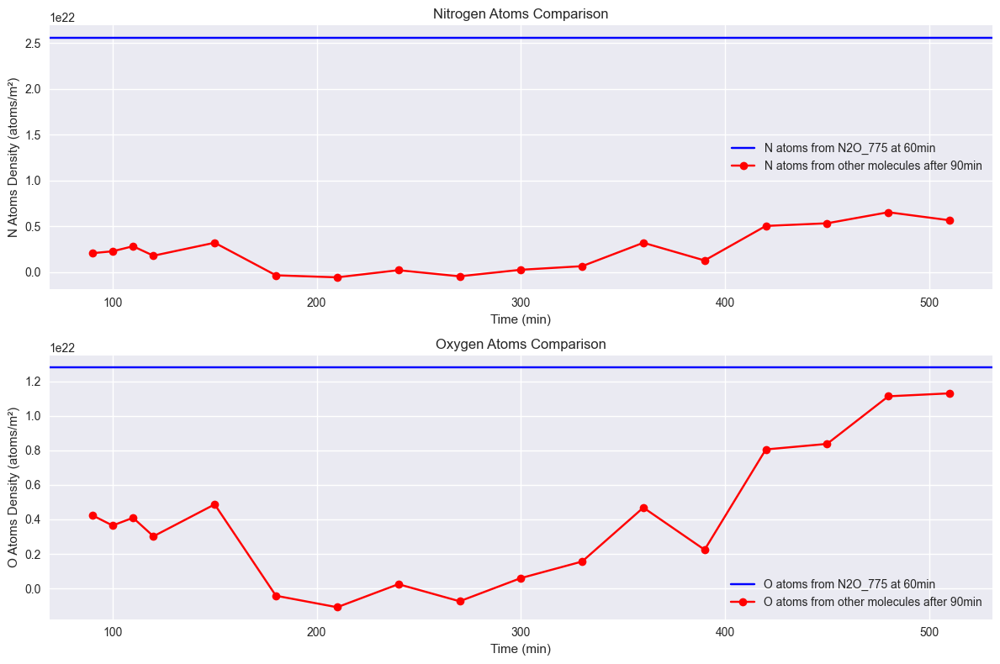


N2O_775 at 60min:
N atoms: 2.56e+22 atoms/m²
O atoms: 1.28e+22 atoms/m²

Mean sum after 90min:
N atoms: 2.29e+21 atoms/m²
O atoms: 3.87e+21 atoms/m²

Std after 90min:
N atoms: 2.22e+21 atoms/m²
O atoms: 3.79e+21 atoms/m²

N2O_775に対する他の分子の原子数の割合:
N原子: 8.93%
O原子: 30.24%


In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def load_experimental_data():
    base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
    
    time_points = ['1114', '1124', '1134', '1144', '1154', '1204', '1214',
                  '1244', '1314', '1344', '1414', '1444', '1514', '1544', 
                  '1614', '1644', '1714', '1744', '1814', '1837']
    
    exp_times = [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    
    molecules = {
        'NO_534': {'wavelength': 5340},
        'N2O4_1328': {'wavelength': 13280}, 
        'cisNO2_567': {'wavelength': 5670},
        'N2O3_766': {'wavelength': 7660},
        'NO2_623': {'wavelength': 6230},
        'NO3_690': {'wavelength': 6900},
        'N2O_775': {'wavelength': 7750},
        'N2O5_1358': {'wavelength': 13580},
        'O3_14': {'wavelength': 14180}
    }
    
    exp_data = {}
    for mol_key, mol_info in molecules.items():
        data_list = []
        for tp in time_points:
            csv_path = f"{base_path}{tp}/absorbance_values_{mol_info['wavelength']}nm_{tp}.csv"
            df = pd.read_csv(csv_path, index_col=0)
            data = df.values
            if np.any(np.isnan(data)):
                data = np.nan_to_num(data, nan=np.nanmean(data))
            data_list.append(data)
        
        molecule_data = np.array(data_list).transpose(1, 2, 0)
        exp_data[mol_key] = molecule_data
    
    return exp_data, exp_times

def compare_atoms_density(exp_data, exp_times, i=5, j=5):
    atom_counts = {
        'NO_534': {'N': 1, 'O': 1},
        'NO2_623': {'N': 1, 'O': 2},
        'N2O3_766': {'N': 2, 'O': 3},
        'N2O4_1328': {'N': 2, 'O': 4},
        'N2O5_1358': {'N': 2, 'O': 5},
        'NO3_690': {'N': 1, 'O': 3},
        'cisNO2_567': {'N': 1, 'O': 2},
        'O3_14': {'N': 0, 'O': 3}
    }

    epsilon = 9.747e-16
    l = 1.1e-7
    
    n2o_density = exp_data['N2O_775'][i,j,0] / (epsilon * l)
    n2o_n_atoms = n2o_density * 2
    n2o_o_atoms = n2o_density

    time_mask = np.array(exp_times) >= 90
    times_after_90 = np.array(exp_times)[time_mask]
    
    sum_n_atoms = np.zeros(len(times_after_90))
    sum_o_atoms = np.zeros(len(times_after_90))
    
    for mol, counts in atom_counts.items():
        mol_density = exp_data[mol][i,j,time_mask] / (epsilon * l)
        sum_n_atoms += mol_density * counts['N']
        sum_o_atoms += mol_density * counts['O']

    plt.figure(figsize=(12, 8))
    
    plt.subplot(2, 1, 1)
    plt.axhline(y=n2o_n_atoms, color='blue', linestyle='-', label='N atoms from N2O_775 at 60min')
    plt.plot(times_after_90, sum_n_atoms, 'ro-', label='N atoms from other molecules after 90min')
    plt.xlabel('Time (min)')
    plt.ylabel('N Atoms Density (atoms/m²)')
    plt.title('Nitrogen Atoms Comparison')
    plt.legend()
    plt.grid(True)

    plt.subplot(2, 1, 2)
    plt.axhline(y=n2o_o_atoms, color='blue', linestyle='-', label='O atoms from N2O_775 at 60min')
    plt.plot(times_after_90, sum_o_atoms, 'ro-', label='O atoms from other molecules after 90min')
    plt.xlabel('Time (min)')
    plt.ylabel('O Atoms Density (atoms/m²)')
    plt.title('Oxygen Atoms Comparison')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()
    
    print(f"\nN2O_775 at 60min:")
    print(f"N atoms: {n2o_n_atoms:.2e} atoms/m²")
    print(f"O atoms: {n2o_o_atoms:.2e} atoms/m²")
    print(f"\nMean sum after 90min:")
    print(f"N atoms: {np.mean(sum_n_atoms):.2e} atoms/m²")
    print(f"O atoms: {np.mean(sum_o_atoms):.2e} atoms/m²")
    print(f"\nStd after 90min:")
    print(f"N atoms: {np.std(sum_n_atoms):.2e} atoms/m²")
    print(f"O atoms: {np.std(sum_o_atoms):.2e} atoms/m²")

    # N2O_775に対する他の分子の原子数の割合を計算して表示
    n_percentage = (np.mean(sum_n_atoms) / n2o_n_atoms) * 100
    o_percentage = (np.mean(sum_o_atoms) / n2o_o_atoms) * 100
    
    print(f"\nN2O_775に対する他の分子の原子数の割合:")
    print(f"N原子: {n_percentage:.2f}%")
    print(f"O原子: {o_percentage:.2f}%")

def main():
    exp_data, exp_times = load_experimental_data()
    i, j = 5, 5
    compare_atoms_density(exp_data, exp_times, i, j)

if __name__ == "__main__":
    main()


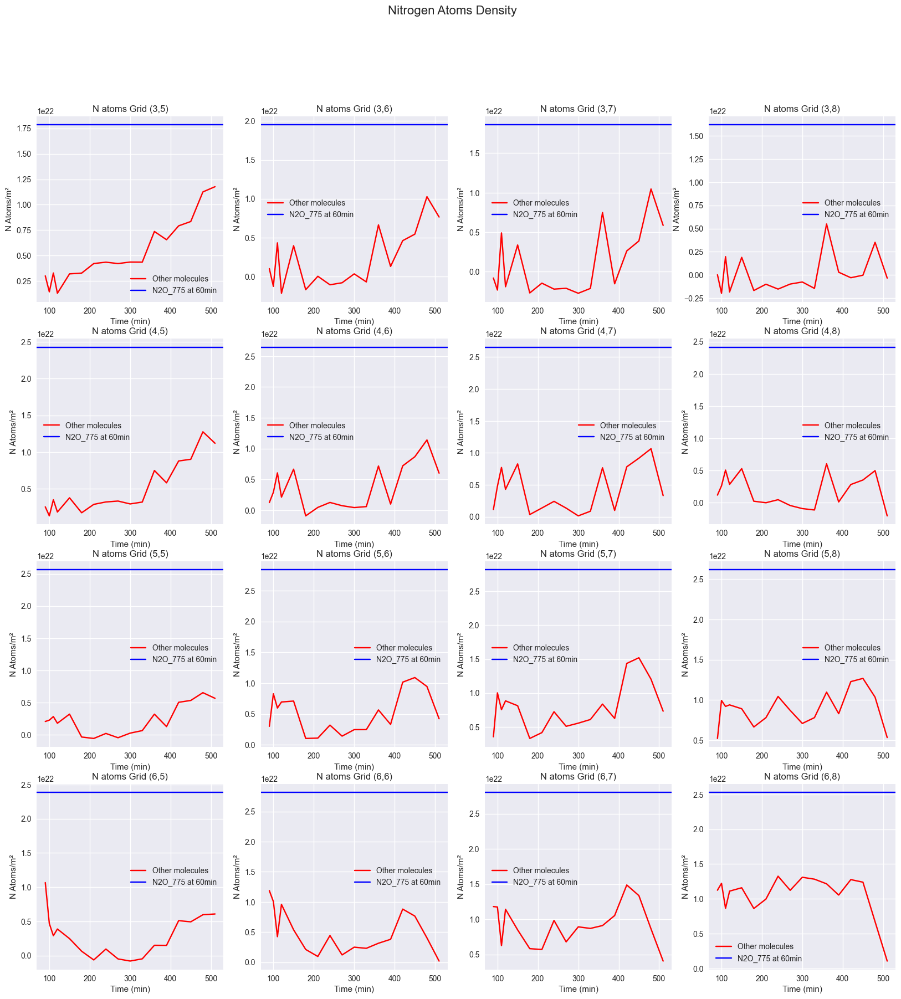

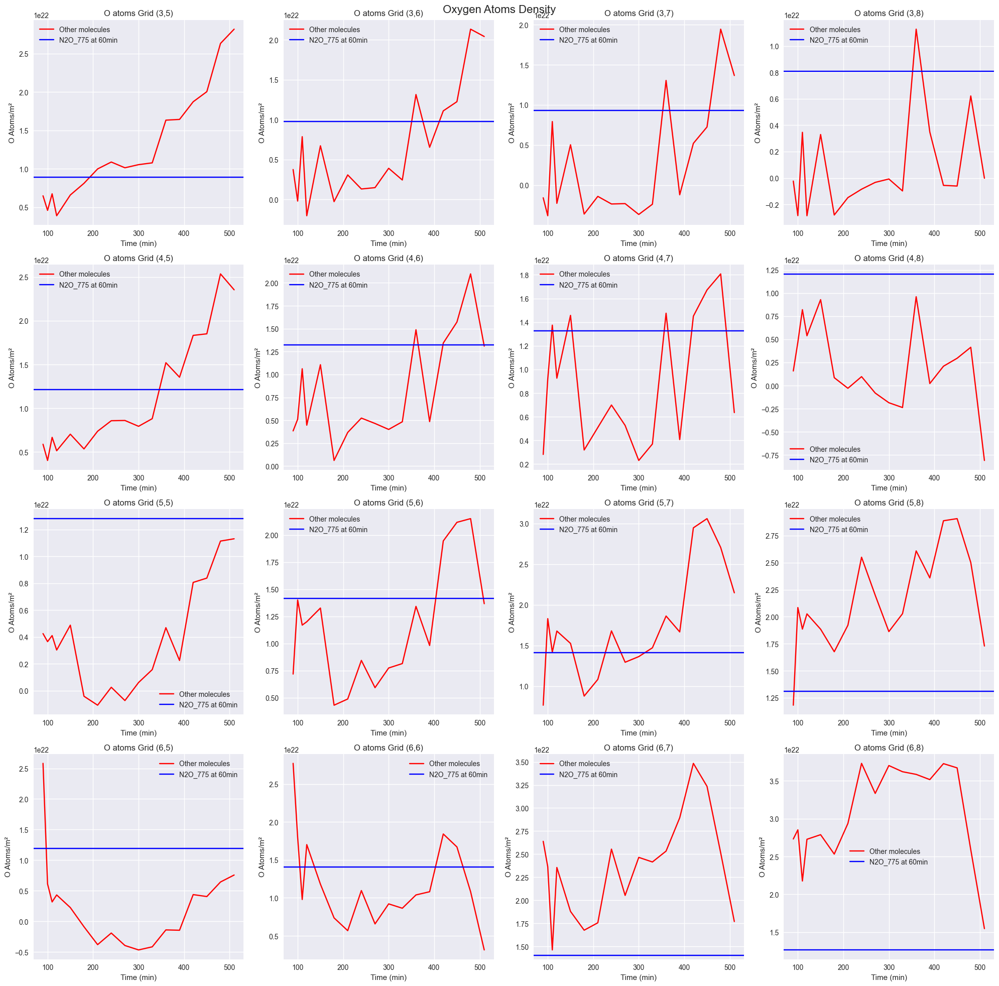

In [32]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def load_experimental_data():
    base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
    
    time_points = ['1114', '1124', '1134', '1144', '1154', '1204', '1214',
                  '1244', '1314', '1344', '1414', '1444', '1514', '1544', 
                  '1614', '1644', '1714', '1744', '1814', '1837']
    
    exp_times = [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    
    molecules = {
        'NO_534': {'wavelength': 5340},
        'N2O4_1328': {'wavelength': 13280}, 
        'cisNO2_567': {'wavelength': 5670},
        'N2O3_766': {'wavelength': 7660},
        'NO2_623': {'wavelength': 6230},
        'NO3_690': {'wavelength': 6900},
        'N2O_775': {'wavelength': 7750},
        'N2O5_1358': {'wavelength': 13580},
        'O3_14': {'wavelength': 14180}
    }
    
    exp_data = {}
    for mol_key, mol_info in molecules.items():
        data_list = []
        for tp in time_points:
            csv_path = f"{base_path}{tp}/absorbance_values_{mol_info['wavelength']}nm_{tp}.csv"
            df = pd.read_csv(csv_path, index_col=0)
            data = df.values
            if np.any(np.isnan(data)):
                data = np.nan_to_num(data, nan=np.nanmean(data))
            data_list.append(data)
        
        molecule_data = np.array(data_list).transpose(1, 2, 0)
        exp_data[mol_key] = molecule_data
    
    return exp_data, exp_times

def plot_selected_points(exp_data, exp_times):
    grid_points = [
        (3,5), (3,6), (3,7), (3,8),
        (4,5), (4,6), (4,7), (4,8),
        (5,5), (5,6), (5,7), (5,8),
        (6,5), (6,6), (6,7), (6,8)
    ]
    
    atom_counts = {
        'NO_534': {'N': 1, 'O': 1},
        'NO2_623': {'N': 1, 'O': 2},
        'N2O3_766': {'N': 2, 'O': 3},
        'N2O4_1328': {'N': 2, 'O': 4},
        'N2O5_1358': {'N': 2, 'O': 5},
        'NO3_690': {'N': 1, 'O': 3},
        'cisNO2_567': {'N': 1, 'O': 2},
        'O3_14': {'N': 0, 'O': 3}
    }

    epsilon = 9.747e-16
    l = 1.1e-7
    
    fig_n = plt.figure(figsize=(20, 20))
    fig_o = plt.figure(figsize=(20, 20))
    
    axes_n = fig_n.subplots(4, 4)
    axes_o = fig_o.subplots(4, 4)
    
    time_mask = np.array(exp_times) >= 90
    times_after_90 = np.array(exp_times)[time_mask]

    for idx, (i, j) in enumerate(grid_points):
        row = idx // 4
        col = idx % 4
        
        n2o_density = exp_data['N2O_775'][i,j,0] / (epsilon * l)
        n2o_n_atoms = n2o_density * 2
        n2o_o_atoms = n2o_density
        
        sum_n_atoms = np.zeros(len(times_after_90))
        sum_o_atoms = np.zeros(len(times_after_90))
        
        for mol, counts in atom_counts.items():
            mol_density = exp_data[mol][i,j,time_mask] / (epsilon * l)
            sum_n_atoms += mol_density * counts['N']
            sum_o_atoms += mol_density * counts['O']
        
        axes_n[row,col].plot(times_after_90, sum_n_atoms, 'r-', label='Other molecules')
        axes_n[row,col].axhline(y=n2o_n_atoms, color='b', linestyle='-', label='N2O_775 at 60min')
        axes_n[row,col].set_title(f'N atoms Grid ({i},{j})')
        axes_n[row,col].grid(True)
        axes_n[row,col].set_xlabel('Time (min)')
        axes_n[row,col].set_ylabel('N Atoms/m²')
        axes_n[row,col].legend()
        
        axes_o[row,col].plot(times_after_90, sum_o_atoms, 'r-', label='Other molecules')
        axes_o[row,col].axhline(y=n2o_o_atoms, color='b', linestyle='-', label='N2O_775 at 60min')
        axes_o[row,col].set_title(f'O atoms Grid ({i},{j})')
        axes_o[row,col].grid(True)
        axes_o[row,col].set_xlabel('Time (min)')
        axes_o[row,col].set_ylabel('O Atoms/m²')
        axes_o[row,col].legend()

    fig_n.suptitle('Nitrogen Atoms Density', fontsize=16)
    fig_o.suptitle('Oxygen Atoms Density', fontsize=16)
    
    plt.tight_layout()
    plt.show()

def main():
    exp_data, exp_times = load_experimental_data()
    plot_selected_points(exp_data, exp_times)

if __name__ == "__main__":
    main()



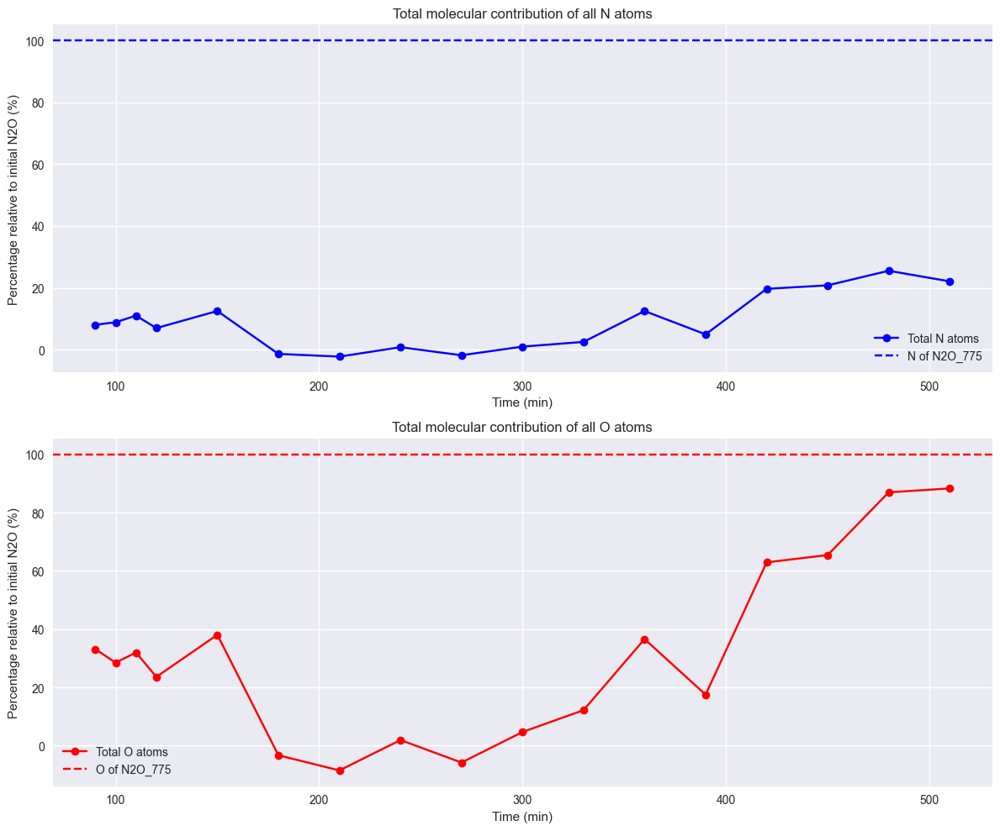


基準値と比較:
N原子の基準値 (N2O×2): 2.56e+22 atoms
現在のN原子数平均: 2.29e+21 atoms (8.93%)

O原子の基準値 (N2O×1): 1.28e+22 atoms
現在のO原子数平均: 3.87e+21 atoms (30.24%)


In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def load_experimental_data():
    base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
    
    time_points = ['1114', '1124', '1134', '1144', '1154', '1204', '1214',
                  '1244', '1314', '1344', '1414', '1444', '1514', '1544', 
                  '1614', '1644', '1714', '1744', '1814', '1837']
    
    exp_times = [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    
    molecules = {
        'NO_534': {'wavelength': 5340},
        'N2O4_1328': {'wavelength': 13280}, 
        'cisNO2_567': {'wavelength': 5670},
        'N2O3_766': {'wavelength': 7660},
        'NO2_623': {'wavelength': 6230},
        'NO3_690': {'wavelength': 6900},
        'N2O_775': {'wavelength': 7750},
        'N2O5_1358': {'wavelength': 13580},
        'O3_14': {'wavelength': 14180}
    }
    
    exp_data = {}
    for mol_key, mol_info in molecules.items():
        data_list = []
        for tp in time_points:
            csv_path = f"{base_path}{tp}/absorbance_values_{mol_info['wavelength']}nm_{tp}.csv"
            df = pd.read_csv(csv_path, index_col=0)
            data = df.values
            if np.any(np.isnan(data)):
                data = np.nan_to_num(data, nan=np.nanmean(data))
            data_list.append(data)
        
        molecule_data = np.array(data_list).transpose(1, 2, 0)
        exp_data[mol_key] = molecule_data
    
    return exp_data, exp_times

def compare_atoms_density(exp_data, exp_times, i=5, j=5):
    atom_counts = {
        'NO_534': {'N': 1, 'O': 1},
        'NO2_623': {'N': 1, 'O': 2},
        'N2O3_766': {'N': 2, 'O': 3},
        'N2O4_1328': {'N': 2, 'O': 4},
        'N2O5_1358': {'N': 2, 'O': 5},
        'NO3_690': {'N': 1, 'O': 3},
        'cisNO2_567': {'N': 1, 'O': 2},
        'O3_14': {'N': 0, 'O': 3}
    }

    epsilon = 9.747e-16
    l = 1.1e-7
    
    n2o_density = exp_data['N2O_775'][i,j,0] / (epsilon * l)
    n2o_n_atoms = n2o_density * 2
    n2o_o_atoms = n2o_density

    time_mask = np.array(exp_times) >= 90
    times_after_90 = np.array(exp_times)[time_mask]
    
    sum_n_atoms = np.zeros(len(times_after_90))
    sum_o_atoms = np.zeros(len(times_after_90))
    
    for mol, counts in atom_counts.items():
        mol_density = exp_data[mol][i,j,time_mask] / (epsilon * l)
        sum_n_atoms += mol_density * counts['N']
        sum_o_atoms += mol_density * counts['O']

    n_percentage = (sum_n_atoms / n2o_n_atoms) * 100
    o_percentage = (sum_o_atoms / n2o_o_atoms) * 100

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))

    ax1.plot(times_after_90, n_percentage, 'bo-', label='Total N atoms')
    ax1.axhline(y=100, color='blue', linestyle='--', label='N of N2O_775')
    ax1.set_title('Total molecular contribution of all N atoms')
    ax1.set_xlabel('Time (min)')
    ax1.set_ylabel('Percentage relative to initial N2O (%)')
    ax1.legend()
    ax1.grid(True)

    ax2.plot(times_after_90, o_percentage, 'ro-', label='Total O atoms')
    ax2.axhline(y=100, color='red', linestyle='--', label='O of N2O_775')
    ax2.set_title('Total molecular contribution of all O atoms')
    ax2.set_xlabel('Time (min)')
    ax2.set_ylabel('Percentage relative to initial N2O (%)')
    ax2.legend()
    ax2.grid(True)

    plt.tight_layout()
    plt.show()

    print("\n基準値と比較:")
    print(f"N原子の基準値 (N2O×2): {n2o_n_atoms:.2e} atoms")
    print(f"現在のN原子数平均: {np.mean(sum_n_atoms):.2e} atoms ({np.mean(n_percentage):.2f}%)")
    print(f"\nO原子の基準値 (N2O×1): {n2o_o_atoms:.2e} atoms")
    print(f"現在のO原子数平均: {np.mean(sum_o_atoms):.2e} atoms ({np.mean(o_percentage):.2f}%)")

def main():
    exp_data, exp_times = load_experimental_data()
    i, j = 5, 5
    compare_atoms_density(exp_data, exp_times, i, j)

if __name__ == "__main__":
    main()



In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def load_experimental_data():
    base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
    
    time_points = ['1114', '1124', '1134', '1144', '1154', '1204', '1214',
                  '1244', '1314', '1344', '1414', '1444', '1514', '1544', 
                  '1614', '1644', '1714', '1744', '1814', '1837']
    
    exp_times = [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    
    molecules = {
        'NO_534': {'wavelength': 5340},
        'N2O4_1328': {'wavelength': 13280}, 
        'cisNO2_567': {'wavelength': 5670},
        'N2O3_766': {'wavelength': 7660},
        'NO2_623': {'wavelength': 6230},
        'NO3_690': {'wavelength': 6900},
        'N2O_775': {'wavelength': 7750},
        'N2O5_1358': {'wavelength': 13580},
        'O3_14': {'wavelength': 14180}
    }
    
    exp_data = {}
    for mol_key, mol_info in molecules.items():
        data_list = []
        for tp in time_points:
            csv_path = f"{base_path}{tp}/absorbance_values_{mol_info['wavelength']}nm_{tp}.csv"
            df = pd.read_csv(csv_path, index_col=0)
            data = df.values
            if np.any(np.isnan(data)):
                data = np.nan_to_num(data, nan=np.nanmean(data))
            data_list.append(data)
        
        molecule_data = np.array(data_list).transpose(1, 2, 0)
        exp_data[mol_key] = molecule_data
    
    return exp_data, exp_times

def analyze_grid_densities(exp_data, exp_times):
    atom_counts = {
        'NO_534': {'N': 1, 'O': 1},
        'NO2_623': {'N': 1, 'O': 2},
        'N2O3_766': {'N': 2, 'O': 3},
        'N2O4_1328': {'N': 2, 'O': 4},
        'N2O5_1358': {'N': 2, 'O': 5},
        'NO3_690': {'N': 1, 'O': 3},
        'cisNO2_567': {'N': 1, 'O': 2},
        'O3_14': {'N': 0, 'O': 3}
    }

    epsilon = 9.747e-16
    l = 1.1e-7
    
    # Create figure with 11x11 grid
    fig, axes = plt.subplots(11, 11, figsize=(40, 40))
    fig.suptitle('Atomic Density Analysis Across 11x11 Grid', fontsize=24)
    
    # Process each grid point
    for i in range(11):
        for j in range(11):
            # Calculate N2O densities at 60min
            n2o_density = exp_data['N2O_775'][i,j,0] / (epsilon * l)
            n2o_n_atoms = n2o_density * 2
            n2o_o_atoms = n2o_density

            # Calculate densities after 90min
            time_mask = np.array(exp_times) >= 90
            times_after_90 = np.array(exp_times)[time_mask]
            
            sum_n_atoms = np.zeros(len(times_after_90))
            sum_o_atoms = np.zeros(len(times_after_90))
            
            for mol, counts in atom_counts.items():
                mol_density = exp_data[mol][i,j,time_mask] / (epsilon * l)
                sum_n_atoms += mol_density * counts['N']
                sum_o_atoms += mol_density * counts['O']

            # Plot for each grid point
            ax = axes[i,j]
            ax.axhline(y=n2o_n_atoms, color='blue', linestyle='-', label='N2O_775 (60min)')
            ax.plot(times_after_90, sum_n_atoms, 'ro-', markersize=3, label='Other molecules')
            ax.plot(times_after_90, sum_o_atoms, 'go-', markersize=3, label='O atoms')
            
            ax.set_title(f'Position ({i},{j})', fontsize=8)
            ax.tick_params(axis='both', which='major', labelsize=6)
            
            if i == 10:  # Bottom row
                ax.set_xlabel('Time (s)', fontsize=8)
            if j == 0:  # Leftmost column
                ax.set_ylabel('Density (atoms/m²)', fontsize=8)
            
            if i == 0 and j == 0:  # Legend only for top-left plot
                ax.legend(fontsize=6)
            
            ax.grid(True, alpha=0.3)
            ax.set_yscale('log')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig('grid_density_analysis.png', dpi=300, bbox_inches='tight')
    plt.close()

def main():
    print("Loading experimental data...")
    exp_data, exp_times = load_experimental_data()
    
    print("Analyzing grid densities...")
    analyze_grid_densities(exp_data, exp_times)
    
    print("Analysis complete. Results saved as 'grid_density_analysis.png'")

if __name__ == "__main__":
    main()


Loading experimental data...
Analyzing grid densities...
Analysis complete. Results saved as 'grid_density_analysis.png'


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from skopt import gp_minimize
from skopt.space import Real

def load_experimental_data():
    base_path = 'C:/Users/daiki/sokendai/N2O/experiment data/UV/zipdata/'
    
    time_points = ['1114', '1124', '1134', '1144', '1154', '1204', '1214',
                  '1244', '1314', '1344', '1414', '1444', '1514', '1544', 
                  '1614', '1644', '1714', '1744', '1814', '1837']
    
    exp_times = [60, 70, 80, 90, 100, 110, 120, 150, 180, 210, 240, 270, 300,
                330, 360, 390, 420, 450, 480, 510]
    
    molecules = {
        'NO_534': {'wavelength': 5340},
        'N2O4_1328': {'wavelength': 13280}, 
        'cisNO2_567': {'wavelength': 5670},
        'N2O3_766': {'wavelength': 7660},
        'NO2_623': {'wavelength': 6230},
        'NO3_690': {'wavelength': 6900},
        'N2O_775': {'wavelength': 7750},
        'N2O5_1358': {'wavelength': 13580},
        'O3_14': {'wavelength': 14180}
    }
    
    exp_data = {}
    for mol_key, mol_info in molecules.items():
        data_list = []
        for tp in time_points:
            csv_path = f"{base_path}{tp}/absorbance_values_{mol_info['wavelength']}nm_{tp}.csv"
            df = pd.read_csv(csv_path, index_col=0)
            data = df.values
            if np.any(np.isnan(data)):
                data = np.nan_to_num(data, nan=np.nanmean(data))
            data_list.append(data)
        
        molecule_data = np.array(data_list).transpose(1, 2, 0)
        min_value = np.min(molecule_data)
        if min_value < 0:
            molecule_data = molecule_data - min_value
            
        exp_data[mol_key] = molecule_data
    
    return exp_data, exp_times

def reaction_system(y, t, k):
    N2O, NO, O3, NO2, N2O3, N2O4, N2O5, NO3, cisNO2, N2 = y
    
    dN2O_dt = -k[0]*N2O - k[1]*N2O
    dNO_dt = k[1]*N2O - k[2]*NO*O3 - 2*k[11]*NO**2 + k[13]*N2O3
    dO3_dt = - k[2]*NO*O3 - k[10]*NO2*O3 - k[14]*O3
    dNO2_dt = k[2]*NO*O3 - k[4]*NO2*NO - 2*k[5]*NO2**2 + 2*k[7]*N2O4
    dN2O3_dt = k[4]*NO2*NO - k[13]*N2O3
    dN2O4_dt = k[5]*NO2**2 - k[7]*N2O4
    dN2O5_dt = k[8]*NO2*NO3 - k[9]*N2O5
    dNO3_dt = k[10]*NO2*O3 - k[8]*NO2*NO3 - k[15]*NO3
    dcisNO2_dt = k[11]*NO**2 - k[12]*cisNO2
    dN2_dt = k[0]*N2O
    
    return [dN2O_dt, dNO_dt, dO3_dt, dNO2_dt, dN2O3_dt, 
            dN2O4_dt, dN2O5_dt, dNO3_dt, dcisNO2_dt, dN2_dt]

def scale_data(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data) + 1e-10)

def advanced_fitting(exp_data, exp_times, i, j):
    y0 = np.zeros(10)
    y0[0] = exp_data['N2O_775'][i,j,0]
    
    scaled_exp_data = {key: scale_data(value) for key, value in exp_data.items()}
    
    def objective(k):
        try:
            sol = odeint(reaction_system, y0, exp_times, args=(k,))
            scaled_sol = scale_data(sol)
            error = 0
            
            weights = {
                'N2O_775': 7.0,
                'NO_534': 1.3,
                'O3_14': 1.2,
                'NO2_623': 2.4,
                'N2O3_766': 3.4,
                'N2O4_1328': 1.4,
                'N2O5_1358': 2.0,
                'NO3_690': 2.2,
                'cisNO2_567': 2.2
            }
            
            for idx, (mol_key, data) in enumerate(scaled_exp_data.items()):
                relative_error = np.sum(((scaled_sol[:,idx] - data[i,j,:]) / (data[i,j,:] + 1e-10))**2)
                error += weights[mol_key] * relative_error
                
            return error
        except:
            return 1e10

    space = [Real(1e-5, 1e-2, prior='log-uniform') for _ in range(16)]
    
    result = gp_minimize(
        objective,
        space,
        n_calls=400,
        n_random_starts=60,
        noise=1e-10,
        verbose=True
    )
    
    return result.x

def plot_grid_comparison(exp_data, fitted_results, exp_times):
    fig, axes = plt.subplots(11, 11, figsize=(30, 30))
    plt.subplots_adjust(wspace=0.4, hspace=0.4)
    
    # 解析領域の定義
    analysis_region = np.zeros((11, 11), dtype=bool)
    analysis_region[1:9, 1:89] = True
    
    molecules = ['N2O_775', 'NO_534', 'NO2_623', 'N2O3_766', 
                'N2O4_1328', 'N2O5_1358', 'NO3_690', 'cisNO2_567']
    colors = plt.cm.tab10(np.linspace(0, 1, len(molecules)))
    
    epsilon = 9.747e-16
    l = 1.1e-7
    
    for i in range(11):
        for j in range(11):
            ax = axes[i, j]
            
            if not analysis_region[i, j]:
                ax.set_facecolor('#FAFAFA')  # 薄い灰色
                ax.set_title(f'Grid ({i},{j})', fontsize=8)
                ax.tick_params(labelsize=6)
                continue
            
            y0 = np.zeros(10)
            y0[0] = exp_data['N2O_775'][i,j,0]
            
            sol = odeint(reaction_system, y0, exp_times, args=(fitted_results[i,j,:],))
            
            for idx, (mol, color) in enumerate(zip(molecules, colors)):
                plot_idx = idx if idx < 2 else idx + 1
                ax.plot(exp_times, exp_data[mol][i,j,:] / (epsilon * l), 'o',
                       color=color, markersize=1, alpha=0.5)
                ax.plot(exp_times, sol[:,plot_idx] / (epsilon * l), '-',
                       color=color, linewidth=0.8)
            
            ax.set_title(f'Grid ({i},{j})', fontsize=8)
            ax.tick_params(labelsize=6)
            if i == 10:
                ax.set_xlabel('Time (s)', fontsize=6)
            if j == 0:
                ax.set_ylabel('Density (m⁻²)', fontsize=6)
    
    handles = []
    labels = []
    for mol, color in zip(molecules, colors):
        handles.append(plt.Line2D([0], [0], color=color, linestyle='-'))
        labels.append(mol)
    fig.legend(handles, labels, loc='center right', bbox_to_anchor=(0.98, 0.5))
    
    plt.suptitle('Reaction Kinetics: Experiment vs Fitted Model', fontsize=16)
    plt.savefig('grid_comparison_2.png', dpi=300, bbox_inches='tight')
    plt.close()

def main():
    exp_data, exp_times = load_experimental_data()
    fitted_constants = np.zeros((11, 11, 16))
    
    for i in range(11):
        for j in range(11):
            print(f"Fitting grid position ({i},{j})")
            fitted_constants[i,j,:] = advanced_fitting(exp_data, exp_times, i, j)
    
    np.save('fitted_constants_grid_2.npy', fitted_constants)
    plot_grid_comparison(exp_data, fitted_constants, exp_times)

if __name__ == "__main__":
    main()


Fitting grid position (0,0)
Iteration No: 1 started. Evaluating function at random point.
Iteration No: 1 ended. Evaluation done at random point.
Time taken: 0.0021
Function value obtained: 446.8330
Current minimum: 446.8330
Iteration No: 2 started. Evaluating function at random point.
Iteration No: 2 ended. Evaluation done at random point.
Time taken: 0.0010
Function value obtained: 480.4719
Current minimum: 446.8330
Iteration No: 3 started. Evaluating function at random point.
Iteration No: 3 ended. Evaluation done at random point.
Time taken: 0.0000
Function value obtained: 427.0529
Current minimum: 427.0529
Iteration No: 4 started. Evaluating function at random point.
Iteration No: 4 ended. Evaluation done at random point.
Time taken: 0.0010
Function value obtained: 436.4807
Current minimum: 427.0529
Iteration No: 5 started. Evaluating function at random point.
Iteration No: 5 ended. Evaluation done at random point.
Time taken: 0.0010
Function value obtained: 441.7198
Current minim

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors

def analyze_rate_constants():
    """
    Function to calculate and visualize reaction rate constants for D2 lamp, Triton, and Pluto
    """
    # 光子フラックスの定義
    PHI_TRITON = 2.01e18    # photons/m^2
    PHI_PLUTO = 1.17e18     # photons/m^2
    PHI_D2_LUMP = 7.38e25   # photons/m^2

    # データ読み込みと光子フラックス比の計算
    k_d2_lump = np.load('fitted_constants_grid.npy')
    ratio_triton = PHI_TRITON / PHI_D2_LUMP
    ratio_pluto = PHI_PLUTO / PHI_D2_LUMP
    
    # 各天体の速度定数計算
    k_triton = k_d2_lump * ratio_triton
    k_pluto = k_d2_lump * ratio_pluto

    # 反応の説明リスト
    reaction_descriptions = [
        "N2O → N2 + O (Photolysis process)",                    # k[0]
        "N2O → NO + N (Photolysis process)",                    # k[1] 
        "NO + O3 → NO2 + O2 (NO oxidation)",                    # k[2]
        "O3 production rate (constant term)",                    # k[3]
        "NO2 + NO → N2O3 (NOx association)",                    # k[4]
        "2NO2 → N2O4 (NO2 dimerization)",                       # k[5]
        "N2O4 → 2NO2 (N2O4 thermal decomposition)",             # k[6]
        "NO2 + NO3 → N2O5 (NOx higher oxide formation)",        # k[7]
        "N2O5 → NO2 + NO3 (N2O5 thermal decomposition)",        # k[8]
        "NO2 + O3 → NO3 + O2 (NO2 oxidation)",                 # k[9]
        "NO2 + NO3 → N2O5 (Nighttime NOx chemistry)",          # k[10]
        "2NO → cisNO2 (NO dimerization)",                      # k[11]
        "cisNO2 → 2NO (Isomer decomposition)",                 # k[12]
        "N2O3 → NO2 + NO (N2O3 dissociation)",                # k[13]
        "O3 → O2 + O (Ozone decomposition)",                   # k[14]
        "NO3 → NO2 + O (NO3 photolysis)"                      # k[15]
    ]

    environments = {
        'D2 Lamp': k_d2_lump,
        'Triton': k_triton,
        'Pluto': k_pluto
    }

    all_results = {}
    
    for env_name, constants in environments.items():
        means = []
        std_devs = []
        filtered_data_counts = []
        
        for i in range(16):
            data = constants[:, :, i]
            initial_filter = data[~np.isnan(data) & (data > 0)]
            
            mean_val = np.mean(initial_filter)
            std_val = np.std(initial_filter)
            valid_data = initial_filter[
                (initial_filter >= mean_val - 3*std_val) & 
                (initial_filter <= mean_val + 3*std_val)
            ]
            
            means.append(np.mean(valid_data))
            std_devs.append(np.std(valid_data))
            filtered_data_counts.append(len(valid_data))
            
        all_results[env_name] = {
            'means': means,
            'std_devs': std_devs,
            'counts': filtered_data_counts
        }

    # グラフ作成
    plt.figure(figsize=(15, 10))
    x = np.arange(16)
    colors = {'D2 Lamp': 'blue', 'Triton': 'red', 'Pluto': 'green'}
    markers = {'D2 Lamp': 'o', 'Triton': 's', 'Pluto': '^'}
    
    for env_name, results in all_results.items():
        plt.scatter(x, results['means'], color=colors[env_name], 
                   marker=markers[env_name],
                   label=f'{env_name}', alpha=0.7, s=100)

    # グラフ設定
    plt.yscale('log')
    plt.xlabel('Rate Constant Index', fontsize=12)
    plt.ylabel('Rate Constant [s⁻¹]', fontsize=12)
    plt.title('Comparative Analysis of Chemical Reaction Rates\nD2 Lamp vs Triton vs Pluto (3σ Filtered)', 
             fontsize=14, pad=20)
    plt.grid(True, which="both", ls="-", alpha=0.2)
    plt.xticks(x, [f'k{i}' for i in range(16)], rotation=45)
    plt.legend(loc='upper right')

    # 詳細データの表示
    for env_name, results in all_results.items():
        print(f"\nStatistical Analysis Results for {env_name} (3σ Filtered):")
        print("=" * 80)
        for i, (desc, mean, std, n) in enumerate(zip(reaction_descriptions, 
                                                    results['means'], 
                                                    results['std_devs'], 
                                                    results['counts'])):
            print(f"k[{i}] {desc}")
            print(f"    Mean: {mean:.2e} s⁻¹")
            print(f"    Standard Deviation: {std:.2e} s⁻¹")
            print(f"    Valid data points: {n}")
            print("-" * 80)

    plt.tight_layout()
    plt.savefig('rate_constants_comparison_analysis.png',
                dpi=300,
                bbox_inches='tight',
                metadata={'Title': 'Rate Constants Comparison Analysis',
                         'Description': 'Comparison of rate constants between D2 lamp, Triton, and Pluto'})
    plt.close()
    
    return all_results

def main():
    """
    Main execution function
    """
    print("Starting comparative analysis of rate constants...")
    results = analyze_rate_constants()
    print("Analysis complete. Results saved as 'rate_constants_comparison_analysis.png'")

if __name__ == "__main__":
    main()


Starting comparative analysis of rate constants...

Statistical Analysis Results for D2 Lamp (3σ Filtered):
k[0] N2O → N2 + O (Photolysis process)
    Mean: 1.39e-03 s⁻¹
    Standard Deviation: 3.15e-03 s⁻¹
    Valid data points: 121
--------------------------------------------------------------------------------
k[1] N2O → NO + N (Photolysis process)
    Mean: 6.04e-03 s⁻¹
    Standard Deviation: 3.67e-03 s⁻¹
    Valid data points: 121
--------------------------------------------------------------------------------
k[2] NO + O3 → NO2 + O2 (NO oxidation)
    Mean: 9.96e-03 s⁻¹
    Standard Deviation: 3.31e-04 s⁻¹
    Valid data points: 115
--------------------------------------------------------------------------------
k[3] O3 production rate (constant term)
    Mean: 2.37e-03 s⁻¹
    Standard Deviation: 3.39e-03 s⁻¹
    Valid data points: 121
--------------------------------------------------------------------------------
k[4] NO2 + NO → N2O3 (NOx association)
    Mean: 4.32e-03 s⁻¹
 

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors

def load_and_process_data():
    """データの読み込みと前処理"""
    PHI_TRITON = 2.01e18    # photons/m^2
    PHI_PLUTO = 1.17e18     # photons/m^2
    PHI_D2_LUMP = 7.38e25   # photons/m^2

    k_d2_lump = np.load('fitted_constants_grid.npy')
    ratio_triton = PHI_TRITON / PHI_D2_LUMP
    ratio_pluto = PHI_PLUTO / PHI_D2_LUMP
    
    k_triton = k_d2_lump * ratio_triton
    k_pluto = k_d2_lump * ratio_pluto

    return {
        'D2 Lamp': k_d2_lump,
        'Triton': k_triton,
        'Pluto': k_pluto
    }

def create_reaction_descriptions():
    """反応過程の説明定義"""
    return [
        "N2O → N2 + O (Photolysis)",                    
        "N2O → NO + N (Photolysis)",                    
        "NO + O3 → NO2 + O2 (NO Oxidation)",          
        "O3 Production Rate (Constant)",                
        "NO2 + NO → N2O3 (NOx Association)",          
        "2NO2 → N2O4 (NO2 Dimerization)",              
        "N2O4 → 2NO2 (N2O4 Thermal Decomposition)",    
        "NO2 + NO3 → N2O5 (Higher NOx Oxide Formation)",
        "N2O5 → NO2 + NO3 (N2O5 Decomposition)",      
        "NO2 + O3 → NO3 + O2 (NO2 Oxidation)",        
        "NO2 + NO3 → N2O5 (NOx Chemistry)",            
        "2NO → cisNO2 (NO Dimerization)",              
        "cisNO2 → 2NO (Isomer Decomposition)",        
        "N2O3 → NO2 + NO (N2O3 Dissociation)",        
        "O3 → O2 + O (Ozone Decomposition)",          
        "NO3 → NO2 + O (NO3 Photolysis)"              
    ]

def create_analysis_mask(shape=(11,11), center=(5,5), radius=5):
    """解析領域のマスク生成"""
    y, x = np.ogrid[0:shape[0], 0:shape[1]]
    return (x - center[0])**2 + (y - center[1])**2 <= radius**2

def plot_single_reaction(ax, k_data, mask, k_idx, description, mean_constant):
    """個別反応マップのプロット"""
    k_data[~mask] = np.nan
    valid_data = k_data[~np.isnan(k_data) & (k_data > 0)]
    
    if len(valid_data) > 0:
        vmin = np.percentile(valid_data, 5) * 0.1
        vmax = np.percentile(valid_data, 95) * 10
    else:
        vmin, vmax = 1e-10, 1e-2

    im = ax.imshow(k_data, cmap='viridis', norm=colors.LogNorm(vmin=vmin, vmax=vmax))
    ax.imshow(~mask, cmap='gray', alpha=0.3)
    
    colorbar = plt.colorbar(im, ax=ax)
    colorbar.set_label('Rate Constant [s⁻¹]', fontsize=8)
    colorbar.ax.tick_params(labelsize=7)
    
    ax.set_title(f'{description}\nMean: {mean_constant:.2e} s⁻¹',
                fontsize=8, pad=10)
    ax.set_xticks(range(11))
    ax.set_yticks(range(11))
    ax.set_xticklabels([f'x{i}' for i in range(11)], fontsize=6)
    ax.set_yticklabels([f'y{i}' for i in range(11)], fontsize=6)
    
    ax.grid(True, color='white', linestyle='-', linewidth=0.5, alpha=0.3)
    ax.set_xlabel('X Grid Position', fontsize=6)
    ax.set_ylabel('Y Grid Position', fontsize=6)

def plot_single_environment_map(environment_name, data, output_filename):
    """単一環境の反応マップを表示して保存"""
    mask = create_analysis_mask()
    reaction_descriptions = create_reaction_descriptions()

    fig = plt.figure(figsize=(20, 20))
    gs = fig.add_gridspec(4, 4, hspace=0.4, wspace=0.3)
    fig.suptitle(f'Reaction Rate Constants Analysis: {environment_name}', 
                 fontsize=20, y=0.95)

    for k_idx in range(16):
        ax = fig.add_subplot(gs[k_idx // 4, k_idx % 4])
        k_data = data[:, :, k_idx].copy()
        title = f"k[{k_idx}]\n{reaction_descriptions[k_idx]}"
        plot_single_reaction(ax, k_data, mask, k_idx, title, np.nanmean(k_data))

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    fig.savefig(output_filename,
                dpi=300,
                bbox_inches='tight',
                metadata={'Title': f'Reaction Rate Analysis - {environment_name}',
                         'Author': 'Chemical Kinetics Analysis Tool',
                         'Description': f'Analysis of reaction rates in {environment_name}'})
    plt.close()

def save_mean_values(environments):
    """平均値の保存"""
    mean_values = {}
    for env_name, data in environments.items():
        mean_values[env_name] = np.nanmean(data, axis=(0,1))
    
    np.save('reaction_constants_means.npy', mean_values)
    return mean_values

def plot_all_environments():
    """全環境の反応マップを別々に生成"""
    environments = load_and_process_data()
    mean_values = save_mean_values(environments)
    
    for env_name, data in environments.items():
        output_filename = f'reaction_analysis_{env_name.lower().replace(" ", "_")}.png'
        print(f"Generating visualization for {env_name}...")
        plot_single_environment_map(env_name, data, output_filename)
        print(f"Saved as {output_filename}")
        
        # 平均値の表示
        print(f"\nMean values for {env_name}:")
        for i, mean_val in enumerate(mean_values[env_name]):
            print(f"k[{i}]: {mean_val:.2e} s⁻¹")
        print("-" * 50)

def main():
    """メイン実行関数"""
    print("Starting reaction analysis for each environment...")
    plot_all_environments()
    print("Analysis complete. Generated separate visualizations for each environment.")

if __name__ == "__main__":
    main()



Starting reaction analysis for each environment...
Generating visualization for D2 Lamp...


C:\Users\daiki\AppData\Local\Temp\ipykernel_5880\2892882935.py:95: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])


Saved as reaction_analysis_d2_lamp.png

Mean values for D2 Lamp:
k[0]: 1.39e-03 s⁻¹
k[1]: 6.04e-03 s⁻¹
k[2]: 9.51e-03 s⁻¹
k[3]: 2.37e-03 s⁻¹
k[4]: 4.32e-03 s⁻¹
k[5]: 3.03e-03 s⁻¹
k[6]: 2.88e-03 s⁻¹
k[7]: 2.81e-03 s⁻¹
k[8]: 3.58e-03 s⁻¹
k[9]: 1.80e-03 s⁻¹
k[10]: 5.05e-03 s⁻¹
k[11]: 5.42e-03 s⁻¹
k[12]: 1.99e-03 s⁻¹
k[13]: 1.77e-03 s⁻¹
k[14]: 1.76e-03 s⁻¹
k[15]: 1.78e-03 s⁻¹
--------------------------------------------------
Generating visualization for Triton...


C:\Users\daiki\AppData\Local\Temp\ipykernel_5880\2892882935.py:95: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])


Saved as reaction_analysis_triton.png

Mean values for Triton:
k[0]: 3.77e-11 s⁻¹
k[1]: 1.65e-10 s⁻¹
k[2]: 2.59e-10 s⁻¹
k[3]: 6.45e-11 s⁻¹
k[4]: 1.18e-10 s⁻¹
k[5]: 8.25e-11 s⁻¹
k[6]: 7.85e-11 s⁻¹
k[7]: 7.67e-11 s⁻¹
k[8]: 9.75e-11 s⁻¹
k[9]: 4.91e-11 s⁻¹
k[10]: 1.38e-10 s⁻¹
k[11]: 1.48e-10 s⁻¹
k[12]: 5.41e-11 s⁻¹
k[13]: 4.83e-11 s⁻¹
k[14]: 4.78e-11 s⁻¹
k[15]: 4.84e-11 s⁻¹
--------------------------------------------------
Generating visualization for Pluto...


C:\Users\daiki\AppData\Local\Temp\ipykernel_5880\2892882935.py:95: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])


Saved as reaction_analysis_pluto.png

Mean values for Pluto:
k[0]: 2.20e-11 s⁻¹
k[1]: 9.58e-11 s⁻¹
k[2]: 1.51e-10 s⁻¹
k[3]: 3.75e-11 s⁻¹
k[4]: 6.85e-11 s⁻¹
k[5]: 4.80e-11 s⁻¹
k[6]: 4.57e-11 s⁻¹
k[7]: 4.46e-11 s⁻¹
k[8]: 5.67e-11 s⁻¹
k[9]: 2.86e-11 s⁻¹
k[10]: 8.01e-11 s⁻¹
k[11]: 8.59e-11 s⁻¹
k[12]: 3.15e-11 s⁻¹
k[13]: 2.81e-11 s⁻¹
k[14]: 2.79e-11 s⁻¹
k[15]: 2.82e-11 s⁻¹
--------------------------------------------------
Analysis complete. Generated separate visualizations for each environment.


In [6]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors

def plot_reaction_constant_maps_with_errors():
    # データ読み込み
    fitted_constants = np.load('fitted_constants_grid.npy')
    
    # 平均値と標準誤差の計算
    mean_constants = np.nanmean(fitted_constants, axis=(0,1))
    std_err = np.nanstd(fitted_constants, axis=(0,1)) / np.sqrt(np.sum(~np.isnan(fitted_constants), axis=(0,1)))
    np.save('reaction_constants_means.npy', mean_constants)
    
    # 反応の説明
    reaction_descriptions = [
        "N2O → N2 + O (Photolysis)",                    
        "N2O → NO + N (Photolysis)",                    
        "NO + O3 → NO2 + O2 (NO Oxidation)",           
        "O3 Production Rate (Constant)",                
        "NO2 + NO → N2O3 (NOx Association)",           
        "2NO2 → N2O4 (NO2 Dimerization)",              
        "N2O4 → 2NO2 (N2O4 Thermal Decomposition)",    
        "NO2 + NO3 → N2O5 (Higher NOx Oxide Formation)",
        "N2O5 → NO2 + NO3 (N2O5 Decomposition)",       
        "NO2 + O3 → NO3 + O2 (NO2 Oxidation)",         
        "NO2 + NO3 → N2O5 (NOx Chemistry)",            
        "2NO → cisNO2 (NO Dimerization)",              
        "cisNO2 → 2NO (Isomer Decomposition)",         
        "N2O3 → NO2 + NO (N2O3 Dissociation)",         
        "O3 → O2 + O (Ozone Decomposition)",           
        "NO3 → NO2 + O (NO3 Photolysis)"               
    ]

    # ヒートマップの作成
    fig1, axes = plt.subplots(4, 4, figsize=(20, 20))
    fig1.suptitle('Spatial Distribution Analysis of Atmospheric Chemical Reaction Rate Constants', 
                 fontsize=16, y=0.95)
    
    # マスク領域の設定
    y, x = np.ogrid[0:11, 0:11]
    center = (5, 5)
    radius = 5
    mask = (x - center[0])**2 + (y - center[1])**2 <= radius**2
    
    # 各反応のヒートマップ作成
    for k_idx in range(16):
        ax = axes.flat[k_idx]
        k_data = fitted_constants[:, :, k_idx].copy()
        k_data[~mask] = np.nan
        
        valid_data = k_data[~np.isnan(k_data) & (k_data > 0)]
        if len(valid_data) > 0:
            vmin = np.percentile(valid_data, 5) * 0.1
            vmax = np.percentile(valid_data, 95) * 10
        else:
            vmin, vmax = 1e-10, 1e-2

        im = ax.imshow(k_data, cmap='viridis', norm=colors.LogNorm(vmin=vmin, vmax=vmax))
        ax.imshow(~mask, cmap='gray', alpha=0.3)
        
        colorbar = plt.colorbar(im, ax=ax)
        colorbar.set_label('Rate Constant [s⁻¹]', fontsize=8)
        colorbar.ax.tick_params(labelsize=7)
        
        ax.set_title(f'k[{k_idx}]: {reaction_descriptions[k_idx]}\nMean: {mean_constants[k_idx]:.2e} s⁻¹',
                    fontsize=10, pad=10)
        ax.set_xticks(range(11))
        ax.set_yticks(range(11))
        ax.set_xticklabels([f'x{i}' for i in range(11)], fontsize=8)
        ax.set_yticklabels([f'y{i}' for i in range(11)], fontsize=8)
        
        ax.grid(True, color='white', linestyle='-', linewidth=0.5, alpha=0.3)
        ax.set_xlabel('X Grid Position', fontsize=8)
        ax.set_ylabel('Y Grid Position', fontsize=8)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig('reaction_rate_constants_analysis.png', dpi=300, bbox_inches='tight')
    plt.close()

    # 平均値と標準誤差のエラーバープロット作成
    fig2, ax = plt.subplots(figsize=(15, 8))
    x = np.arange(len(reaction_descriptions))
    
    # 点とエラーバーの表示
    ax.errorbar(x, mean_constants, yerr=std_err, fmt='o', capsize=5, 
               markersize=8, elinewidth=2, capthick=2)
    
    ax.set_yscale('log')
    ax.set_xticks(x)
    ax.set_xticklabels([f'k[{i}]' for i in range(16)], rotation=0)
    ax.set_ylabel('Rate Constant [s⁻¹]')
    ax.set_title('Mean Reaction Rate Constants with Standard Errors')
    ax.grid(True, which='both', linestyle='--', alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('reaction_constants_mean_with_errors.png', dpi=300, bbox_inches='tight')
    plt.close()

def main():
    print("Starting analysis of reaction rate constants...")
    plot_reaction_constant_maps_with_errors()
    print("Analysis complete.")
    print("Visualizations saved as:")
    print("- reaction_rate_constants_analysis.png")
    print("- reaction_constants_mean_with_errors.png")
    print("Mean values saved as reaction_constants_means.npy")

if __name__ == "__main__":
    main()


Starting analysis of reaction rate constants...
Analysis complete.
Visualizations saved as:
- reaction_rate_constants_analysis.png
- reaction_constants_mean_with_errors.png
Mean values saved as reaction_constants_means.npy


In [9]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def load_and_process_data():
    """データの読み込みと前処理"""
    PHI_TRITON = 2.01e18    # photons/m^2
    PHI_PLUTO = 1.17e18     # photons/m^2
    PHI_D2_LUMP = 7.38e25   # photons/m^2

    k_d2_lump = np.load('fitted_constants_grid.npy')
    mean_constants = np.nanmean(k_d2_lump, axis=(0,1))
    std_err = np.nanstd(k_d2_lump, axis=(0,1)) / np.sqrt(np.sum(~np.isnan(k_d2_lump), axis=(0,1)))
    
    ratio_triton = PHI_TRITON / PHI_D2_LUMP
    ratio_pluto = PHI_PLUTO / PHI_D2_LUMP
   
    k_triton = mean_constants * ratio_triton
    k_pluto = mean_constants * ratio_pluto
    
    # エラーの伝播
    err_triton = std_err * ratio_triton
    err_pluto = std_err * ratio_pluto

    return {
        'D2 Lamp': (mean_constants, std_err),
        'Triton': (k_triton, err_triton),
        'Pluto': (k_pluto, err_pluto)
    }, k_d2_lump

def plot_reaction_constant_maps_with_errors():
    # データ読み込みと処理
    rate_constants, fitted_constants = load_and_process_data()
    
    # 反応の説明
    reaction_descriptions = [
        "N2O → N2 + O (Photolysis)",                    
        "N2O → NO + N (Photolysis)",                    
        "NO + O3 → NO2 + O2 (NO Oxidation)",           
        "O3 Production Rate (Constant)",                
        "NO2 + NO → N2O3 (NOx Association)",           
        "2NO2 → N2O4 (NO2 Dimerization)",              
        "N2O4 → 2NO2 (N2O4 Thermal Decomposition)",    
        "NO2 + NO3 → N2O5 (Higher NOx Oxide Formation)",
        "N2O5 → NO2 + NO3 (N2O5 Decomposition)",       
        "NO2 + O3 → NO3 + O2 (NO2 Oxidation)",         
        "NO2 + NO3 → N2O5 (NOx Chemistry)",            
        "2NO → cisNO2 (NO Dimerization)",              
        "cisNO2 → 2NO (Isomer Decomposition)",         
        "N2O3 → NO2 + NO (N2O3 Dissociation)",         
        "O3 → O2 + O (Ozone Decomposition)",           
        "NO3 → NO2 + O (NO3 Photolysis)"               
    ]

    # ヒートマップの作成
    fig1, axes = plt.subplots(4, 4, figsize=(20, 20))
    fig1.suptitle('Spatial Distribution Analysis of Atmospheric Chemical Reaction Rate Constants', 
                 fontsize=16, y=0.95)
    
    # マスク領域の設定
    y, x = np.ogrid[0:11, 0:11]
    center = (5, 5)
    radius = 5
    mask = (x - center[0])**2 + (y - center[1])**2 <= radius**2
    
    # 各反応のヒートマップ作成
    for k_idx in range(16):
        ax = axes.flat[k_idx]
        k_data = fitted_constants[:, :, k_idx].copy()
        k_data[~mask] = np.nan
        
        valid_data = k_data[~np.isnan(k_data) & (k_data > 0)]
        if len(valid_data) > 0:
            vmin = np.percentile(valid_data, 5) * 0.1
            vmax = np.percentile(valid_data, 95) * 10
        else:
            vmin, vmax = 1e-10, 1e-2

        im = ax.imshow(k_data, cmap='viridis', norm=mcolors.LogNorm(vmin=vmin, vmax=vmax))
        ax.imshow(~mask, cmap='gray', alpha=0.3)
        
        colorbar = plt.colorbar(im, ax=ax)
        colorbar.set_label('Rate Constant [s⁻¹]', fontsize=8)
        colorbar.ax.tick_params(labelsize=7)
        
        ax.set_title(f'k[{k_idx}]: {reaction_descriptions[k_idx]}\nMean: {rate_constants["D2 Lamp"][0][k_idx]:.2e} s⁻¹',
                    fontsize=10, pad=10)
        ax.set_xticks(range(11))
        ax.set_yticks(range(11))
        ax.set_xticklabels([f'x{i}' for i in range(11)], fontsize=8)
        ax.set_yticklabels([f'y{i}' for i in range(11)], fontsize=8)
        
        ax.grid(True, color='white', linestyle='-', linewidth=0.5, alpha=0.3)
        ax.set_xlabel('X Grid Position', fontsize=8)
        ax.set_ylabel('Y Grid Position', fontsize=8)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig('reaction_rate_constants_analysis.png', dpi=300, bbox_inches='tight')
    plt.close()

    # 平均値と標準誤差のエラーバープロット作成
    fig2, ax = plt.subplots(figsize=(15, 8))
    x = np.arange(16)
    
    # 各環境のデータをプロット
    markers = ['o', 's', '^']
    plot_colors = ['blue', 'red', 'green']
    
    for (name, (data, err)), marker, plot_color in zip(rate_constants.items(), markers, plot_colors):
        ax.errorbar(x + np.random.uniform(-0.1, 0.1, 16), data, 
                   yerr=err,
                   fmt=marker, label=name, color=plot_color,
                   capsize=5, markersize=8, elinewidth=2, capthick=2)
    
    ax.set_yscale('log')
    ax.set_xticks(x)
    ax.set_xticklabels([f'k[{i}]' for i in range(16)], rotation=0)
    ax.set_ylabel('Rate Constant [s⁻¹]')
    ax.set_title('Comparison of Reaction Rate Constants\nD2 Lamp vs Triton vs Pluto')
    ax.grid(True, which='both', linestyle='--', alpha=0.3)
    ax.legend()
    
    plt.tight_layout()
    plt.savefig('reaction_constants_comparison.png', dpi=300, bbox_inches='tight')
    plt.close()

def main():
    print("Starting analysis of reaction rate constants...")
    plot_reaction_constant_maps_with_errors()
    print("Analysis complete.")
    print("Visualizations saved as:")
    print("- reaction_rate_constants_analysis.png")
    print("- reaction_constants_comparison.png")

if __name__ == "__main__":
    main()


Starting analysis of reaction rate constants...
Analysis complete.
Visualizations saved as:
- reaction_rate_constants_analysis.png
- reaction_constants_comparison.png


In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors

def load_and_process_data():
    """データの読み込みと前処理"""
    PHI_TRITON = 2.01e18    # photons/m^2
    PHI_PLUTO = 1.17e18     # photons/m^2
    PHI_D2_LUMP = 7.38e25   # photons/m^2

    k_d2_lump = np.load('fitted_constants_grid.npy')
    ratio_triton = PHI_TRITON / PHI_D2_LUMP
    ratio_pluto = PHI_PLUTO / PHI_D2_LUMP
    
    k_triton = k_d2_lump * ratio_triton
    k_pluto = k_d2_lump * ratio_pluto

    return {
        'D2 Lamp': k_d2_lump,
        'Triton': k_triton,
        'Pluto': k_pluto
    }

def create_reaction_descriptions():
    """反応過程の説明定義"""
    return [
        "N2O → N2 + O (Photolysis)",                    
        "N2O → NO + N (Photolysis)",                    
        "NO + O3 → NO2 + O2 (NO Oxidation)",          
        "O3 Production Rate (Constant)",                
        "NO2 + NO → N2O3 (NOx Association)",          
        "2NO2 → N2O4 (NO2 Dimerization)",              
        "N2O4 → 2NO2 (N2O4 Thermal Decomposition)",    
        "NO2 + NO3 → N2O5 (Higher NOx Oxide Formation)",
        "N2O5 → NO2 + NO3 (N2O5 Decomposition)",      
        "NO2 + O3 → NO3 + O2 (NO2 Oxidation)",        
        "NO2 + NO3 → N2O5 (NOx Chemistry)",            
        "2NO → cisNO2 (NO Dimerization)",              
        "cisNO2 → 2NO (Isomer Decomposition)",        
        "N2O3 → NO2 + NO (N2O3 Dissociation)",        
        "O3 → O2 + O (Ozone Decomposition)",          
        "NO3 → NO2 + O (NO3 Photolysis)"              
    ]

def create_analysis_mask(shape=(11,11), center=(5,5), radius=5):
    """解析領域のマスク生成"""
    y, x = np.ogrid[0:shape[0], 0:shape[1]]
    return (x - center[0])**2 + (y - center[1])**2 <= radius**2

def plot_all_k_maps_combined(data, mask, descriptions, environment_name):
    """全反応定数マップを1つの図にまとめて表示"""
    fig = plt.figure(figsize=(40, 40))
    gs = fig.add_gridspec(4, 4, hspace=0.3, wspace=0.3)
    
    for k_idx in range(16):
        ax = fig.add_subplot(gs[k_idx // 4, k_idx % 4])
        k_data = data[:, :, k_idx]
        k_data_masked = k_data.copy()
        k_data_masked[~mask] = np.nan
        valid_data = k_data_masked[~np.isnan(k_data_masked) & (k_data_masked > 0)]
        
        if len(valid_data) > 0:
            vmin = np.percentile(valid_data, 5) * 0.1
            vmax = np.percentile(valid_data, 95) * 10
        else:
            vmin, vmax = 1e-10, 1e-2

        ax.imshow(~mask, cmap='gray', alpha=0.3)
        im = ax.imshow(k_data_masked, cmap='viridis', norm=colors.LogNorm(vmin=vmin, vmax=vmax))
        
        for i in range(11):
            for j in range(11):
                if mask[i,j]:
                    value = k_data[i,j]
                    if not np.isnan(value):
                        local_region = k_data[max(0,i-1):min(i+2,11), 
                                            max(0,j-1):min(j+2,11)]
                        local_std = np.nanstd(local_region[mask[max(0,i-1):min(i+2,11), 
                                                              max(0,j-1):min(j+2,11)]])
                        value_text = f'{value:.2e}'
                        std_text = f'±{local_std:.2e}'
                        
                        ax.text(j, i-0.2, value_text, ha='center', va='center', 
                               fontsize=5, color='white',
                               bbox=dict(facecolor='black', alpha=0.5, pad=1))
                        ax.text(j, i+0.2, std_text, ha='center', va='center', 
                               fontsize=5, color='white',
                               bbox=dict(facecolor='black', alpha=0.5, pad=1))

        ax.grid(True, color='white', linestyle='-', linewidth=0.8, alpha=0.4)
        
        colorbar = plt.colorbar(im, ax=ax)
        colorbar.set_label('Rate Constant [s⁻¹]', fontsize=12)
        colorbar.ax.tick_params(labelsize=10)
        
        mean_value = np.nanmean(k_data_masked)
        mean_std = np.nanstd(k_data_masked)
        ax.set_title(f'k[{k_idx}]: {descriptions[k_idx]}\nMean: {mean_value:.2e} ±{mean_std:.2e} s⁻¹',
                    fontsize=12, pad=10)
        
        ax.set_xticks(range(11))
        ax.set_yticks(range(11))
        ax.set_xticklabels([f'x{i}' for i in range(11)], fontsize=8)
        ax.set_yticklabels([f'y{i}' for i in range(11)], fontsize=8)
        ax.set_xlabel('X Grid Position', fontsize=10)
        ax.set_ylabel('Y Grid Position', fontsize=10)

    fig.suptitle(f'Reaction Rate Constants Analysis: {environment_name}', 
                 fontsize=24, y=0.95)
    
    output_filename = f'all_k_maps_{environment_name.lower().replace(" ", "_")}.png'
    plt.savefig(output_filename, dpi=400, bbox_inches='tight',
                metadata={'Title': f'All Reaction Rate Constants - {environment_name}',
                         'Description': 'Combined visualization of all reaction rate constants'})
    plt.close()
    return output_filename

def save_combined_k_maps():
    """全環境の反応定数マップを環境ごとに1つのファイルにまとめて保存"""
    environments = load_and_process_data()
    mask = create_analysis_mask()
    descriptions = create_reaction_descriptions()
    
    for env_name, data in environments.items():
        print(f"\nProcessing {env_name} environment:")
        filename = plot_all_k_maps_combined(data, mask, descriptions, env_name)
        print(f"Generated combined map: {filename}")
        print("-" * 50)

def main():
    """メイン実行関数"""
    print("Starting combined reaction constant map generation...")
    save_combined_k_maps()
    print("\nMap generation complete!")

if __name__ == "__main__":
    main()




Starting combined reaction constant map generation...

Processing D2 Lamp environment:
Generated combined map: all_k_maps_d2_lamp.png
--------------------------------------------------

Processing Triton environment:
Generated combined map: all_k_maps_triton.png
--------------------------------------------------

Processing Pluto environment:
Generated combined map: all_k_maps_pluto.png
--------------------------------------------------

Map generation complete!


In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import interp1d

# N2プロファイルデータの読み込み
pluto_n2_profile = pd.read_csv('Pluto_N2.csv')
triton_n2_profile = pd.read_csv('Triton_N2.csv')

def reaction_system(t, y, k):
    """化学反応系の微分方程式システム"""
    N2O, NO, O3, NO2, N2O3, N2O4, N2O5, NO3, cisNO2, N2, O = y
    
    dN2O_dt = -k[0]*N2O - k[1]*N2O
    dNO_dt = k[1]*N2O - k[2]*NO*O3 - 2*k[11]*NO**2 + k[13]*N2O3
    dO3_dt = - k[2]*NO*O3 - k[10]*NO2*O3 - k[14]*O3
    dNO2_dt = k[2]*NO*O3 - k[4]*NO2*NO - 2*k[5]*NO2**2 + 2*k[7]*N2O4
    dN2O3_dt = k[4]*NO2*NO - k[13]*N2O3
    dN2O4_dt = k[5]*NO2**2 - k[7]*N2O4
    dN2O5_dt = k[8]*NO2*NO3 - k[9]*N2O5
    dNO3_dt = k[10]*NO2*O3 - k[8]*NO2*NO3 - k[15]*NO3
    dcisNO2_dt = k[11]*NO**2 - k[12]*cisNO2
    dN2_dt = k[0]*N2O
    dO_dt = k[0]*N2O + k[15]*NO3
    
    return [dN2O_dt, dNO_dt, dO3_dt, dNO2_dt, dN2O3_dt, 
            dN2O4_dt, dN2O5_dt, dNO3_dt, dcisNO2_dt, dN2_dt, dO_dt]

def get_initial_conditions(altitude, body='pluto'):
    """各高度での初期条件を設定"""
    if body == 'pluto':
        n2_profile = pluto_n2_profile['1927028532714302.2'].values
        alt_profile = pluto_n2_profile[' -1.5410655686705468'].values
        n2_initial = 4.57e22
        o_initial = 5.76e19
    else:
        n2_profile = triton_n2_profile['3018455797376464.5'].values
        alt_profile = triton_n2_profile[' 0'].values
        n2_initial = 3.76e22
        o_initial = 4.73e19
    
    norm_factor = np.interp(altitude, alt_profile, n2_profile) / np.max(n2_profile)
    
    initial_conditions = [
        1e18, 1e18, 1e18, 1e18, 1e18, 1e18, 1e18, 1e18,
        1e18,
        n2_initial * norm_factor,
        o_initial * norm_factor
    ]
    return np.array(initial_conditions)

def simulate_reactions(k_constants, altitudes, t_span=(0, 1e18), body='pluto'):
    """反応シミュレーションを実行"""
    t_eval = np.logspace(0, np.log10(t_span[1]), 20000)
    results = []
    
    for i, alt in enumerate(altitudes):
        y0 = get_initial_conditions(alt, body)
        sol = solve_ivp(
            reaction_system,
            t_span,
            y0,
            args=(k_constants,),
            method='Radau',
            t_eval=t_eval,
            rtol=1e-5,
            atol=1e-7
        )
        
        t_eval_adjusted = np.logspace(np.log10(sol.t[0]), np.log10(sol.t[-1]), 100000)
        interpolated_results = []
        for species in sol.y:
            f = interp1d(sol.t, species)
            interpolated_results.append(f(t_eval_adjusted))
        results.append(np.maximum(interpolated_results, 0))
    
    return t_eval_adjusted, np.array(results)

def plot_3d_evolution(body='pluto'):
    """化学種の3D時間発展プロット"""
    if body == 'pluto':
        k_constants = np.load('pluto_average_constants.npy')
        altitudes = pluto_n2_profile[' -1.5410655686705468'].values
    else:
        k_constants = np.load('triton_average_constants.npy')
        altitudes = triton_n2_profile[' 0'].values
    
    t_eval, results = simulate_reactions(k_constants, altitudes)
    
    species = [
        'N$_2$O', 'NO', 'O$_3$', 'NO$_2$', 'N$_2$O$_3$',
        'N$_2$O$_4$', 'N$_2$O$_5$', 'NO$_3$', 'cis-NO$_2$',
        'N$_2$', 'O'
    ]
    
    fig = plt.figure(figsize=(24, 18))
    
    for i, specie in enumerate(species, 1):
        ax = fig.add_subplot(3, 4, i, projection='3d')
        
        X, Z = np.meshgrid(-np.log10(t_eval/(365.25*24*3600)), altitudes)
        Y = np.maximum(results[:, i-1, :], 1e-20)
        Y = np.log10(Y)
        
        surf = ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.8)
        
        ax.set_xlabel('log(Time) [years]')
        ax.set_ylabel('log(Density)\n[molecules/cm³]')
        ax.set_zlabel('Altitude [km]')
        ax.set_title(specie)
        
        fig.colorbar(surf, ax=ax, shrink=0.5)
        ax.view_init(elev=25, azim=225)
    
    plt.suptitle(f'{body.capitalize()} Atmospheric Chemistry Evolution\n(0-100 Million Years)',
                 fontsize=16, y=0.95)
    plt.subplots_adjust(wspace=0.3, hspace=0.4)  # この行を追加
    plt.tight_layout()
    plt.savefig(f'{body}_3d_evolution_3.1billion.png', dpi=300, bbox_inches='tight')
    plt.close()

def main():
    """メイン実行関数"""
    print("3D化学進化プロットを開始します...")
    plot_3d_evolution('pluto')
    plot_3d_evolution('triton')
    print("プロット完了。画像が保存されました。")

if __name__ == "__main__":
    main()


3D化学進化プロットを開始します...
プロット完了。画像が保存されました。


In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from scipy.integrate import solve_ivp
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import interp1d

# N2プロファイルデータの読み込み
pluto_n2_profile = pd.read_csv('Pluto_N2.csv')
triton_n2_profile = pd.read_csv('Triton_N2.csv')

def reaction_system(t, y, k):
    """化学反応系の微分方程式システム"""
    N2O, NO, O3, NO2, N2O3, N2O4, N2O5, NO3, cisNO2, N2, O = y
    
    dN2O_dt = -k[0]*N2O - k[1]*N2O
    dNO_dt = k[1]*N2O - k[2]*NO*O3 - 2*k[11]*NO**2 + k[13]*N2O3
    dO3_dt = - k[2]*NO*O3 - k[10]*NO2*O3 - k[14]*O3
    dNO2_dt = k[2]*NO*O3 - k[4]*NO2*NO - 2*k[5]*NO2**2 + 2*k[7]*N2O4
    dN2O3_dt = k[4]*NO2*NO - k[13]*N2O3
    dN2O4_dt = k[5]*NO2**2 - k[7]*N2O4
    dN2O5_dt = k[8]*NO2*NO3 - k[9]*N2O5
    dNO3_dt = k[10]*NO2*O3 - k[8]*NO2*NO3 - k[15]*NO3
    dcisNO2_dt = k[11]*NO**2 - k[12]*cisNO2
    dN2_dt = k[0]*N2O
    dO_dt = k[0]*N2O + k[15]*NO3
    
    return [dN2O_dt, dNO_dt, dO3_dt, dNO2_dt, dN2O3_dt, 
            dN2O4_dt, dN2O5_dt, dNO3_dt, dcisNO2_dt, dN2_dt, dO_dt]

def get_initial_conditions(altitude, body='pluto'):
    """各高度での初期条件を設定"""
    if body == 'pluto':
        n2_profile = pluto_n2_profile['1927028532714302.2'].values
        alt_profile = pluto_n2_profile[' -1.5410655686705468'].values
        n2_initial = 4.57e22
        o_initial = 5.76e19
    else:
        n2_profile = triton_n2_profile['3018455797376464.5'].values
        alt_profile = triton_n2_profile[' 0'].values
        n2_initial = 3.76e22
        o_initial = 4.73e19
    
    norm_factor = np.interp(altitude, alt_profile, n2_profile) / np.max(n2_profile)
    
    initial_conditions = [
        1e18, 1e18, 1e18, 1e18, 1e18, 1e18, 1e18, 1e18,
        1e18,
        n2_initial * norm_factor,
        o_initial * norm_factor
    ]
    return np.array(initial_conditions)

def simulate_reactions(k_constants, altitudes, t_span=(0, 1e18), body='pluto'):
    """反応シミュレーションを実行"""
    t_eval = np.logspace(0, np.log10(t_span[1]), 20000)
    results = []
    
    for i, alt in enumerate(altitudes):
        y0 = get_initial_conditions(alt, body)
        sol = solve_ivp(
            reaction_system,
            t_span,
            y0,
            args=(k_constants,),
            method='Radau',
            t_eval=t_eval,
            rtol=1e-5,
            atol=1e-7
        )
        
        t_eval_adjusted = np.logspace(np.log10(sol.t[0]), np.log10(sol.t[-1]), 20000)
        interpolated_results = []
        for species in sol.y:
            f = interp1d(sol.t, species)
            interpolated_results.append(f(t_eval_adjusted))
        results.append(np.maximum(interpolated_results, 0))
    
    return t_eval_adjusted, np.array(results)

def plot_individual_densities(body='pluto'):
    """各分子種の密度分布と割合を個別にプロット"""
    if body == 'pluto':
        k_constants = np.load('pluto_average_constants.npy')
        altitudes = pluto_n2_profile[' -1.5410655686705468'].values
    else:
        k_constants = np.load('triton_average_constants.npy')
        altitudes = triton_n2_profile[' 0'].values
    
    t_eval, results = simulate_reactions(k_constants, altitudes)
    final_densities = results[:, :, -1]
    
    total_density = np.sum(final_densities, axis=1)
    
    species = [
        'N₂O', 'NO', 'O₃', 'NO₂', 'N₂O₃',
        'N₂O₄', 'N₂O₅', 'NO₃', 'cis-NO₂',
        'N₂', 'O'
    ]
    
    fig = plt.figure(figsize=(20, 15))
    
    for i, specie in enumerate(species, 1):
        ax = fig.add_subplot(3, 4, i)
        
        density = final_densities[:, i-1]
        percentage = (density / total_density) * 100
        
        x = np.array([-0.5, 0.5])
        y = altitudes
        C = np.zeros((len(y)-1, len(x)-1))
        C[:, 0] = density[:-1]
        
        print(f"{specie}:")
        print(f"密度範囲: {np.min(density):.2e} から {np.max(density):.2e} molecules/cm³")
        print(f"割合範囲: {np.min(percentage):.2e}% から {np.max(percentage):.2e}%")
        print("---")
        
        vmin = 1e-20
        vmax = max(1e-19, np.nanmax(density))
        
        im = ax.pcolormesh(
            x,
            y,
            C,
            shading='flat',
            cmap='viridis',
            norm=LogNorm(vmin=vmin, vmax=vmax)
        )
        
        plt.colorbar(im, ax=ax, label='Density [molecules/cm³]')
        ax.set_title(f'{specie}\nMax: {np.max(percentage):.2e}%')
        ax.set_ylabel('Altitude [km]')
        ax.set_xticks([])
    
    plt.suptitle(f'{body.capitalize()} - Final Density Distributions', fontsize=16, y=1.05)
    plt.tight_layout()
    plt.savefig(f'{body}_individual_densities.png', dpi=300, bbox_inches='tight')
    plt.close()

def main():
    """メイン実行関数"""
    print("解析を開始します...")
    plot_individual_densities('pluto')
    plot_individual_densities('triton')
    print("個別密度分布プロット完了。画像が保存されました。")

if __name__ == "__main__":
    main()


解析を開始します...
N₂O:
密度範囲: 0.00e+00 から 3.37e-315 molecules/cm³
割合範囲: 0.00e+00% から 0.00e+00%
---
NO:
密度範囲: 0.00e+00 から 8.56e-10 molecules/cm³
割合範囲: 0.00e+00% から 5.84e-26%
---
O₃:
密度範囲: 0.00e+00 から 8.12e-252 molecules/cm³
割合範囲: 0.00e+00% から 1.21e-268%
---
NO₂:
密度範囲: 4.23e-34 から 1.73e-33 molecules/cm³
割合範囲: 3.54e-54% から 1.05e-49%
---
N₂O₃:
密度範囲: 0.00e+00 から 4.87e-41 molecules/cm³
割合範囲: 0.00e+00% から 2.04e-57%
---
N₂O₄:
密度範囲: 0.00e+00 から 1.74e-55 molecules/cm³
割合範囲: 0.00e+00% から 3.59e-74%
---
N₂O₅:
密度範囲: 1.80e-147 から 5.37e-123 molecules/cm³
割合範囲: 6.65e-166% から 7.69e-140%
---
NO₃:
密度範囲: 0.00e+00 から 5.69e-178 molecules/cm³
割合範囲: 0.00e+00% から 3.06e-195%
---
cis-NO₂:
密度範囲: 1.60e-19 から 1.02e-16 molecules/cm³
割合範囲: 9.61e-40% から 6.70e-33%
---
N₂:
密度範囲: 7.28e+17 から 4.57e+22 molecules/cm³
割合範囲: 5.01e+01% から 9.99e+01%
---
O:
密度範囲: 7.26e+17 から 5.83e+19 molecules/cm³
割合範囲: 1.27e-01% から 4.99e+01%
---
N₂O:
密度範囲: 0.00e+00 から 2.03e-315 molecules/cm³
割合範囲: 0.00e+00% から 0.00e+00%
---
NO:
密度範囲: 0.00e+00 から 4.97e-